<a href="https://colab.research.google.com/github/DerivedFunction01/imdb-nlp/blob/main/movie_reviews.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## This notebook requires a Tesla T4 Runtime environment
Status: This is continuously getting updated for improvements until April 2026.

# 1. Executive Summary
## Overview
This project focuses on NLP to analyze sentiment in the IMDB movie review dataset to perform sentiment analysis and to translate those predictions into practical business insights. We explored various data preprocessing and feature engineering methods, as well as using a three-tier modeling workflow of traditional machine learning (ML)
models, neural networks (NN), and fine-tuned large language models (LLM), to accurately assess and justify the tradeoffs between model complexity, predictive performance, and real-world usage in business settings. In parallel, we ran named entity recognition (NER) on misclassifications, influential terms and entities, and genre-linked sentiment patterns, to determine how to translate the results of these ML models, NNs, and LLMs into practical business insights.
## Questions
As a result, we are to answer the following questions:

1. Can aggregating sentiment trends identify specific genre fatigue or rising sub-genres?

2. How can distinguishing between anticipation and satisfaction optimize marketingspend?

3. Can we identify influential features (actors, characters, directors, names, plot elements) that drive sentiment?

4. Can real-time sentiment monitoring detect negative PR crises earlier?

5. Which model architecture is best for real-time production environments?

## Key Limitations
Despite high accuracy, contextual ambiguity remains a challenge across all architectures. The scope is limited to binary classification (0/1) on a single dataset,  hindering generalization to platforms like Reddit or X. Furthermore, NER relies on imperfect heuristics, and the training data may contain inherent biases or  unfiltered content that impacts prediction neutrality.



# 2. Evaluation of Existing Solutions
## Sentiment Analysis with LLMs

[This solution](https://www.kaggle.com/code/dibadev09/imdb-sentiment-analysis-using-xlm-roberta) uses pre-trained LLMs as one technique for sentiment analysis. From its model cards, XLM-RoBERTa (XLM-R) is a multi-lingual adaptation of RoBERTa, designed to leverage the benefits of cross-lingual pre-training without sacrificing performance on English-centric tasks.
The results for this solution demonstrate the high ceiling for binary classification. The fined-tuned model achieves an accuracy of 91.2% on the IMDB test set. While low based on our own results, this performance is consistent with our own findings, where fine-tuned RoBERTa variants typically achieve accuracies above ML models and NNs.

### Gaps and Structural Shortfalls

While the solution provides high accuracy, several critical gaps and shortfalls are evident upon closer examination:
The most significant shortfall is the extreme computational requirement of using LLMs. Fine-tuning a transformer model with approximately 300M parameters requires significant GPU memory and training time, as seen taking approximately one hour for fine-tuning. For many real-time applications or resource-constrained environments, the latency associated with transformer inference may be prohibitive. Furthermore, the reliance on a 2-epoch training cycle, while effective for reaching high accuracy, carries a high carbon footprint and energy cost compared to ML models that train in seconds. Finally, much cheaper distilled variants are much smaller in size, yet have similar performance compared to the base model.
Another notable shortfall is unnecessary text normalization. While removing obvious noise, such as HTML artifacts, URLs, or markup, are appropriate, the preprocessing pipeline also lowercased the text. This is problematic for models like XLM-R, which is not an uncased model and relies on case distinctions as part of its learned multilingual vocabulary. LLMs generally perform best when fed raw, unaltered text, since their tokenizers and contextual embeddings are designed to handle natural linguistic variation without aggressive normalization.

### Sentiment Analysis with ML models
[This solution](https://www.kaggle.com/code/tarkkaanko/imdb-movie-review-sentiment-analysis/notebook) uses ML models rather than LLMs for sentiment analysis, utilizing a suite of traditional algorithms: Logistic Regression (LOGREG), Random Forest (RF), and Decision Trees (DT). This methodology prioritizes transparency, computational efficiency, and the efficacy of manual feature engineering over the autonomous feature extraction seen in neural architectures.  
The results for this solution demonstrate a low ceiling for binary classification, as it is highly dependent on the quality of text preprocessing. Several preprocessing steps include HTML artifact removal using BeautifulSoup, text normalization (lowercasing), and basic removal of numbers and symbols, and the removal of English stop words.
The results are mixed: ensembles and tree classifiers such as RF and DT performed poorly, with them sitting at 84.8% and 71.6%, respectively. On the other hand, LOGREG remained at the top, at 87.7%. While low based on our own results, this performance is consistent with our own findings: ML models do require extensive preprocessing to typically achieve better metrics, and LOGREG remains one of the top performing ML models for sentiment analysis.
### Gaps and Structural Shortfalls

The performance of these ML models is heavily dependent on the choice of n-grams (uni-grams vs. bi-grams), the maximum number of features, and the specific stop word list used. Unlike the XLM-R solution, which automatically learns rich embeddings, the traditional ML solution requires the researcher to manually tune the feature extraction parameters, which may not generalize well to different datasets or languages. Several critical gaps and shortfalls are evident upon closer examination:
1. Lemmatization or stemming: Words are not reduced to their root forms (e.g., "running" to "run"), which helps in consolidating the vocabulary and reducing the dimensionality of the feature space.
2. N-Grams: Only uni-grams were included, preventing the model from capturing short multi word expressions, negation patterns, and sentiment-bearing phrases that often require bigrams.
3. Limited number of Features: The feature space was limited to 10,000 terms, which can truncate meaningful vocabulary, especially in datasets with diverse phrasing, ultimately reducing representational richness. This is compact for ensembles and tree classifiers, but not enough for algorithms such as LOGREG.
4. Stop Words: The use of a standard stop word list may have removed sentiment-bearing words (e.g., "not", "don't"), which are crucial for accurate sentiment classification, especially in the context of movie reviews where negation can significantly alter meaning.


# Initial Imports and Functions

In [1]:
import re
import difflib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import pandas as pd
import numpy as np
import time
import math
import json
import os
from enum import Enum
from typing import Callable, List, Optional, Set
from collections import defaultdict, Counter
import string
import joblib
from tqdm.auto import tqdm # auto works in both console & notebooks
# Enable tqdm for pandas
tqdm.pandas(desc="Processing")
from sklearn.feature_extraction import text
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import (precision_score, recall_score, f1_score,
                             accuracy_score, balanced_accuracy_score,
                             classification_report, confusion_matrix)

from sklearn.model_selection import train_test_split
from functools import lru_cache

import kagglehub
from pathlib import Path
# Download latest version
path = Path(kagglehub.dataset_download("lakshmi25npathi/imdb-dataset-of-50k-movie-reviews")) / "IMDB Dataset.csv"
RNG_STATE = 42
print("Path to dataset files:", path)

Using Colab cache for faster access to the 'imdb-dataset-of-50k-movie-reviews' dataset.
Path to dataset files: /kaggle/input/imdb-dataset-of-50k-movie-reviews/IMDB Dataset.csv


In [2]:
reviews = pd.read_csv(path)
# Convert the sentiment col to binary 1/0 via numpy
reviews['sentiment'] = np.array([1 if y == "positive" else 0 for y in reviews['sentiment']])
print(reviews.head())
print(reviews.keys())

                                              review  sentiment
0  One of the other reviewers has mentioned that ...          1
1  A wonderful little production. <br /><br />The...          1
2  I thought this was a wonderful way to spend ti...          1
3  Basically there's a family where a little boy ...          0
4  Petter Mattei's "Love in the Time of Money" is...          1
Index(['review', 'sentiment'], dtype='object')


In [3]:
trad_metrics_df = pd.DataFrame()
trad_time_df = pd.DataFrame()
nn_metrics_df = pd.DataFrame()
nn_time_df = pd.DataFrame()
transformer_metrics_df = pd.DataFrame()
transformer_time_df = pd.DataFrame()

# Global lists to store confusion matrix plotters for each model type
trad_cm_plotters = []
nn_cm_plotters = []
transformer_cm_plotters = []

In [4]:
_HATCH_CYCLE = ["///", "...", "xxx", "---", "+++", "ooo", "***", "\\\\\\"]

def make_variant_legend(fig, all_variants, hatch_map, anchor=(1.0, 0.55)):
    """
    Adds a Variant legend to the figure using hatch patches.
    Skips rendering if there's nothing meaningful to distinguish.
    """
    # No legend needed if only one variant, or all are BASE
    meaningful = [v for v in all_variants if v != 'BASE']
    if len(meaningful) == 0 or (len(all_variants) == 1):
        return

    handles = [
        mpatches.Patch(
            facecolor='grey',
            hatch=hatch_map[v],
            edgecolor='white',
            label='Baseline' if v == 'BASE' else v
        )
        for v in all_variants
    ]
    fig.legend(
        handles=handles, title="Variant",
        bbox_to_anchor=anchor, loc="upper left",
        frameon=True, borderpad=0.8, handlelength=2.0,
        labelspacing=0.5, handletextpad=0.6,
    )

def _infer_variants(models: list[str]) -> dict[str, tuple[str, str]]:
    """
    Dynamically infer (base_model, variant_key) for every model name.

    A model is treated as a variant of another if its name starts with that
    other name followed by '_'. The shortest such prefix is used as the base,
    and the remainder becomes the variant key (e.g. LOGREG_ADV_BI -> base=LOGREG,
    variant=ADV_BI). Models with no shorter prefix match are BASE.
    """
    unique_ordered = list(dict.fromkeys(models))
    unique_by_len  = sorted(unique_ordered, key=len)

    result: dict[str, tuple[str, str]] = {}
    for model in unique_ordered:
        best_base = None
        for candidate in unique_by_len:
            if candidate == model:
                continue
            if model.startswith(candidate + "_"):
                if best_base is None or len(candidate) < len(best_base):
                    best_base = candidate
        result[model] = (model, "BASE") if best_base is None else (best_base, model[len(best_base) + 1:])
    return result


def _assign_hatches(variant_keys: list[str]) -> dict[str, str]:
    """
    BASE always gets '' (solid). Every other variant is assigned a hatch
    from _HATCH_CYCLE in the order they are first encountered.
    """
    hatch_map = {"BASE": ""}
    cycle_idx = 0
    for v in variant_keys:
        if v not in hatch_map:
            hatch_map[v] = _HATCH_CYCLE[cycle_idx % len(_HATCH_CYCLE)]
            cycle_idx += 1
    return hatch_map


def _make_legend(ax, handles, title, anchor, loc="upper left"):
    """Consistent legend styling — each legend sizes itself independently."""
    leg = ax.legend(
        handles=handles,
        title=title,
        bbox_to_anchor=anchor,
        bbox_transform=ax.transAxes,
        loc=loc,
        frameon=True,
        borderpad=0.8,
        labelspacing=0.5,
        handlelength=2.0,
        handletextpad=0.6,
    )
    # Fix the legend box to its natural (content-driven) width
    leg._legend_box.align = "left"
    return leg


def plot_model_metrics(
    df: pd.DataFrame,
    title: str,
    y_label: str = "Score",
    x_label: str = "Model",
    palette: str = "viridis",
    ylim: tuple | None = None,
    fmt: str = "%.3f",
    base_height: int = 8,
    width_per_bar: float = 0.5,
    show: bool = True,
    ax=None,
    show_variant_ticks: bool = True,
    group_sort: str | None = None,  # None = input order, "best" = high→low, "worst" = low→high
):
    """
    Grouped + stacked bar chart with fully dynamic variant detection.

    Backward compatible: if no variants are detected (every model name is
    unique with no shared prefix), falls back to the original sns.barplot.

    When variants ARE present:
    - X-axis  : base model groups, one bar per metric
    - Color   : metric  (Precision / Recall / F1 / Accuracy)
    - Hatch   : BASE = solid (no hatch); all other variants auto-assigned
                from _HATCH_CYCLE in encounter order.
    - Stack   : variants sorted worst->best; each segment = marginal gain.
                Total bar height == max-variant score for that metric.
    - Labels  : scaled offset (1% of score range), always horizontal.
    """

    df = df.copy()
    score_range  = max(df["Score"].max() - df["Score"].min(), 1e-6)
    label_offset = score_range * 0.01

    # ── Parse variants dynamically ───────────────────────────────────────────
    variant_map  = _infer_variants(df["Model"].tolist())
    df["BaseModel"] = df["Model"].map(lambda m: variant_map[m][0])
    df["Variant"]   = df["Model"].map(lambda m: variant_map[m][1])

    no_variants = set(df["BaseModel"].unique()) == set(df["Model"].unique())

    # ── FALLBACK: original flat barplot ──────────────────────────────────────
    if no_variants:
        n_models  = df["Model"].nunique()
        n_metrics = df["Metric"].nunique()

        if ax is None:
            dynamic_width = max(10, (n_models * n_metrics * width_per_bar) + 2)
            _, curr_ax = plt.subplots(figsize=(dynamic_width, base_height))
        else:
            curr_ax = ax

        sns.barplot(x="Model", y="Score", hue="Metric",
                    data=df, palette=palette, ax=curr_ax)
        curr_ax.set_title(title, fontsize=16, pad=20)
        curr_ax.set_ylabel(y_label)
        curr_ax.set_xlabel(x_label)
        curr_ax.grid(axis="y", linestyle="--", alpha=0.7)
        if n_models > 5:
            curr_ax.tick_params(axis="x", rotation=45)
        if ylim:
            curr_ax.set_ylim(*ylim)
        for container in curr_ax.containers:
            curr_ax.bar_label(container, fmt=fmt, label_type="edge",
                              fontsize=9, padding=label_offset)
        _make_legend(curr_ax,
                     [mpatches.Patch(facecolor=c, label=m)
                      for m, c in zip(df["Metric"].unique(),
                                      sns.color_palette(palette, n_colors=n_metrics))],
                     title="Metric", anchor=(1.01, 1))
        if show and ax is None:
            plt.tight_layout()
            plt.show()
        return

    # ── VARIANT MODE: grouped + stacked ─────────────────────────────────────
    all_variants  = ["BASE"] + sorted(v for v in df["Variant"].unique() if v != "BASE")
    variant_hatch = _assign_hatches(all_variants)

    # Base model ordering
    base_models = list(dict.fromkeys(df["BaseModel"]))
    if group_sort is not None:
        ascending   = group_sort == "worst"
        rep_scores  = df.groupby("BaseModel")["Score"].max().reindex(base_models)
        base_models = rep_scores.sort_values(ascending=ascending).index.tolist()

    metrics      = df["Metric"].unique().tolist()
    n_groups     = len(base_models)
    n_metrics    = len(metrics)

    colors       = sns.color_palette(palette, n_colors=n_metrics)
    metric_color = dict(zip(metrics, colors))

    if ax is None:
        dynamic_width = max(10, n_groups * n_metrics * width_per_bar * 1.8 + 2)
        _, curr_ax = plt.subplots(figsize=(dynamic_width, base_height))
    else:
        curr_ax = ax

    group_width     = 0.95
    bar_width       = group_width / n_metrics
    group_positions = np.arange(n_groups)

    for m_idx, metric in enumerate(metrics):
        metric_df = df[df["Metric"] == metric]

        for g_idx, base in enumerate(base_models):
            model_df = metric_df[metric_df["BaseModel"] == base].copy()
            if model_df.empty:
                continue

            model_df = model_df.sort_values("Score", ascending=True).reset_index(drop=True)
            scores   = model_df["Score"].tolist()
            variants = model_df["Variant"].tolist()

            bottoms = [0.0] + scores[:-1]
            heights = [scores[0]] + [
                max(scores[i] - scores[i - 1], 0) for i in range(1, len(scores))
            ]

            x_pos  = group_positions[g_idx] + (m_idx - n_metrics / 2 + 0.5) * bar_width
            color  = metric_color[metric]
            half_w = (bar_width * 0.9) / 2

            for bot, ht, var in zip(bottoms, heights, variants):
                if ht <= 0:
                    continue
                curr_ax.bar(
                    x_pos, ht, bar_width * 0.9,
                    bottom=bot, color=color,
                    hatch=variant_hatch.get(var, ""),
                    edgecolor="white", linewidth=0.5, alpha=0.85,
                )

            # Tick + label: only when gap is large enough
            if show_variant_ticks:
                min_gap      = score_range * 0.015
                last_labeled = -999
                for score in scores:
                    if score - last_labeled >= min_gap:
                        curr_ax.plot(
                            [x_pos - half_w, x_pos + half_w], [score, score],
                            color="white", linewidth=0.5,
                            solid_capstyle="butt", zorder=5,
                        )
                        curr_ax.text(
                            x_pos, score + label_offset, fmt % score,
                            ha="center", va="bottom", fontsize=6,
                            bbox=dict(boxstyle="round,pad=0.1", fc="white",
                                      ec="none", alpha=0.7),
                        )
                        last_labeled = score
            else:
                curr_ax.text(
                    x_pos, scores[-1] + label_offset, fmt % scores[-1],
                    ha="center", va="bottom", fontsize=7,
                    bbox=dict(boxstyle="round,pad=0.1", fc="white",
                              ec="none", alpha=0.7),
                )

    # ── Axes ─────────────────────────────────────────────────────────────────
    curr_ax.set_xticks(group_positions)
    curr_ax.set_xticklabels(base_models, rotation=45, ha="right")
    curr_ax.set_title(title, fontsize=16, pad=20)
    curr_ax.set_ylabel(y_label)
    curr_ax.set_xlabel(x_label)
    curr_ax.grid(axis="y", linestyle="--", alpha=0.5)
    if ylim:
        curr_ax.set_ylim(*ylim)

    # ── Legends — placed on figure so they size independently ───────────────
    metric_handles = [mpatches.Patch(facecolor=metric_color[m], label=m) for m in metrics]
    variant_handles = [
        mpatches.Patch(facecolor="grey", hatch=variant_hatch[v], edgecolor="white",
                       label="Baseline" if v == "BASE" else v)
        for v in all_variants
    ]
    fig = curr_ax.get_figure()
    leg1 = fig.legend(
        handles=metric_handles, title="Metric",
        bbox_to_anchor=(1.0, 0.95), loc="upper left",
        frameon=True, borderpad=0.8, handlelength=2.0,
        labelspacing=0.5, handletextpad=0.6,
    )
    make_variant_legend(fig, all_variants, variant_hatch, anchor=(1.0, 0.55))

    if show and ax is None:
        plt.tight_layout()
        plt.show()


def plot_grid(
    plot_functions: List[Callable[[plt.Axes], None]],
    n_cols: int = 4,
    figsize_per_plot: tuple = (5, 4.5),
    suptitle: Optional[str] = None,
    sharex: bool = True,
    sharey: bool = True,
    hide_empty_axes: bool = True,
    legend_fn: Optional[Callable[[plt.Figure], None]] = None
):
    """
    Create a figure with multiple plots arranged in a grid.

    Parameters
    ----------
    plot_functions : list of callables
        Each function should take an Axes object and plot on it.
    n_cols : int
        Number of columns in the grid.
    figsize_per_plot : tuple
        Approximate size per subplot.
    suptitle : str or None
        Overall figure title.
    sharex / sharey : bool
        Whether subplots share axes.
    hide_empty_axes : bool
        Hide axes with no assigned plot.
    legend_fn : callable or None
        Optional function that takes the Figure and adds a shared legend.
        Runs once after all subplots are drawn.
    """
    n_plots = len(plot_functions)
    if n_plots == 0:
        return

    n_rows = math.ceil(n_plots / n_cols)
    fig, axes = plt.subplots(
        nrows=n_rows, ncols=n_cols,
        figsize=(figsize_per_plot[0] * n_cols, figsize_per_plot[1] * n_rows),
        sharex=sharex, sharey=sharey,
        constrained_layout=False,  # managed manually below
    )
    axes = list(axes.flat) if n_rows > 1 or n_cols > 1 else [axes]

    for ax, plot_fn in zip(axes, plot_functions):
        plot_fn(ax)

    if hide_empty_axes:
        for ax in axes[n_plots:]:
            ax.set_visible(False)
            ax.set_axis_off()

    # --- Auto-consolidate identical legends ---
    axes_with_legends = [ax for ax in axes[:n_plots] if ax.get_legend() is not None]
    if axes_with_legends:
        all_labels = [
            [t.get_text() for t in ax.get_legend().get_texts()]
            for ax in axes_with_legends
        ]
        if all(labels == all_labels[0] for labels in all_labels):
            handles = axes_with_legends[0].get_legend().legend_handles
            labels  = all_labels[0]
            for ax in axes_with_legends:
                ax.get_legend().remove()
            axes_with_legends = []  # consumed — don't double-count for padding
            fig.legend(
                handles, labels,
                loc='lower center', ncol=min(len(labels), 6),
                fontsize=9, title_fontsize=10,
                bbox_to_anchor=(0.5, 0.01), frameon=False
            )

    # Manual legend_fn always wins if provided
    if legend_fn:
        legend_fn(fig)

    # Compute padding: top for suptitle, bottom for any figure-level legend
    has_fig_legend  = legend_fn is not None or len(axes_with_legends) == 0 and any(
        ax.get_legend() is None for ax in axes[:n_plots]  # legends were hoisted
    )
    bottom_pad = 0.075 if (legend_fn or not axes_with_legends) else 0.05
    top_pad    = 0.95 if suptitle else 1.0

    if suptitle:
        fig.suptitle(suptitle, fontsize=16)

    fig.tight_layout(rect=[0, bottom_pad, 1, top_pad])
    plt.show()
    return fig, axes


def make_confusion_plotter(base_model, variants_results, class_labels=[0, 1]):
    CM_CMAP = "Blues"
    CM_VARIANT_PALETTE = "tab10"

    cms = {}
    for variant_key, res in variants_results.items():
        cm = confusion_matrix(res['y_true'], res['y_pred'], labels=class_labels)
        cms[variant_key] = cm

    variant_keys = list(cms.keys())
    n_variants   = len(variant_keys)
    palette      = sns.color_palette(CM_VARIANT_PALETTE, max(n_variants, 1))
    colour_map   = dict(zip(variant_keys, palette))
    avg_cm       = np.mean(list(cms.values()), axis=0)

    def plotter(ax):
        if n_variants == 1:
            variant_key = variant_keys[0]
            sns.heatmap(
                cms[variant_key], annot=False, fmt="d",  # <-- disable built-in annot
                cmap=CM_CMAP, cbar=False,
                linewidths=1, linecolor='white',
                xticklabels=class_labels, yticklabels=class_labels,
                ax=ax,
            )
            n_rows, n_cols = cms[variant_key].shape
            for row in range(n_rows):
                for col in range(n_cols):
                    # Corner cell label
                    ax.text(
                        col + 0.08, row + 0.1,
                        f"{class_labels[row]}/{class_labels[col]}",
                        ha='left', va='top', fontsize=7, color='grey',
                    )
                    # Centred count value
                    ax.text(
                        col + 0.5, row + 0.5,
                        str(int(cms[variant_key][row, col])),
                        ha='center', va='center',
                        fontsize=9, fontweight='bold',
                        color=colour_map[variant_key],  # consistent colouring
                    )

        else:
            sns.heatmap(
                avg_cm, ax=ax,
                cmap=CM_CMAP, cbar=False,
                annot=False,
                linewidths=1, linecolor='white',
                xticklabels=class_labels,
                yticklabels=class_labels,
            )
            n_rows, n_cols = avg_cm.shape
            line_height = 0.22
            top_offset  = 0.5 - (n_variants - 1) * line_height / 2

            for row in range(n_rows):
                for col in range(n_cols):
                    ax.text(
                        col + 0.08, row + 0.1,
                        f"{class_labels[row]}/{class_labels[col]}",
                        ha='left', va='top', fontsize=7, color='grey',
                    )
                    for i, variant_key in enumerate(variant_keys):
                        value = int(cms[variant_key][row, col])
                        y_pos = row + top_offset + i * line_height
                        ax.text(
                            col + 0.5, y_pos, str(value),
                            ha='center', va='center',
                            fontsize=9, fontweight='bold',
                            color=colour_map[variant_key],
                        )

        ax.set_title(base_model.upper(), fontsize=10, fontweight='bold')
        ax.set_xlabel("Predicted")
        ax.set_ylabel("Actual")

    return plotter, colour_map


def process_model_outputs(model_results_list, model_type_name, print_report=False):
    metrics_data, time_data = [], []
    confusion_plotters      = []

    # Group results by base model for consolidated CM plotters
    all_names   = [r['name'] for r in model_results_list]
    variant_map = _infer_variants(all_names)
    cm_groups   = defaultdict(dict)

    print(f"\n--- Processing {model_type_name} Models ---")
    for res in model_results_list:
        name       = res['name']
        y_true     = res['y_true']
        y_pred     = res['y_pred']
        train_time = res.get('train_time', 0.0)
        pred_time  = res.get('pred_time',  0.0)

        precision_w = precision_score(y_true, y_pred, average='weighted')
        recall_w    = recall_score(y_true, y_pred, average='weighted')
        f1_w        = f1_score(y_true, y_pred, average='weighted')
        accuracy    = accuracy_score(y_true, y_pred)

        metrics_data.extend([
            {'Model': name, 'Metric': 'Precision', 'Score': precision_w},
            {'Model': name, 'Metric': 'Recall',    'Score': recall_w},
            {'Model': name, 'Metric': 'F1-Score',  'Score': f1_w},
            {'Model': name, 'Metric': 'Accuracy',  'Score': accuracy},
        ])
        time_data.extend([
            {'Model': name, 'Metric': 'Training Time (s)',   'Score': train_time},
            {'Model': name, 'Metric': 'Prediction Time (s)', 'Score': pred_time},
        ])

        if print_report:
            print(f"  {name}: Accuracy={accuracy:.3f}, F1-Score={f1_w:.3f}")
            print(classification_report(y_true, y_pred))

        # Group for CM
        base, variant = variant_map[name]
        cm_groups[base][variant] = res

    # Build one plotter per base model
    all_colour_maps = {}
    for base, variants in cm_groups.items():
        plotter, colour_map = make_confusion_plotter(base, variants)
        confusion_plotters.append(plotter)
        all_colour_maps.update(colour_map)  # accumulate for shared legend

    # Shared legend factory — only if any base model has multiple variants
    has_multi = any(len(v) > 1 for v in cm_groups.values())
    def cm_legend_fn(fig):
        if not has_multi:
            return
        handles = [
            mpatches.Patch(facecolor=all_colour_maps[v],
                           label='Baseline' if v == 'BASE' else v)
            for v in all_colour_maps
        ]
        fig.legend(
            handles, ['Baseline' if v == 'BASE' else v for v in all_colour_maps],
            loc='lower center', ncol=min(len(all_colour_maps), 6),
            fontsize=9, title="Variant", title_fontsize=10,
            bbox_to_anchor=(0.5, -0.02), frameon=False
        )

    return pd.DataFrame(metrics_data), pd.DataFrame(time_data), confusion_plotters, cm_legend_fn

def get_best_models_summary(metrics_df, model_type_category):
    # Infer variants for all models to identify base models and their variants
    variant_map = _infer_variants(metrics_df["Model"].tolist())
    metrics_df_with_variants = metrics_df.copy()
    metrics_df_with_variants["BaseModel"] = metrics_df_with_variants["Model"].map(lambda m: variant_map[m][0])

    # Filter for Accuracy and find the best in each base model group
    accuracy_df = metrics_df_with_variants[metrics_df_with_variants["Metric"] == "Accuracy"].copy()

    best_models_summary_list = []
    for base_model_name, group_df in accuracy_df.groupby("BaseModel"):
        best_in_group = group_df.loc[group_df["Score"].idxmax()]
        best_models_summary_list.append({
            "Category": model_type_category,
            "Base_Model": base_model_name,
            "Variant": best_in_group["Model"],
            "Accuracy": best_in_group["Score"]
        })
    return pd.DataFrame(best_models_summary_list)


# 2. Data Preprocessing and Description

In [113]:
NEGATION = {"no", "not", "never", "nor", "noone"} # "neither",
CONTRACTION_VERBS = {
    "can", "does", "did", "do", "should", "would", "could", "is", "are", "was",
    "have", "has", "had", "ought",
    "must", "need", "were",
}

ENGLISH_STOP_WORDS = (
    set(text.ENGLISH_STOP_WORDS.copy())
    - NEGATION
    - {f"{w}nt" for w in CONTRACTION_VERBS} # Allow dont
    - {f"{w}n" for w in CONTRACTION_VERBS} # allow aren(t)
    - {"cannot", "cant", "noone", "nothing",  "neither",}
)
CON_PAT = rf"\b({"|".join(CONTRACTION_VERBS)})n\s*'?\s*t\b"

CONTRACTIONS = {
    r"no[t]? one": "noone", # For normalization
    r"\bcannot\b": "can not",
    r"\bwon'?t\b": "will not",
    CON_PAT: r"\1 not",
    r"\bshan'?t\b": "shall not",
    r"'ve\b": " have",
    r"'ll\b": " will",
    r"'d\b": " would",
    r"\bI'?m\b": "I am",
    r"\b(he|she|it)'s\b": r"\1 is",
    r"'re\b": " are",
}

# Not a very good movie, not even that bad
FILLER_WORDS = {
    "that", "this", "very", "the", "really", "so", "too", "quite",
    "much", "just", "even", "a", "an", "as", "been", "my", "i", "you",
    "be", "all",
}

WORDS_TO_REMOVE = {
    "film", "movie", "story", "plot", "script", "character", "role", "cast",
    "actor", "actress", "director", "scene", "shot", "camera", "dialogue",
    "performance", "ending", "beginning", "twist", "music", "soundtrack", "score",
    "review", "viewer", "reviewer", "watch", "version", "edition", "series", "episode",
    "season", "time", "minute", "hour", "runtime",
    "thing", "way", "part", "bit", "place", "world", "life", "moment", "person",
    "man", "woman", "guy", "girl", "child", "kid", "wife", "husband"
    "sort", "type", "act", "video", "versus", "vs", "IMDb", "say", "year", "just"
}
VERBS = {
    "shall", "doing", "done", "seen",
    "may", "might", "shall", "look", "looks", "looked", "said",
    "try", "tries",  "acting", "watching", "saying", "trying"
} | CONTRACTION_VERBS
WORDS_TO_REMOVE = WORDS_TO_REMOVE | {f"{word}s" for word in WORDS_TO_REMOVE} | {
    "stories", "men", "women", "children", "people", "lives", 'tv', 'dvd', 'vhs',
} | VERBS

# Base sentiment/adjective roots
SENTIMENT_ROOTS = {
    # Positive adjectives
    "good", "great", "excellent", "amazing", "fantastic", "wonderful",
    "brilliant", "awesome", "enjoyable", "impressive", "fun", "nice",
    "solid", "decent", "positive", "cool", "favorite",

    # Negative adjectives
    "bad", "terrible", "awful", "horrible", "poor", "boring", "dull",
    "weak", "disappointing", "messy", "flat", "stupid", "annoying",
    "unwatchable", "worst", "negative",

    # Neutral / mild adjectives
    "okay", "fine", "average", "mediocre", "so-so", "alright",


}

# Intensifier / modifier roots
INTENSIFIER_ROOTS = {
    "very", "really", "super",
     "drastic",
    "pretty", "quite", "rather", "truly", "especially",
    "somewhat", "kind of", "sort of", "bare", "hard", "maybe", "crazy"
}

# Formal adverbs from adjective roots
ADVERB_ROOTS = {
    "marginal", "moderate", "relative", "mild", "significant",
    "possible", "presumable", "apparent", "evident", "similar", "insane", "incredible", "drastically",
    "seeming", "arguable", "conceivable", "fair", "strong", "extreme", "unbelievable",  "notably",
    "particular", "distinct", "utter", "complete", "entire", "literal",  "slight", "tremendous", "remarkable", "wild",
    "total", "absolute", "high",  "exceptional", "ridiculous", "huge", "immense", "deep", "severe",
    "fortunate", "unfortunate",
}

# Automatically generate grammatically valid adverbs
ADVERBS = {f"{root}ly" for root in ADVERB_ROOTS}

# Combine everything into a single set
SENTIMENT_WORDS = SENTIMENT_ROOTS | INTENSIFIER_ROOTS | ADVERBS

SENTENCE_STARTERS = {
    'actually', 'beneath', 'despite', 'forget', 'inside', 'let', 'near', 'oh', 'overall', 'sure', 'trust', 'yes'
}
OTHERS = {
    "Gen-X", "Gen-Y", "Gen-Z", 'year old',
    # Special words
    "spoiler", "spoilers", "award-winning", "award", "winning",
}
COMMON_WORDS_TO_IGNORE =  SENTENCE_STARTERS | WORDS_TO_REMOVE | SENTIMENT_WORDS | ENGLISH_STOP_WORDS | VERBS | OTHERS | ADVERBS
ALL_WORDS_TO_IGNORE = COMMON_WORDS_TO_IGNORE | text.ENGLISH_STOP_WORDS | {'wow', 'avoid'}
HON_MAP = {
    'Doctor': 'Dr', 'Mister': 'Mr', 'Miss': 'Ms', 'Missus': 'Mrs',
    'Professor': 'Prof', 'General': 'Gen', 'Captain': 'Capt',
    'Colonel': 'Col', 'Sergeant': 'Sgt', 'Governor': 'Gov'
}


In [114]:
# -----------------------------------------
# PRECOMPILED REGEXES
# -----------------------------------------

RE_HTML = re.compile(r'<.*?>')
RE_LINK = re.compile(
    r'(?:'
    r'https?://[^\s<>"\'()]+'        # standard http/https URLs
    r'|www\.[^\s<>"\'()]+'           # www. without scheme
    r'|[a-zA-Z0-9\-]+\.'            # bare domain (e.g. google.com/path)
        r'(?:com|org|net|io|co|uk|edu|gov|me|dev|ai|app)'
        r'(?:/[^\s<>"\'()]*)?'
    r')',
    re.IGNORECASE
)
BASIC_SUB = re.compile(r'[^a-zA-Z0-9\s]')

# CONTRACTIONS dict must exist externally
CONTRACTION_PATTERNS = {
    re.compile(pattern, re.IGNORECASE): repl
    for pattern, repl in CONTRACTIONS.items()
}

## Data Preprocessing
We chose several data preprocessing techniques, with the most extensive for ML models, then minimally for NNs, and the least for LLMs. We removed obvious noise, such as HTML artifacts and URLs for all models. For evaluation, we use accuracy, precision, recall, and F1-score. Since the dataset is balanced, we did not use balanced accuracy, and roughly all the metrics are identical. We will collectively refer to them as "accuracy" unless it is more specific.

### ML Models
We have several extensive additional preprocessing steps aimed at increasing the performance of our ML models.

1. Lowercasing: Lowercasing the text early in the pipeline to ensure that contractions and negation phrases were normalized before grouping, preventing the model from treating identical words, such as "not" and "Not", as distinct features.
2. Custom Stop Words: We use scikit-learn's English stop words but removed negation words from the set to prevent alteration of review meaning.
3. Contraction Expansion: Expanding common contractions so that they are two separate tokens rather than one, such as converting "can't" to "can not".
4. Negation Grouping: We take advantage of contraction expansion. Rather than having negation words such as "not" as a distinct token, we merge them with the next probable token normalized , to capture and reorder phrases such as "not very good" to "very nogood." By merging the negation with the following token, we transform a phrase that would normally be split into two separate features into a single, atomic unit of meaning. Figure 1e reveals top words that are merged.
	1. Consider the following example: In the sentence "This is not a very good movie", a standard bigram model with stop-word removal would produce the pairs ("not", "good") and ("good ", "movie"). The bigram ("good ", "movie") might incorrectly signal a positive sentiment to the model. By applying Negation Grouping, we bypass the "filler" words ("a", "very") and merge the negation with the target adjective to create the token "nogood". This transforms the bigram into ("nogood", "movie"), successfully capturing the intensified negative sentiment as a single atomic feature.
	2. However, there are limitations to this feature. For example, it may create non-sensical uncommon groupings of meaningless tokens, such as "not a masterpiece" into "a nomasterpiece". A significant limitation occurs when the negation modifies a distant verb rather than the immediate noun. In the sentence "That is not the movie I loved", our heuristics merge the negation with the object to create "nomovie". This effectively decouples the negative signal from the sentiment-carrying verb 'loved'. Because "nomovie" might be a rare and statistically weak feature, the model may default to the strong positive signal of "loved".
5. Rating Normalization: We implement a conservative heuristic-based normalization of numerical ratings (e.g., "4.5 out of 5 stars", "88/100", "four out of ten"). Since movie reviews often contain explicit scores that serve as "ground truth" for sentiment, we convert these varied formats into a standardized numerical token out of 10, while ignoring ambiguous ones such as "5 stars", which could be out of 10 stars.
6. Unapplied Preprocessing Steps: We did not apply lemmatization nor stemming, as it did not improve but rather decreased the performance of our ML models (not shown in our work), in addition to taking much longer to preprocess all the reviews in the dataset.


In [115]:
class DATASET(Enum):
    BASIC = "BASIC"
    ADV = "ADV"
    BI = "BI"


def clean_text_basic(text):
    # Remove HTML tags
    text = RE_HTML.sub(' ', text)
    # Remove links (www or http)
    text = RE_LINK.sub(' ', text)
    # Remove non-alphanumeric characters and extra spaces
    text = BASIC_SUB.sub('', text)
    # Convert to lowercase
    text = text.lower()
    return text


NEGATION_ALTERNATION = f"(?:{"|".join(NEGATION)})";
FILLER_WORDS_ALTERNATION = f"(?:{"|".join(FILLER_WORDS)})";

# Mapping for word numbers to digits
WORD_TO_NUM = {
    "zero": 0, "one": 1, "two": 2, "three": 3, "four": 4, "five": 5,
    "six": 6, "seven": 7, "eight": 8, "nine": 9, "ten": 10,
    "half": 0.5
}
WORD_NUM_ALTERNATION = f"(?:{'|'.join(WORD_TO_NUM.keys())})";


# Matches: "4 out of 5", "4/5", "four out of five", "five stars", "4 stars", "two and a half stars"
FRACTION_PATTERN = (
    r"\b(\d+(?:\.\d+)?|" + WORD_NUM_ALTERNATION + r")"     # numerator
    r"(?:\s+and\s+a\s+half)?"                               # optional "and a half"
    r"(?:"                                                   # optional denominator group
        r"\s*(?:out\s+of|/)\s*"                             # separator
        r"(\d+(?:\.\d+)?|" + WORD_NUM_ALTERNATION + r")"   # denominator
    r")?"
    r"(?:"
        r"\s+(stars?|points?)"                              # option 1: explicit suffix (no punct needed)
        r"|(?=[.,!?]|$)"                                    # option 2: no suffix, must end at punctuation
    r")"
)

@lru_cache(maxsize=None)
def resolve_num(token: str) -> float:
    token = token.lower()
    if token in WORD_TO_NUM:
        return WORD_TO_NUM[token]
    return float(token)


@lru_cache(maxsize=None)
def _normalize_fraction_cached(full_match: str, g1: str, g2: Optional[str], g3: Optional[str]) -> str:
    numer = resolve_num(g1)
    denom = resolve_num(g2) if g2 else None
    suffix = (g3 or "").strip().lower()

    if "and a half" in full_match.lower():
        numer += 0.5

    # If numerator exceeds denominator, scale denominator up by 10x
    if denom is not None and numer > denom:
        denom *= 10

    if denom is None:
        if suffix.startswith("star"):
            if numer <= 3:
                denom = 5
            elif numer > 6:
                denom = 10
            else:
                return full_match  # ambiguous middle range (3, 4, 5, 6)
        else:
            return full_match  # don't guess for points or bare numbers

    if denom == 0:
        return full_match

    normalized = round((numer / denom) * 10)
    return f"{normalized}10 {suffix}"


def normalize_fraction(match: re.Match) -> str:
    return _normalize_fraction_cached(
        match.group(0),
        match.group(1),
        match.group(2),
        match.group(3),
    )


NEGATION_GROUPER = re.compile(r'\b(' + NEGATION_ALTERNATION + r')\s+((?:' + FILLER_WORDS_ALTERNATION + r'\s+)*)(\w+)')
FRACTION_SUB = re.compile(FRACTION_PATTERN)
neg3_counter = Counter()

def negation_replacer(match):
    g1 = match.group(1)
    g2 = match.group(2)
    g3 = match.group(3)

    # Track frequency of group 3
    neg3_counter[g3] += 1

    return f"{g2} no{g3}"

# Clear the lru caches
_normalize_fraction_cached.cache_clear()
resolve_num.cache_clear()

def clean_text_advanced(text):
    # Remove HTML tags
    text = RE_HTML.sub(' ', text)

    # Remove links (www or http)
    text = RE_LINK.sub(' ', text)

    # Lowercase
    text = text.lower()

    # Contraction expansion (before negation grouping)
    for pattern, repl in CONTRACTION_PATTERNS.items():
        text = pattern.sub(repl, text)

    # Negation grouping with frequency tracking
    text = NEGATION_GROUPER.sub(negation_replacer, text)

    # # Convert mixed numbers like "2 1/2" → "2.5"
    # text = re.sub(r'\b(\d+)\s+(\d+)/(\d+)\b',
    #               lambda m: str(round(int(m.group(1)) + int(m.group(2))/int(m.group(3)), 1)),
    #               text)


    # Fraction/rating normalization
    text = FRACTION_SUB.sub(normalize_fraction, text)

    # Remove non-alphanumeric characters and extra spaces
    text = BASIC_SUB.sub('', text)

    return text

In [116]:
movie_reviews_basic = reviews.copy(deep=True)
movie_reviews_basic['review'] = movie_reviews_basic['review'].progress_apply(clean_text_basic)
print("--- Basic Cleaning ---")
print(movie_reviews_basic.head())
# Create a copy of the original reviews DataFrame for advanced cleaning
movie_reviews_advanced = reviews.copy(deep=True)
movie_reviews_advanced['review'] = movie_reviews_advanced['review'].progress_apply(clean_text_advanced)
print("\n--- Advanced Cleaning ---")
print(movie_reviews_advanced.head())

Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

--- Basic Cleaning ---
                                              review  sentiment
0  one of the other reviewers has mentioned that ...          1
1  a wonderful little production   the filming te...          1
2  i thought this was a wonderful way to spend ti...          1
3  basically theres a family where a little boy j...          0
4  petter matteis love in the time of money is a ...          1


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]


--- Advanced Cleaning ---
                                              review  sentiment
0  one of the other reviewers has mentioned that ...          1
1  a wonderful little production   the filming te...          1
2  i thought this was a wonderful way to spend ti...          1
3  basically theres a family where a little boy j...          0
4  petter matteis love in the time of money is a ...          1


## Initial EDA and Data Preparation
Initial exploratory data analysis (EDA) in Figure 1 on the IMDb dataset after advanced cleaning  demonstrates the following:
1. Columns: There are two columns, "review" and "sentiment". Both columns are strings.  For simplicity, we chose to encode the column "sentiment"  as a binary 1/0.
2. Sentiment Distribution (1a): The dataset is perfectly balanced, each class in the sentiment column containing roughly 25,000 samples, with a total dataset size of roughly 50,000 reviews. This is an ideal scenario for machine learning, as there is no class imbalance that would require resampling or specific weighting.
3. Review Lengths (1b): The histogram shows the distribution of the number of characters or words per review. The distribution is right-skewed, meaning that most reviews (central tendency) are relatively short, peaking at around 1000 tokens . For outliers, there is a "long tail" of reviews, with some stretching as far as over 12,000 tokens. This means that for both NNs and LLMs, we need to decide on max length for padding and truncation.
4. Word Distribution Bi-grams (1c): Bi-grams are sequences of two adjacent tokens. These provide more context than individual tokens. The bar chart displays the frequency of these phrases after stop-word removal , on the first token of the phrase. Dominant phrases include "special effects", "New York", as well as probable semantic indicators such as "low budget", "worst movie", and "worth watching."
5. Word Distribution Uni-grams (1d) The next bar chart displays the frequency of individual words, after stop-word removal. Dominant words include "like", "good", "really", and "great", and "bad", which are also probable semantic indicators.



=== EDA for IMDB Dataset ===


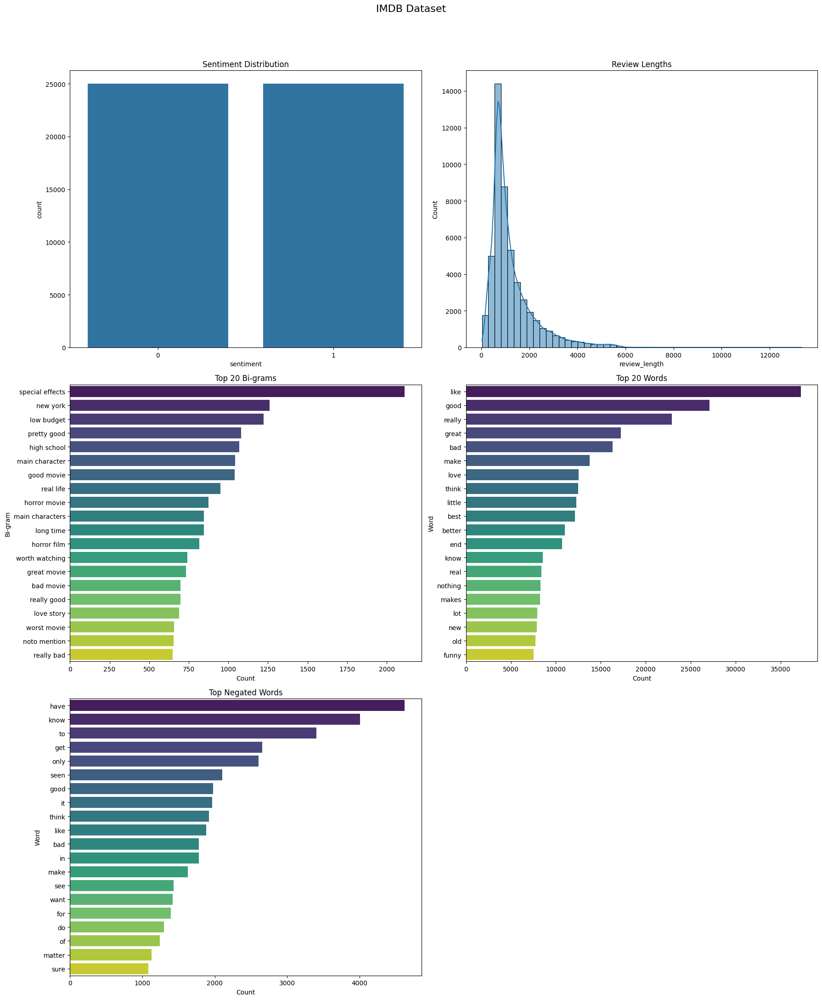

In [123]:
def plot_sentiment(ax, df):
    sns.countplot(x='sentiment', data=df, ax=ax)
    ax.set_title(f'Sentiment Distribution')

def plot_lengths(ax, df):
    df['review_length'] = df['review'].apply(len)
    sns.histplot(df['review_length'], bins=50, kde=True, ax=ax)
    ax.set_title(f'Review Lengths')

def plot_bigrams(ax, df):
    all_words = ' '.join(df['review'].str.lower()).split()
    bigrams = [
        f"{w1} {w2}" for w1, w2 in zip(all_words, all_words[1:])
        if w1 not in ENGLISH_STOP_WORDS and w1 not in WORDS_TO_REMOVE
        and w2 not in ENGLISH_STOP_WORDS
    ]
    common_bigrams = Counter(bigrams).most_common(20)
    words_df = pd.DataFrame(common_bigrams, columns=['Bi-gram', 'Count'])

    sns.barplot(x='Count', y='Bi-gram', data=words_df, palette='viridis', hue='Bi-gram', ax=ax, legend=False)
    ax.set_title(f'Top 20 Bi-grams')

def plot_unigrams(ax, df):
    all_words = ' '.join(df['review'].str.lower()).split()
    # Filter out from words_to_remove
    words_to_remove = WORDS_TO_REMOVE | ENGLISH_STOP_WORDS | SENTENCE_STARTERS
    all_words = [w for w in all_words if w not in words_to_remove]
    common_unigrams = Counter(all_words).most_common(20)

    words_df = pd.DataFrame(common_unigrams, columns=['Word', 'Count'])
    sns.barplot(x='Count', y='Word', data=words_df, palette='viridis', hue='Word', ax=ax, legend=False)
    ax.set_title(f'Top 20 Words')
def plot_negation_targets(ax, df):
    neg3_df = pd.DataFrame(neg3_counter.most_common(20), columns=['Word', 'Count'])
    sns.barplot(
        x='Count',
        y='Word',
        data=neg3_df.head(20),
        palette='viridis',
        hue='Word',
        ax=ax,
        legend=False
    )
    ax.set_title('Top Negated Words')

def plot_review_dataset_grid(df, title_prefix="Dataset"):
    print(f"\n=== EDA for {title_prefix} ===")

    # Create the list of functions to be called by plot_grid
    # We use a lambda to "pre-fill" the df and title_prefix arguments
    fns = [
        lambda ax: plot_sentiment(ax, df),
        lambda ax: plot_lengths(ax, df),
        lambda ax: plot_bigrams(ax, df),
        lambda ax: plot_unigrams(ax, df),
        lambda ax: plot_negation_targets(ax, df)
    ]

    # Call the grid plotter
    plot_grid(
        plot_functions=fns,
        n_cols=2,           # Adjust based on preference
        figsize_per_plot=(9, 8),
        suptitle=title_prefix,
        sharex=False,       # Important: These plots have different X scales
        sharey=False        # Important: These plots have different Y scales
    )

# Run it
plot_review_dataset_grid(movie_reviews_advanced, title_prefix="IMDB Dataset")

## Data Splitting
We chose several models listed below, and incorporated a train/test split ratio of 80/20, with roughly 40,000 reviews for training and 10,000 reviews for validation, enabling stratification. There is no cross-contamination of train/test data nor is there data-leakage.

In [118]:
# Data for basic cleaning models
X = movie_reviews_basic['review']
# Convert to binary
y = movie_reviews_basic['sentiment']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=RNG_STATE)


# Data for advanced cleaning models
X_adv = movie_reviews_advanced['review']
y_adv = movie_reviews_advanced['sentiment']
X_train_adv, X_test_adv, y_train_adv, y_test_adv = train_test_split(X_adv, y_adv, test_size=0.2, stratify=y_adv, random_state=RNG_STATE)


# 3. Modeling and Evaluation




## ML Models
To convert the cleaned text into machine learning ready features, we applied TF IDF vectorization, which down weights common tokens and highlights sentiment bearing terms. We used English stop words to remove non informative function words and capped the vocabulary at 30,000 features to balance dimensionality, sparsity, and performance while still capturing rare but meaningful bi-grams such as our engineered "nogood" tokens. We have found this limit to strike a good balance between capturing a rich linguistic context, preventing the feature matrix from becoming too sparse, and having the highest accuracy metrics possible.

We chose several common ML algorithms designed for NLP: BAYES, LOGREG, SVC, and SGD . Here's what each of these models is designed to do:
1. BAYES: This multinomial model is a probabilistic classifier based on Bayes' theorem, commonly used for simple text classification. It assumes that the features (uni-grams or bi-grams in this case) are conditionally independent given the class (sentiment). It's particularly effective for discrete features like word counts or TF-IDF values.
2. LOGREG: A linear model for binary classification that fits a logistic function to estimate class probabilities. It is efficient, interpretable, and consistently reliable for high dimensional text classification.
3. SVC: A linear Support Vector Machine (SVM) that learns to separate hyperplanes in high dimensional space. Its ability to handle sparse TF IDF features and find robust linear decision boundaries makes it effective for large scale text classification.
4. SGD: A linear classifier trained via stochastic gradient descent using mini batch updates. With hinge loss it mimics a linear SVM, and with log loss it approximates LOGREG. Its incremental training makes it extremely fast and scalable on sparse TF IDF matrices while maintaining competitive accuracy.

We skipped the ensembles and tree classifiers, such as RF, GBC, and DT, as they were ill-suited for this task or resulted in poor performance and non-ending training times (not shown in our work). Since the best performance requires around 30,000 features, they were excluded due to the high dimensionality of our feature space. With 30,000 features, these models suffer from the curse of dimensionality, as the sparse nature of TF-IDF vectors leads to inefficient splitting and poor generalization compared to the robust, global optimization offered by linear classifiers like SVC and LOGREG. We also did not apply any other hyperparameter tuning, other than to set the random state to be consistent, or limiting the number of iterations to prevent non-ending training times.

Naïve Bayes (BAYES), Logistic Regression (LOGREG), Linear Support Vector Classifier (SVC), Stochastic Gradient Descent (SGD), Random Forest (RF), Decision Trees (DT), Gradient Boosting Classifier (GBC)

In [119]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.pipeline import Pipeline
from sklearn.linear_model import SGDClassifier
from sklearn.base import clone # To clone the model

# use random_state for consistency
algos = [
    ('BAYES', MultinomialNB()),
    ('LOGREG', LogisticRegression(max_iter=500, random_state=RNG_STATE)),
    ('SVC', LinearSVC(random_state=RNG_STATE)),
    ('SGD', SGDClassifier(loss="hinge", alpha=1e-4, random_state=RNG_STATE))

]


# Define the datasets to iterate over
datasets_to_train = [
    (DATASET.BASIC.value, X_train, y_train),
    (DATASET.ADV.value, X_train_adv, y_train_adv)
]

# This dictionary acts as your central "Database" of model names
model_registry = {}
model_registry["ALL_TRAD_MODELS"] = []
model_registry["TRAD_MODELS"] = []
model_registry["TRAD_MODELS_ADV"] = []

def register_and_get_name(algo_name, ds_type, is_bigram):
    """Handles naming logic and appends to the correct category lists."""
    # 1. Build the base name
    name = f"{algo_name}_{ds_type}" if ds_type == DATASET.ADV.value else algo_name

    # 2. Add Bigram suffix if applicable
    if is_bigram:
        name = f"{name}_{DATASET.BI.value}"

    # 3. Categorize
    model_registry["ALL_TRAD_MODELS"].append(name)

    if is_bigram:
        pass # Bigrams only go in ALL
    elif ds_type == DATASET.ADV.value:
        model_registry["TRAD_MODELS_ADV"].append(name)
    else:
        model_registry["TRAD_MODELS"].append(name)

    return name

# Mapping for the vectorizer
PREPROCESSORS = {
    DATASET.BASIC.value: clean_text_basic,
    DATASET.ADV.value: clean_text_advanced
}

trained_models = []

for ds_type, X_data, y_data in datasets_to_train:
    cleaner = PREPROCESSORS.get(ds_type)

    for is_bigram in [False, True]:
        ngram_range = (1, 2) if is_bigram else (1, 1)

        # 1. Vectorize ONCE for all algorithms in this group
        print(f"\n--- Vectorizing {ds_type} (Bi-Gram: {is_bigram}) ---")
        tfidf = TfidfVectorizer(
            preprocessor=cleaner,
            stop_words=list(ENGLISH_STOP_WORDS),
            max_features=30000,
            ngram_range=ngram_range
        )

        # Transform the data
        X_train_transformed = tfidf.fit_transform(X_data)

        for algo_name, model_obj in algos:
            current_name = register_and_get_name(algo_name, ds_type, is_bigram)
            print(f"Training {current_name}...")

            # 2. Fit the model directly on the transformed data
            model_clone = clone(model_obj)

            start = time.time()
            model_clone.fit(X_train_transformed, y_data)
            duration = time.time() - start

            # 3. Reconstruct a Pipeline for saving
            # (Ensures the model is still "plug-and-play" later)
            full_pipe = Pipeline([
                ('tfidf', tfidf),
                (algo_name, model_clone)
            ])

            print(f"Done: {duration:.2f}s")

            trained_models.append((current_name, full_pipe, duration, ds_type))
            joblib.dump(full_pipe, f"{current_name}.ml.joblib")

print("\nALL TRAINING COMPLETE")



--- Vectorizing BASIC (Bi-Gram: False) ---
Training BAYES...
Done: 0.02s
Training LOGREG...
Done: 3.96s
Training SVC...
Done: 1.09s
Training SGD...
Done: 0.22s

--- Vectorizing BASIC (Bi-Gram: True) ---
Training BAYES_BI...
Done: 0.02s
Training LOGREG_BI...
Done: 4.75s
Training SVC_BI...
Done: 1.04s
Training SGD_BI...
Done: 0.26s

--- Vectorizing ADV (Bi-Gram: False) ---
Training BAYES_ADV...
Done: 0.02s
Training LOGREG_ADV...
Done: 4.42s
Training SVC_ADV...
Done: 1.92s
Training SGD_ADV...
Done: 0.22s

--- Vectorizing ADV (Bi-Gram: True) ---
Training BAYES_ADV_BI...
Done: 0.02s
Training LOGREG_ADV_BI...
Done: 1.93s
Training SVC_ADV_BI...
Done: 2.03s
Training SGD_ADV_BI...
Done: 0.23s

ALL TRAINING COMPLETE


## Evaluation
The following metrics in Figure 2 indicate the performance of such ML models. We excluded time metrics (2b) individually as they are not consistent based on the environment but can be a useful baseline comparison against NNs and LLMs. ML models typically take seconds to train and even less to predict, while vectorizing typically takes under 15 seconds (not shown), while being longer with bi-grams are included.

1. BAYES: As the simplest model, it achieved the lowest score out of all our models, not including excluded ML models. Its accuracy metrics hover at around 88.3%.
2. LOGREG: Demonstrated one the highest accuracy metrics among the four ML models, at around 90.8%-90.9%.
3. SVC and SGD: At around 90.6%-90.7%.



In [120]:
traditional_outputs = [] # New list to store predictions and related info

TIME_COLS = ['Prediction Time (s)','Training Time (s)' ]
for name, pipe, total_time, mod in trained_models:
    # Select the appropriate X_test and y_test based on the 'mod' flag
    if mod == DATASET.ADV.value:
        X_test_actual, y_true_actual = X_test_adv, y_test_adv
    else:
        X_test_actual, y_true_actual = X_test, y_test

    start_pred = time.time()
    preds = pipe.predict(X_test_actual)
    end_pred = time.time()
    pred_time = end_pred - start_pred
    print(f"Prediction time {name}: {pred_time:.2f}s")

    # Store results in traditional_outputs
    traditional_outputs.append({
        'name': name,
        'y_pred': preds,
        'y_true': y_true_actual,
        'X_test_text': X_test_actual, # Store X_test_actual for misclassification analysis
        'pred_time': pred_time, # Store prediction time
        'train_time': total_time # Store training time
    })

Prediction time BAYES: 2.84s
Prediction time LOGREG: 2.83s
Prediction time SVC: 2.81s
Prediction time SGD: 2.90s
Prediction time BAYES_BI: 3.61s
Prediction time LOGREG_BI: 3.60s
Prediction time SVC_BI: 3.72s
Prediction time SGD_BI: 3.65s
Prediction time BAYES_ADV: 6.31s
Prediction time LOGREG_ADV: 6.35s
Prediction time SVC_ADV: 6.32s
Prediction time SGD_ADV: 6.34s
Prediction time BAYES_ADV_BI: 7.19s
Prediction time LOGREG_ADV_BI: 7.14s
Prediction time SVC_ADV_BI: 7.22s
Prediction time SGD_ADV_BI: 7.18s



--- Processing Traditional Models ---

--- Best Traditional Models by Base Category ---
['BAYES_ADV_BI', 'LOGREG_ADV_BI', 'SGD_ADV_BI', 'SVC_ADV_BI']


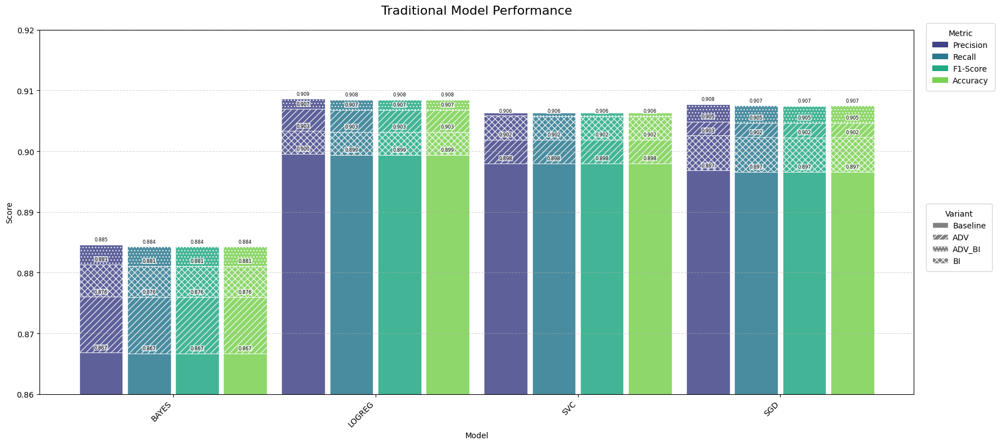

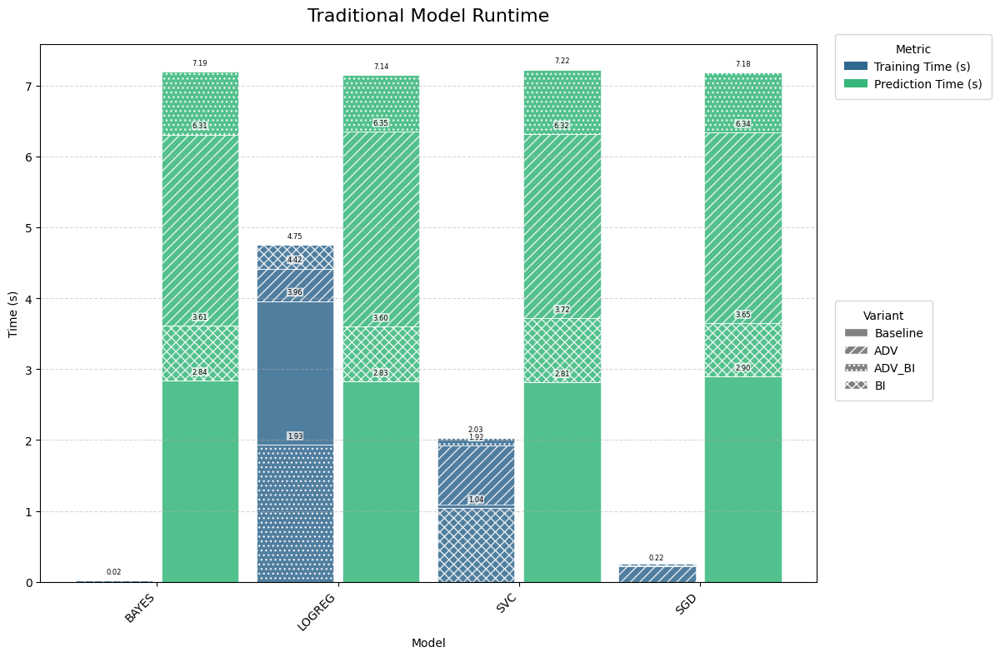

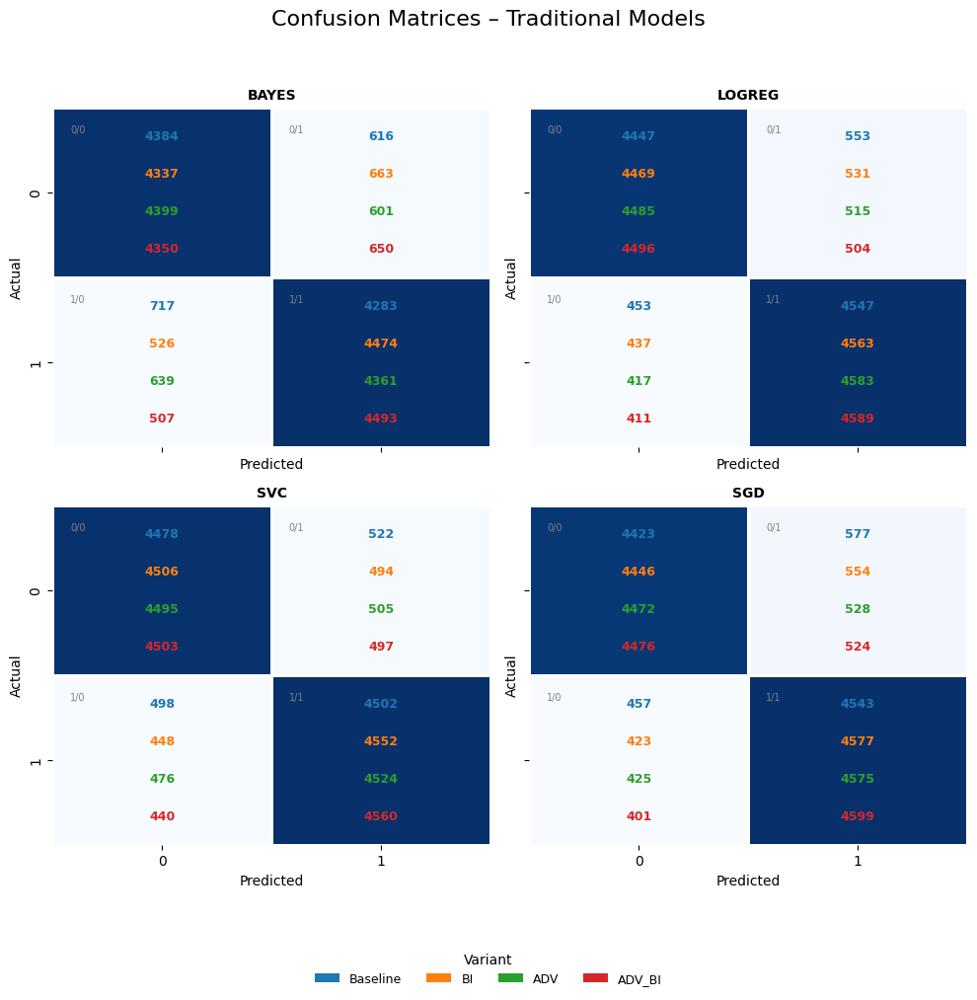

In [121]:
# Now, process the collected traditional_outputs
trad_metrics_df, trad_time_df, trad_cm_plotters, trad_cm_legend = process_model_outputs(traditional_outputs, "Traditional")
model_registry["BEST_TRAD_MODELS"] = get_best_models_summary(trad_metrics_df, "Traditional")['Variant'].tolist()

print("\n--- Best Traditional Models by Base Category ---")
print(model_registry["BEST_TRAD_MODELS"])

plot_model_metrics(
    trad_metrics_df,
    title="Traditional Model Performance",
    ylim=(0.86, 0.92),
    fmt="%.3f"
)

plot_model_metrics(
    trad_time_df,
    title="Traditional Model Runtime",
    y_label="Time (s)",
    fmt="%.2f"
)
plot_grid(
    trad_cm_plotters, # Use the list generated by process_model_outputs
    n_cols=2,
    figsize_per_plot=(5, 5),
    suptitle="Confusion Matrices – Traditional Models",
    legend_fn=trad_cm_legend
)

adv_bi_models = [m for m in model_registry['ALL_TRAD_MODELS'] if DATASET.ADV.value in m and DATASET.BI.value in m]
basic_bi_models = [m for m in model_registry['ALL_TRAD_MODELS'] if DATASET.BI.value in m and DATASET.ADV.value not in m]


## Justification and Variants
Specifically for ML models, we attempt to justify our preprocessing steps with four additional variants after BASE: ADV and BI.
1. BASE: This is when the model is trained under simple cleaning without the three additional techniques. This is a baseline measure to quantify the effectiveness of our preprocessing.
2. ADV: This is when we applied the three additional techniques.
3. BI: This is when we allowed the TF-IDF to include both uni-grams and bi-grams.
Figure 3 demonstrates how much of the performance lift we gained from applying ADV and BI, and Figure 4 shows the change in FPs/FNs, which therefore increased TPs/TNs, due to these techniques.


The BI Tradeoff: Applying BI sometimes increased FPs. Bi-grams are distinctly rare features that might occasionally correlate with the wrong class or be dropped. Additionally, certain uni-grams might be dropped if certain bi-grams are common, and vice versa.

Overall, these metrics demonstrate that while linear models are inherently robust, pushing performance past the 90% threshold for several models. The notable reduction in FNs suggests that our preprocessing successfully captured 'hidden' POS or NEG sentiment, which standard uni-gram models typically miss, turning previously ambiguous reviews into clear, actionable signals for these models.


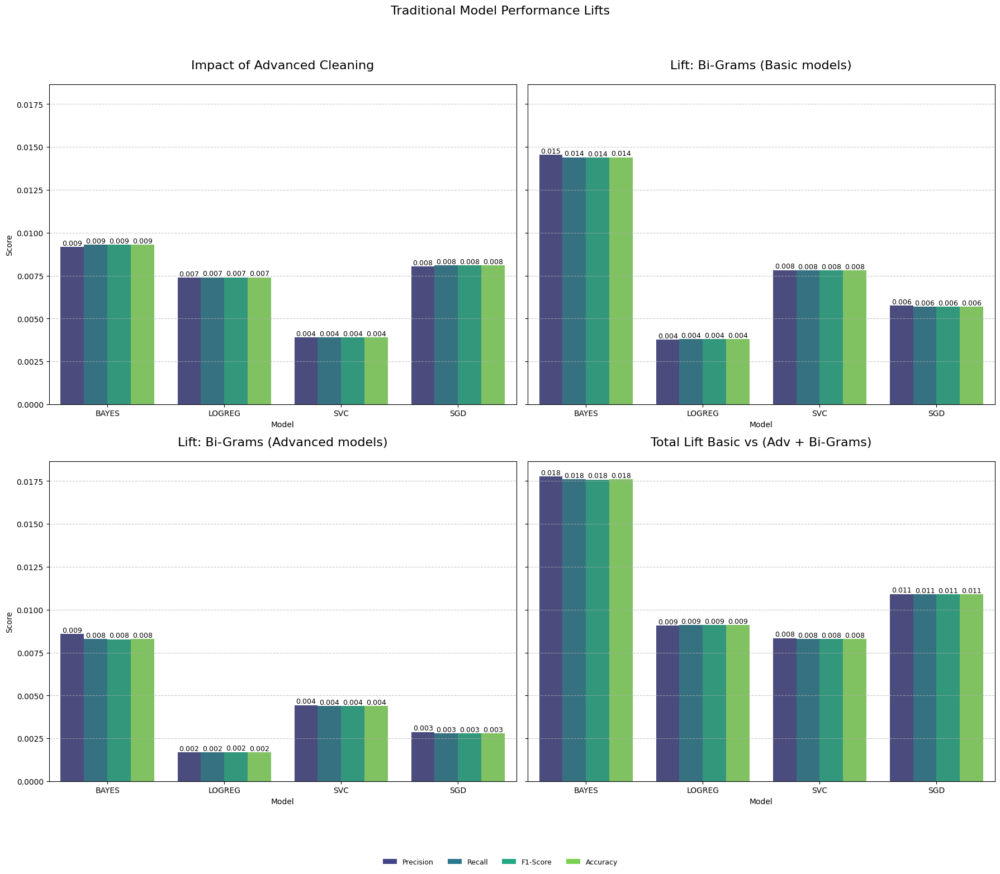

In [124]:
def get_metric_diff_plotter(df, base_models, target_models, title):
    """
    Calculates the difference and returns a plotter function compatible with plot_grid.
    """
    diff_metrics = []

    for target_name in target_models:
        algo_prefix = target_name.split('_')[0]
        base_name = next((m for m in base_models if m.startswith(algo_prefix)), None)

        if not base_name: continue

        metrics = df[df['Model'] == target_name]['Metric'].unique()
        for metric in metrics:
            try:
                base_score = df[(df['Model'] == base_name) & (df['Metric'] == metric)]['Score'].iloc[0]
                target_score = df[(df['Model'] == target_name) & (df['Metric'] == metric)]['Score'].iloc[0]
                diff_metrics.append({
                    'Model': algo_prefix,
                    'Metric': metric,
                    'Score': target_score - base_score
                })
            except: continue

    diff_df = pd.DataFrame(diff_metrics)

    # Return a function that plot_grid can call later
    def plotter(ax):
        if not diff_df.empty:
            plot_model_metrics(diff_df, title=title, show=False, ax=ax)
        else:
            ax.set_title(f"No data: {title}")

    return plotter



def plot_comparative_impact_grid():
    """
    Bundles the four metric difference plots into a 2x2 grid.
    """
    df = trad_metrics_df[trad_metrics_df['Model'].isin(model_registry['ALL_TRAD_MODELS'])]
    # Define the specific scenarios using lambdas
    # 1. Generate the plotting functions

    fns = [
        get_metric_diff_plotter(df,
                                model_registry['TRAD_MODELS'],
                                model_registry['TRAD_MODELS_ADV'],
                                "Impact of Advanced Cleaning"),

        get_metric_diff_plotter(df,
                                model_registry['TRAD_MODELS'],
                                basic_bi_models,
                                "Lift: Bi-Grams (Basic models)"),

        get_metric_diff_plotter(df,
                                model_registry['TRAD_MODELS_ADV'],
                                adv_bi_models,
                                "Lift: Bi-Grams (Advanced models)"),

        get_metric_diff_plotter(df,
                                model_registry['TRAD_MODELS'],
                                adv_bi_models,
                                "Total Lift Basic vs (Adv + Bi-Grams)")
    ]

    # 2. Plot the grid
    plot_grid(
        plot_functions=fns,
        n_cols=2,
        figsize_per_plot=(9, 8),
        suptitle="Traditional Model Performance Lifts",
        sharex=False,
        sharey=True
    )

plot_comparative_impact_grid()

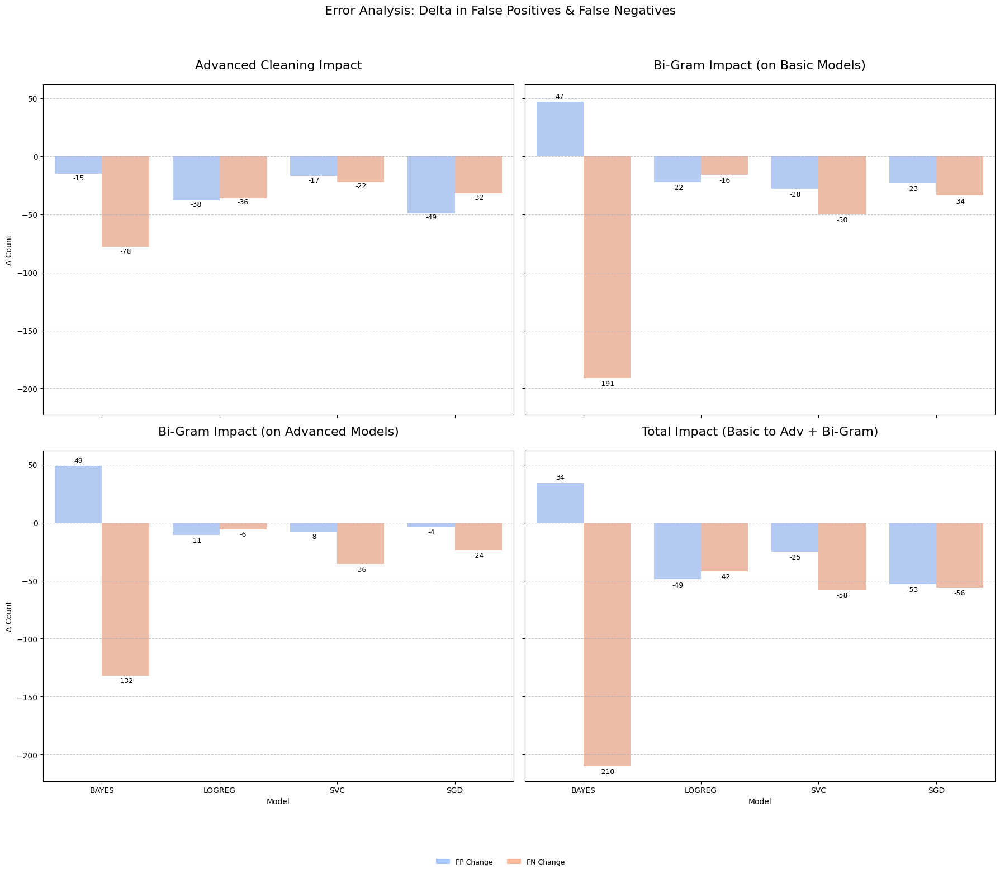

(<Figure size 1800x1600 with 4 Axes>,
 [<Axes: title={'center': 'Advanced Cleaning Impact'}, xlabel='Model', ylabel='Δ Count'>,
  <Axes: title={'center': 'Bi-Gram Impact (on Basic Models)'}, xlabel='Model', ylabel='Δ Count'>,
  <Axes: title={'center': 'Bi-Gram Impact (on Advanced Models)'}, xlabel='Model', ylabel='Δ Count'>,
  <Axes: title={'center': 'Total Impact (Basic to Adv + Bi-Gram)'}, xlabel='Model', ylabel='Δ Count'>])

In [125]:
def get_fp_fn_diff_plotter(base_list, target_list, title, results_list):
    """
    Calculates FP/FN deltas and returns a plotter function for plot_grid.
    """
    fp_fn_diff_data = []

    # Map model names to their predictions for quick lookup
    outputs_map = {m['name']: m for m in results_list}

    for target_name in target_list:
        algo_prefix = target_name.split('_')[0]
        base_name = next((m for m in base_list if m.startswith(algo_prefix)), None)

        if not base_name or target_name not in outputs_map or base_name not in outputs_map:
            continue

        # Target Matrix
        tn_t, fp_t, fn_t, tp_t = confusion_matrix(
            outputs_map[target_name]['y_true'],
            outputs_map[target_name]['y_pred']
        ).ravel()

        # Base Matrix
        tn_b, fp_b, fn_b, tp_b = confusion_matrix(
            outputs_map[base_name]['y_true'],
            outputs_map[base_name]['y_pred']
        ).ravel()

        fp_fn_diff_data.append({'Model': algo_prefix, 'Metric': 'FP Change', 'Score': int(fp_t - fp_b)})
        fp_fn_diff_data.append({'Model': algo_prefix, 'Metric': 'FN Change', 'Score': int(fn_t - fn_b)})

    diff_df = pd.DataFrame(fp_fn_diff_data)

    # This is the function plot_grid will call
    def plotter(ax):
        if not diff_df.empty:
            plot_model_metrics(
                diff_df,
                title=title,
                y_label="Δ Count",
                fmt="%.0f",
                palette="coolwarm",
                show=False, # Crucial: don't pop up a new window
                ax=ax        # Use the grid axis
            )
        else:
            ax.set_title(f"No data: {title}")

    return plotter


# 1. Build the list of plotter functions
error_fns = [
    get_fp_fn_diff_plotter(
        model_registry['TRAD_MODELS'],
        model_registry['TRAD_MODELS_ADV'],
        "Advanced Cleaning Impact",
        traditional_outputs
    ),
    get_fp_fn_diff_plotter(
        model_registry['TRAD_MODELS'],
        basic_bi_models,
        "Bi-Gram Impact (on Basic Models)",
        traditional_outputs
    ),
    get_fp_fn_diff_plotter(
        model_registry['TRAD_MODELS_ADV'],
        adv_bi_models,
        "Bi-Gram Impact (on Advanced Models)",
        traditional_outputs
    ),
    get_fp_fn_diff_plotter(
        model_registry['TRAD_MODELS'],
        adv_bi_models,
        "Total Impact (Basic to Adv + Bi-Gram)",
        traditional_outputs
    ),
]

# 2. Plot it
plot_grid(
    plot_functions=error_fns,
    n_cols=2,
    figsize_per_plot=(9, 8),
    suptitle="Error Analysis: Delta in False Positives & False Negatives",
    sharey=True # Useful here to compare the magnitude of error reduction across methods
)

## Feature Importance for ML Models
To better understand how each traditional ML model makes decisions, we examined the top ten positive and negative TF IDF features across the preprocessing variants (BASE, ADV, BI, ADV_BI) in Figure 5. These plots highlight which tokens most strongly influence the model toward predicting POS/NEG sentiment.

1. Model Decision Logic: In all ML models, highly polarized adjectives like "great," "excellent," and "best" dominate the positive coefficients, while "worst," "awful," and "waste" drive negative predictions. This is expected, as they are the most frequently mentioned uni-grams in Figure 1d.

2. Negation Grouping and Contraction Expansion: Our engineered tokens did not seem to make any impact on the top ten features, and we are surprised to see "noperfect" in POS in BAYES. We would think that "no[t] perfect" is a positive indicator. This may explain the increase in FPs in Figure 4.  We do note that our engineered tokens are likely uncommon, since it is a bigram mimicking a unigram.

3. Impact of Rating Normalization: All ADV variants clearly show our engineered rating tokens (e.g., 810, 710, 910) emerging as top-tier positive features, while lower ratings (e.g., 410, 310, 210) serve as strong negative anchors. Note that for our basic text preprocessing, basic symbols were removed, so if the original review states "8/10" would be converted to "810", while others remained untouched. Most notably, SVC saw more of these rating tokens as important features compared to non-ADV variants. If Negation Grouping is only a minor feature, then this technique is likely to increase the performance of the ML models.

4. Contextual Bi-grams: The BI variants did not seem to have much importance in the top ten, except for BAYES. This is expected, as shown in Figure 1c and 1d, uni-gram counts dominate over bi-grams. Phrases like "highly recommend", "wonderful film", and "cast excellent", appear in the top ten.


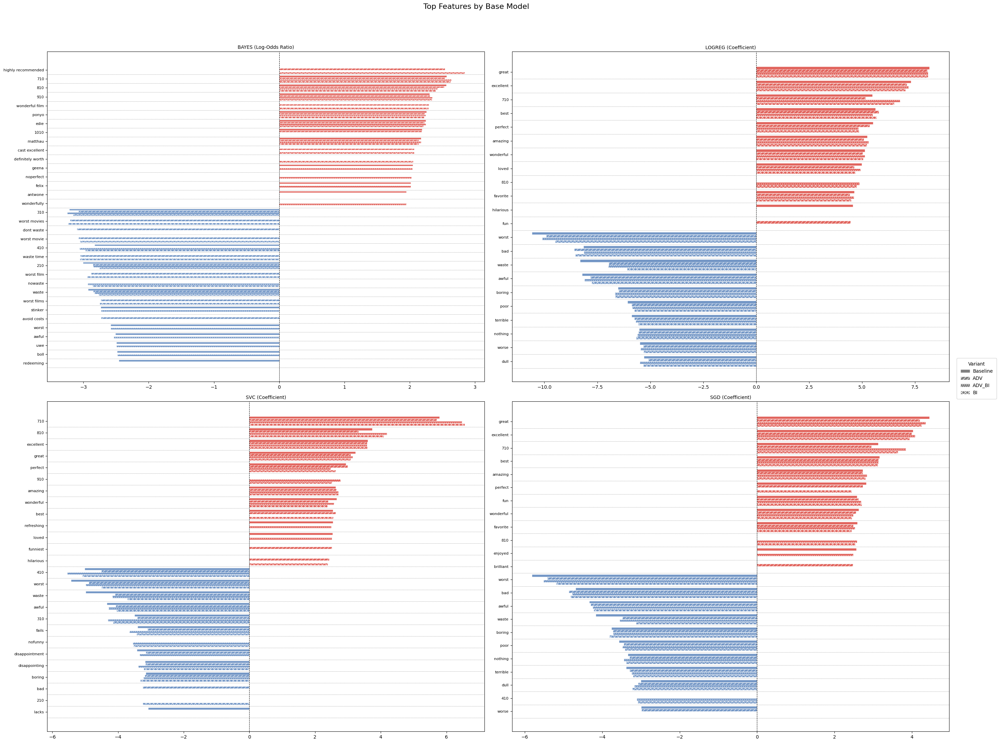

In [126]:
def plot_feat_grid():
    all_names   = [name for name, *_ in trained_models]
    variant_map = _infer_variants(all_names)  # compute once

    variant_groups = defaultdict(dict)
    for name, pipe, _, _ in trained_models:
        base, variant = variant_map[name]
        variant_groups[base][variant] = pipe

    def make_feature_plotter(base_model, variants: dict[str, any]):
        all_dfs      = {}
        title_suffix = ""  # <-- hoist here

        for variant_key, pipe in variants.items():
            vectorizer = pipe.named_steps['tfidf']
            clf_step   = base_model.split('_')[0]
            classifier = pipe.named_steps[clf_step]
            features   = vectorizer.get_feature_names_out()

            if clf_step.startswith('BAYES'):
                coefs        = classifier.feature_log_prob_[1] - classifier.feature_log_prob_[0]
                title_suffix = "(Log-Odds Ratio)"
            elif hasattr(classifier, 'coef_'):
                coefs        = classifier.coef_.flatten()
                title_suffix = "(Coefficient)"
            else:
                all_dfs[variant_key] = None
                continue

            df = pd.DataFrame({'Feature': features, 'Value': coefs}).sort_values('Value', ascending=False)
            all_dfs[variant_key] = pd.concat([df.head(10), df.tail(10)])

        if all(v is None for v in all_dfs.values()):
            return lambda ax: ax.text(0.5, 0.5, "No coefficients", ha='center', va='center')

        # Union of all variants' top features, deduped in insertion order
        seen = {}
        for variant_key, df in all_dfs.items():
            if df is None:
                continue
            for feature in df['Feature'].tolist():
                if feature not in seen:
                    seen[feature] = variant_key

        # Sort: positives desc, negatives asc — by max absolute value across variants
        def max_abs(feature):
            vals = []
            for df in all_dfs.values():
                if df is None:
                    continue
                match = df[df['Feature'] == feature]['Value']
                if not match.empty:
                    vals.append(abs(match.iloc[0]))
            return max(vals) if vals else 0

        def first_value(feature):
            for df in all_dfs.values():
                if df is None:
                    continue
                match = df[df['Feature'] == feature]['Value']
                if not match.empty:
                    return match.iloc[0]
            return 0

        pos_features  = sorted([f for f in seen if first_value(f) >= 0], key=max_abs, reverse=True)
        neg_features  = sorted([f for f in seen if first_value(f) <  0], key=max_abs, reverse=True)
        feature_order = pos_features + neg_features
        variant_keys  = list(all_dfs.keys())
        hatch_map     = _assign_hatches(variant_keys)
        n_variants    = len(variant_keys)
        bar_height    = 0.8 / n_variants

        def plotter(ax):
            y_positions = np.arange(len(feature_order))
            for i, (variant_key, df) in enumerate(all_dfs.items()):
                if df is None:
                    continue
                value_map = dict(zip(df['Feature'], df['Value']))
                values    = [value_map.get(f, 0) for f in feature_order]
                offset    = (i - n_variants / 2 + 0.5) * bar_height
                colors    = ['#d73027' if v >= 0 else '#4575b4' for v in values]

                for j, (val, color) in enumerate(zip(values, colors)):
                    ax.barh(
                        y_positions[j] + offset, val,
                        height=bar_height * 0.9,
                        color=color, alpha=0.75,
                        hatch=hatch_map[variant_key],
                        edgecolor='white', linewidth=0.5,
                        label=variant_key if j == 0 else None
                    )

            ax.set_yticks(y_positions)
            ax.set_yticklabels(feature_order, fontsize=8)
            ax.axvline(0, color='black', linewidth=0.8, linestyle='--')
            ax.set_title(f'{base_model} {title_suffix}', fontsize=10)
            ax.invert_yaxis()
            # Thin dotted separator between each feature row
            for y in y_positions + 0.5:
                ax.axhline(y, color='grey', linewidth=0.75, linestyle=':', alpha=1)

        return plotter

    plotters = [make_feature_plotter(base, variants) for base, variants in variant_groups.items()]

    all_variants = ["BASE"] + sorted(v for v in
        {variant for variants in variant_groups.values() for variant in variants}
        if v != "BASE"
    )
    hatch_map = _assign_hatches(all_variants)
    plot_grid(
        plotters,
        n_cols=2,
        figsize_per_plot=(14, 12),
        suptitle="Top Features by Base Model",
        sharex=False,
        sharey=False,
        legend_fn=lambda fig: make_variant_legend(fig, all_variants, hatch_map)
    )

plot_feat_grid()

# Neural Networks
We have chosen four basic categories of NNs suitable for NLP, such as LSTM (RNN), CNN, GRU, and MLP using TensorFlow as an experimental feature before LLMs, to see if they add any potential performance improvements over ML models. All of them have the same generic parameters at 128 embedding dimensions, batch size of 128, dropout rate of 0.5, and a max sequence length and words capped at 1,024 and 10,000 tokens, respectively.
1. LSTM: An improved form of the traditional RNN that adds gated memory cells to address vanishing gradient issues and better capture long range dependencies in text. This makes LSTMs far more effective and stable than basic RNNs for sentiment analysis.
2. CNN: A model usually made for image classification but can be used to identify local n gram features through sliding windows, reducing the need for Negation Grouping.
3. GRU: A simpler alternative to LSTMs that uses fewer gates while still modeling sequence dependencies, often achieving similar accuracy with reduced training cost.
4. MLP: A simple feed forward network applied to dense embeddings. While less expressive than sequence models, it provides a fast baseline for nonlinear decision boundaries, compared to using sentence transformers or external embeddings to encode the text.


## Data Preparation and Helper Functions

In [17]:
def clean_text_nn(text):
    # Remove HTML tags
    text = RE_HTML.sub(' ', text)
    # Remove links (www or http)
    text = RE_LINK.sub(' ', text)

    # Lowercase
    text = text.lower()

    # --- Contraction expansion (before negation grouping) ---
    for pattern, repl in CONTRACTIONS.items():
        text = re.sub(pattern, repl, text)
    return text

movie_reviews_nn = reviews.copy(deep=True)
movie_reviews_nn['review'] = movie_reviews_nn['review'].progress_apply(clean_text_nn)
print(movie_reviews_nn.head())

Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

                                              review  sentiment
0  one of the other reviewers has mentioned that ...          1
1  a wonderful little production.   the filming t...          1
2  i thought this was a wonderful way to spend ti...          1
3  basically there's a family where a little boy ...          0
4  petter mattei's "love in the time of money" is...          1


In [18]:
X_nn = movie_reviews_nn['review']
y_nn = movie_reviews_nn['sentiment']
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X_nn, y_nn, test_size=0.2, random_state=RNG_STATE)

In [127]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import (
    Embedding, Bidirectional, LSTM, Dense,
    Dropout, SpatialDropout1D, Conv1D,
    GlobalMaxPooling1D, GlobalAveragePooling1D,
    GRU
)
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam

def prepare_sequences(X_train, X_test, y_train, y_test, max_words, max_sequence_length):
    tokenizer = Tokenizer(num_words=max_words, oov_token="<unk>")
    tokenizer.fit_on_texts(X_train)

    X_train_seq = tokenizer.texts_to_sequences(X_train)
    X_test_seq = tokenizer.texts_to_sequences(X_test)

    X_train_pad = pad_sequences(X_train_seq, maxlen=max_sequence_length, padding='post', truncating='post')
    X_test_pad = pad_sequences(X_test_seq, maxlen=max_sequence_length, padding='post', truncating='post')

    return X_train_pad, X_test_pad, y_train, y_test

def train_and_evaluate(model, X_train, y_train, X_test, y_test, epochs, batch_size):
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True, verbose=1)
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6, verbose=1)

    start_train = time.time()
    history = model.fit(
        X_train, y_train,
        validation_split=0.2,
        epochs=epochs,
        batch_size=batch_size,
        callbacks=[early_stopping, reduce_lr],
        verbose=1
    )
    train_time = time.time() - start_train

    start_pred = time.time()
    proba = model.predict(X_test)
    pred_time = time.time() - start_pred
    preds = (proba > 0.5).astype(int).flatten()

    return train_time, pred_time, preds

# Define common parameters for NN models
nn_model_params = {
    'batch_size': 128,
    'max_words': 10000,
    'max_sequence_length': 1024,
    'embedding_dim':  128,
    'dropout_rate': 0.5
}

nn_outputs = []

def run_and_store_nn_results(build_model_fn, model_name, X_train, y_train, X_test, y_test, epochs, **model_specific_kwargs):
    """
    Generic function to run an NN model, evaluate it, and store results.
    """
    Xtr, Xte, ytr, yte = prepare_sequences(
        X_train, X_test, y_train, y_test,
        nn_model_params["max_words"], nn_model_params["max_sequence_length"]
    )

    # Combine common and model-specific kwargs
    all_kwargs = {**nn_model_params, **model_specific_kwargs}

    model = build_model_fn(
        max_words=all_kwargs["max_words"],
        embedding_dim=all_kwargs["embedding_dim"],
        dropout_rate=all_kwargs["dropout_rate"],
        **model_specific_kwargs
    )

    train_time, pred_time, preds = train_and_evaluate(
        model, Xtr, ytr, Xte, yte,
        epochs,
        all_kwargs["batch_size"]
    )

    nn_outputs.append({
        'name': model_name,
        'y_pred': preds,
        'y_true': yte,
        'train_time': train_time,
        'pred_time': pred_time,
        'X_test_text': X_test
    })
    model.summary()
    print(f"Finished running {model_name} model.")

    # Save the model
    model.save(f"{model_name}.keras")

# Set the tf seed
tf.random.set_seed(RNG_STATE)

## Long Short-Term Memory Network (LSTM)


In [128]:
def build_lstm(max_words, embedding_dim, lstm_units, dropout_rate):
    model = Sequential(name="BiLSTM_Sentiment")
    model.add(Embedding(max_words, embedding_dim, mask_zero=True))
    model.add(SpatialDropout1D(0.25))
    model.add(Bidirectional(LSTM(lstm_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the LSTM model and get results using the generic function
run_and_store_nn_results(
    build_lstm, "LSTM",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=5, lstm_units=72
)


Epoch 1/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 24s 83ms/step - accuracy: 0.6915 - auc: 0.7642 - loss: 0.5455 - val_accuracy: 0.8733 - val_auc: 0.9555 - val_loss: 0.2859 - learning_rate: 0.0010
Epoch 2/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.8965 - auc: 0.9577 - loss: 0.2621 - val_accuracy: 0.8840 - val_auc: 0.9565 - val_loss: 0.2958 - learning_rate: 0.0010
Epoch 3/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.9256 - auc: 0.9749 - loss: 0.2009 - val_accuracy: 0.8620 - val_auc: 0.9420 - val_loss: 0.4672 - learning_rate: 0.0010
Epoch 4/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9330 - auc: 0.9781 - loss: 0.1863
Epoch 4: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
250/250 ━━━━━━━━━━━━━━━━━━━━ 20s 78ms/step - accuracy: 0.9330 - auc: 0.9781 - loss: 0.1863 - val_accuracy: 0.8350 - val_auc: 0.9349 - val_loss: 0.3964 - learning_rate: 0.0010
Epoch 5/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 20s 79ms/step - accuracy: 0.9479 - auc: 0.9878 - loss: 

Model: "BiLSTM_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_4 (Embedding)         │ (128, 1024, 128)       │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_2             │ (128, 1024, 128)       │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ (128, 144)             │       115,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (128, 144)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (128, 64)              │         9,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (128, 64)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (128, 1)               │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,215,365 (16.08 MB)

 Trainable params: 1,405,121 (5.36 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,810,244 (10.72 MB)

Finished running LSTM model.


## Convolutional Neural Network (CNN)

In [129]:
def build_cnn(max_words, embedding_dim, filters, kernel_size, dropout_rate):
    model = Sequential(name="CNN_Sentiment")
    model.add(Embedding(max_words, embedding_dim))
    model.add(Dropout(0.2))
    model.add(Conv1D(filters, kernel_size, activation='relu'))
    model.add(GlobalMaxPooling1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the CNN model and get results using the generic function
run_and_store_nn_results(
    build_cnn, "CNN",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=5, filters=128, kernel_size=5
)


Epoch 1/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 17s 55ms/step - accuracy: 0.6376 - auc: 0.6892 - loss: 0.6110 - val_accuracy: 0.8790 - val_auc: 0.9502 - val_loss: 0.2910 - learning_rate: 0.0010
Epoch 2/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.8928 - auc: 0.9532 - loss: 0.2763 - val_accuracy: 0.9055 - val_auc: 0.9656 - val_loss: 0.2406 - learning_rate: 0.0010
Epoch 3/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9444 - auc: 0.9825 - loss: 0.1621 - val_accuracy: 0.9065 - val_auc: 0.9666 - val_loss: 0.2501 - learning_rate: 0.0010
Epoch 4/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 13s 51ms/step - accuracy: 0.9720 - auc: 0.9925 - loss: 0.0984 - val_accuracy: 0.8706 - val_auc: 0.9615 - val_loss: 0.3989 - learning_rate: 0.0010
Epoch 5/5
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.9759 - auc: 0.9957 - loss: 0.0738
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
250/250 ━━━━━━━━━━━━━━━━━━━━ 12s 50ms/step - accuracy: 0.9759 - auc: 0.9957 - loss: 

Model: "CNN_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_5 (Embedding)         │ (128, 1024, 128)       │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (128, 1024, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (128, 1020, 128)       │        82,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (128, 128)             │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (128, 64)              │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (128, 64)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (128, 1)               │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,111,109 (15.68 MB)

 Trainable params: 1,370,369 (5.23 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,740,740 (10.46 MB)

Finished running CNN model.


## Gated Recurrent Unit (GRU)

In [130]:
def build_gru(max_words, embedding_dim, gru_units, dropout_rate):
    model = Sequential(name="BiGRU_Sentiment")
    model.add(Embedding(max_words, embedding_dim, mask_zero=True))
    model.add(SpatialDropout1D(0.25))
    model.add(Bidirectional(GRU(gru_units, return_sequences=False)))
    model.add(Dropout(dropout_rate))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the GRU model and get results using the generic function
run_and_store_nn_results(
    build_gru, "GRU",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=5, gru_units=72
)


Epoch 1/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 23s 76ms/step - accuracy: 0.6350 - auc: 0.6934 - loss: 0.6070 - val_accuracy: 0.8700 - val_auc: 0.9503 - val_loss: 0.3129 - learning_rate: 0.0010
Epoch 2/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.8851 - auc: 0.9502 - loss: 0.2849 - val_accuracy: 0.8796 - val_auc: 0.9520 - val_loss: 0.2895 - learning_rate: 0.0010
Epoch 3/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.9180 - auc: 0.9702 - loss: 0.2185 - val_accuracy: 0.8825 - val_auc: 0.9517 - val_loss: 0.3245 - learning_rate: 0.0010
Epoch 4/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9373 - auc: 0.9813 - loss: 0.1719 - val_accuracy: 0.8821 - val_auc: 0.9480 - val_loss: 0.3817 - learning_rate: 0.0010
Epoch 5/5
250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.9520 - auc: 0.9882 - loss: 0.1327
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
250/250 ━━━━━━━━━━━━━━━━━━━━ 18s 73ms/step - accuracy: 0.9521 - auc: 0.9882 - loss: 

Model: "BiGRU_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_6 (Embedding)         │ (128, 1024, 128)       │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout1d_3             │ (128, 1024, 128)       │             0 │
│ (SpatialDropout1D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ (128, 144)             │        87,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (128, 144)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (128, 64)              │         9,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (128, 64)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (128, 1)               │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,129,829 (15.75 MB)

 Trainable params: 1,376,609 (5.25 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,753,220 (10.50 MB)

Finished running GRU model.


## Multi-Layer Perceptron (MLP)

In [131]:
def build_mlp(max_words, embedding_dim, dropout_rate):
    model = Sequential(name="MLP_Sentiment")
    model.add(Embedding(max_words, embedding_dim))
    model.add(GlobalAveragePooling1D()) # Aggregates the embeddings into a single vector
    model.add(Dropout(dropout_rate))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(
        optimizer=Adam(1e-3),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Run the MLP model and get results using the generic function
run_and_store_nn_results(
    build_mlp, "MLP",
    X_train_nn, y_train_nn, X_test_nn, y_test_nn,
    epochs=25
)


Epoch 1/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.5081 - auc: 0.5083 - loss: 0.6955 - val_accuracy: 0.5066 - val_auc: 0.5689 - val_loss: 0.6929 - learning_rate: 0.0010
Epoch 2/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5259 - auc: 0.5372 - loss: 0.6912 - val_accuracy: 0.5081 - val_auc: 0.7461 - val_loss: 0.6844 - learning_rate: 0.0010
Epoch 3/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.5820 - auc: 0.6127 - loss: 0.6720 - val_accuracy: 0.6971 - val_auc: 0.8312 - val_loss: 0.5833 - learning_rate: 0.0010
Epoch 4/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.6848 - auc: 0.7505 - loss: 0.5915 - val_accuracy: 0.7364 - val_auc: 0.9013 - val_loss: 0.4983 - learning_rate: 0.0010
Epoch 5/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7486 - auc: 0.8272 - loss: 0.5101 - val_accuracy: 0.6571 - val_auc: 0.9178 - val_loss: 0.6020 - learning_rate: 0.0010
Epoch 6/25
250/250 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - accuracy: 0.7622 - a

Model: "MLP_Sentiment"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_7 (Embedding)         │ (128, 1024, 128)       │     1,280,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_1      │ (128, 128)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (128, 128)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (128, 128)             │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (128, 128)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (128, 1)               │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,889,925 (14.84 MB)

 Trainable params: 1,296,641 (4.95 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,593,284 (9.89 MB)

Finished running MLP model.


## Evaluation
The following metrics in Figure 6 indicate the performance of such NNs. NNs typically take less than few minutes to train on a Tesla T4 and take more time than ML models for all tasks.

1. CNN: The only NN with accuracy metrics surpassing the 90% baseline.
2. LSTM, GRU, and MLP: All of them sit at sub-90%. None of them performed any better than ML models other than BAYES.



--- Processing Neural Network Models ---


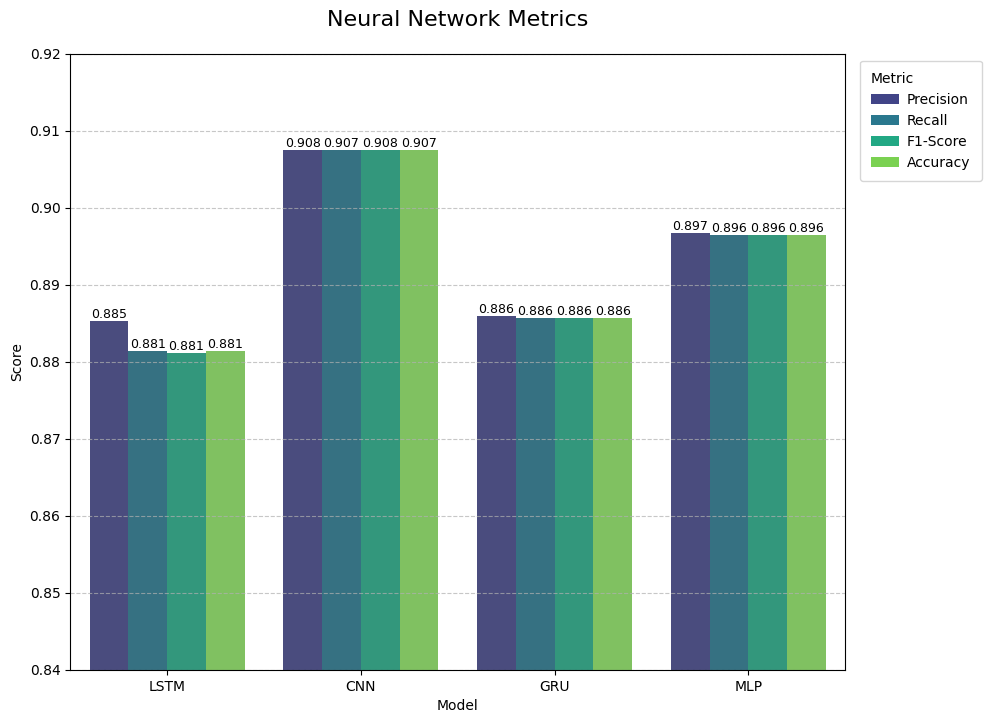

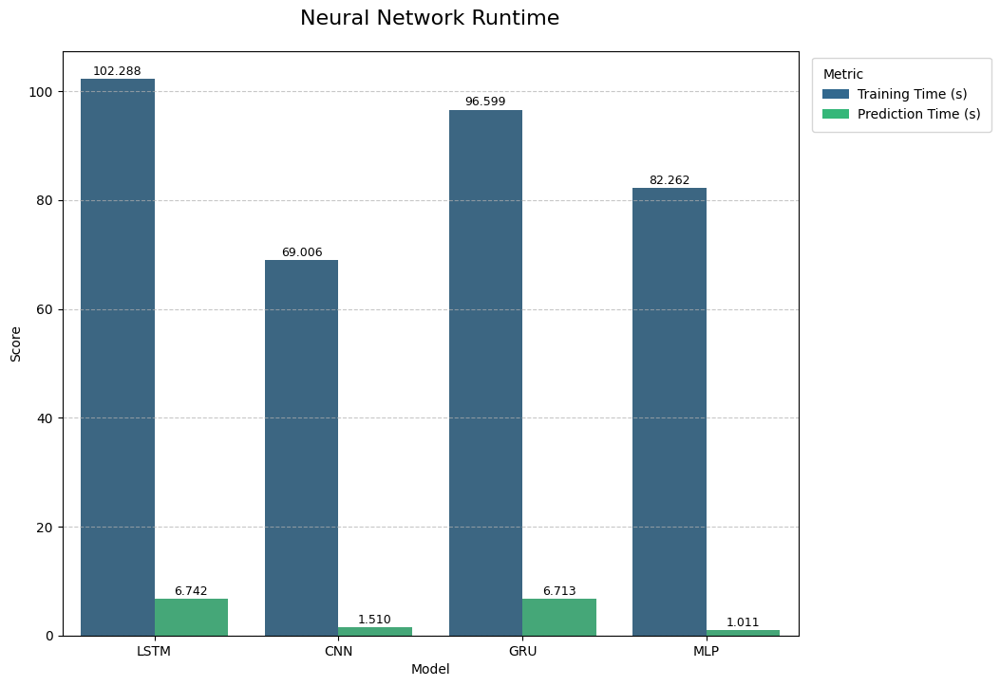

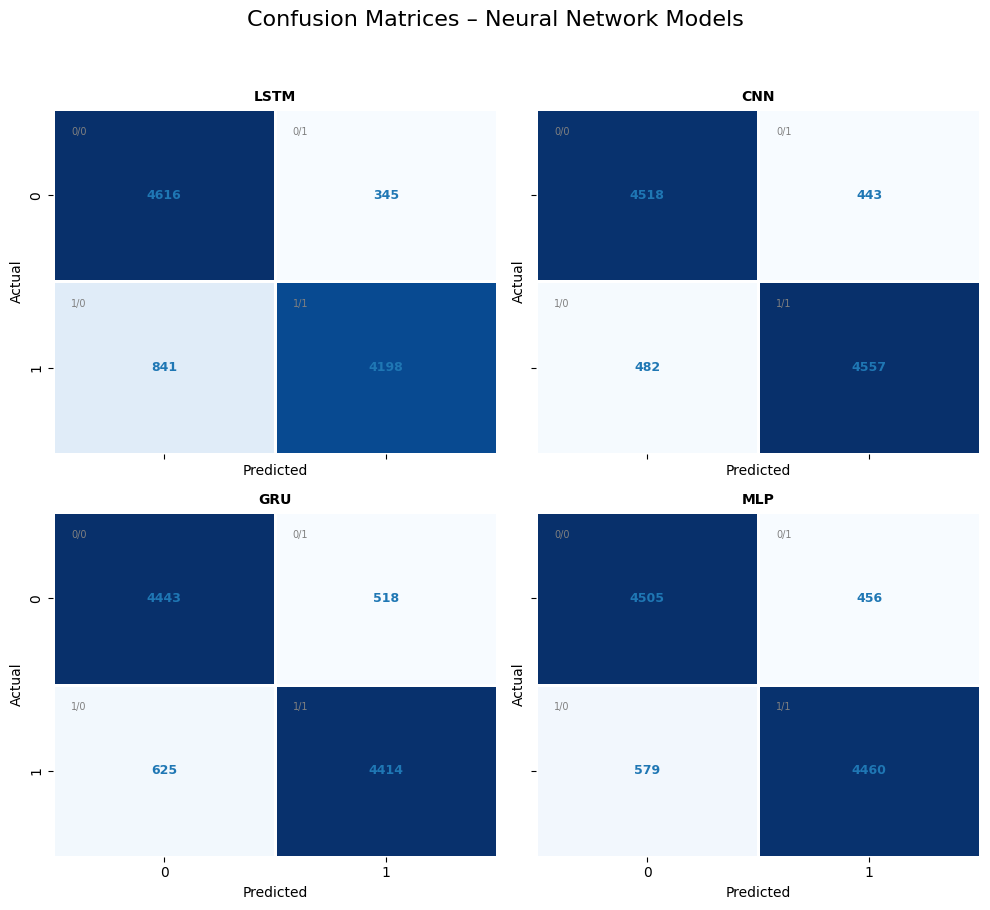

(<Figure size 1000x1000 with 4 Axes>,
 [<Axes: title={'center': 'LSTM'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'CNN'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'GRU'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'MLP'}, xlabel='Predicted', ylabel='Actual'>])

In [132]:
nn_metrics_df, nn_time_df, nn_cm_plotters, cm_legend = process_model_outputs(nn_outputs, "Neural Network")

plot_model_metrics(nn_metrics_df, "Neural Network Metrics", ylim=(0.84, 0.92), show=False)
plot_model_metrics(nn_time_df, "Neural Network Runtime", show=False)
# Create plotters for all processed NN models
plot_grid(
    nn_cm_plotters,
    n_cols=2,
    figsize_per_plot=(5.0, 5.0),
    suptitle="Confusion Matrices – Neural Network Models",
    sharex=True,
    sharey=True,
    legend_fn=cm_legend
)



# Large Language Models
As the final tier of our modeling pipeline, we fine tuned five LLMs to evaluate whether modern contextual embeddings and deep bidirectional attention provide measurable gains over both classical ML and lightweight neural networks. To prepare the movie review data for an LLM, we need to tokenize the text and encode the sentiment labels into a format suitable for model training. All models were used in their cased variants, truncated to their default lengths, and fine-tuned under a batch size of 24.
1. BERT: The original bidirectional transformer encoder by Google that captures semantic relationships in text, serving as a foundational baseline for NLP tasks at 110M parameters.
2. ALBERT: A 11.8M model that performs similarly to BERT with nearly 10x less parameters.
3. DistilBERT: A distilled version of BERT that retains most of its accuracy while offering faster training and lower computational cost at 65.8M parameters.
4. RoBERTa: A more aggressively trained BERT style 110M model by Facebook that removes next sentence prediction and uses larger training batches, often achieving superior performance on sentiment classification.
5. DistilRoBERTa: Like DistilBERT, but for RoBERTa at 85.7M parameters.



## Tokenization and Encoding for LLM Input


In [25]:
from datasets import Dataset
from transformers import (
    AutoTokenizer,
    DataCollatorWithPadding,
    AutoModelForSequenceClassification,
    TrainingArguments,
    Trainer
)

import gc
import torch
from huggingface_hub import login

def clean_text_llm(text):
    # Remove HTML tags
    text = RE_HTML.sub(' ', text)
    # Remove links (www or http)
    text = RE_LINK.sub(' ', text)

    return text

movie_reviews_llm = reviews.copy(deep=True)
movie_reviews_llm['review'] = movie_reviews_llm['review'].progress_apply(clean_text_llm)
print("--- LLM Cleaning ---")
print(movie_reviews_llm.head())


X_llm = movie_reviews_llm['review']
y_llm = movie_reviews_llm['sentiment']

X_train_llm, X_test_llm, y_train_llm, y_test_llm = train_test_split(X_llm, y_llm, test_size=0.2, random_state=RNG_STATE)

train_ds = Dataset.from_dict({"text": X_train_llm.tolist(), "label": y_train_llm})
test_ds  = Dataset.from_dict({"text": X_test_llm.tolist(),  "label": y_test_llm})


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

--- LLM Cleaning ---
                                              review  sentiment
0  One of the other reviewers has mentioned that ...          1
1  A wonderful little production.   The filming t...          1
2  I thought this was a wonderful way to spend ti...          1
3  Basically there's a family where a little boy ...          0
4  Petter Mattei's "Love in the Time of Money" is...          1


## Load and Configure LLM
Load a pre-trained LLM for sequence classification using the Hugging Face Transformers library. Configure the model for our binary sentiment classification task.


In [26]:
HF_HUB_OWNER = "DerivedFunction" # Leave this as None or rename
FAST_PATH = True
# Not a user of HF, set it to false
if not HF_HUB_OWNER:
    FAST_PATH = False

PUSH_TO_HUB = True # If pushing to Hub (Need proper HF_HUB_OWNER)
if PUSH_TO_HUB:
    login()

model_configs = {
    "albert/albert-base-v2": {"batch_size": 24, "fraction": 1, "simulated_train_time": 3670}, # 1:01:10
    "distilbert/distilbert-base-cased": {"batch_size": 24, "fraction": 1, "simulated_train_time": 1352}, # 22:32
    "distilbert/distilroberta-base": {"batch_size": 24, "fraction": 1, "simulated_train_time": 1375}, # 22:55
    "google-bert/bert-base-cased": {"batch_size": 24, "fraction": 1, "simulated_train_time": 2709}, # 45:09
    "FacebookAI/roberta-base": {"batch_size": 24, "fraction": 1, "simulated_train_time": 2644}, # 44:04
}
_used_short_names = defaultdict(int)

def generate_short_name(model_name):
    # Take the last part after the slash
    last = model_name.split("/")[-1].lower()

    # Split by dashes
    parts = last.split("-")

    # Try progressively longer prefixes
    for i in range(1, len(parts) + 1):
        candidate = "_".join(parts[:i]).upper()

        if _used_short_names[candidate] == 0:
            _used_short_names[candidate] = 1
            return candidate

    # If all prefixes are taken, append a counter
    base = "_".join(parts).upper()
    _used_short_names[base] += 1
    return f"{base}_{_used_short_names[base]}"

for model_name, config in model_configs.items():
    short_name = generate_short_name(model_name)
    config["short_name"] = short_name

    # Local output directory name (e.g., "albert_imdb")
    local_output_name = f"{short_name.lower()}-imdb"
    config["local_output_name"] = local_output_name

    # Full Hugging Face Hub model ID (e.g., "username/albert_imdb")
    config["hf_hub_model_id"] = f"{HF_HUB_OWNER}/{local_output_name}"

def get_tokenizer(model_path_or_name):
    return AutoTokenizer.from_pretrained(model_path_or_name)

def get_data_collator(tokenizer):
    return DataCollatorWithPadding(tokenizer=tokenizer)

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=1)
    return {"accuracy": accuracy_score(labels, preds)}

LOG_FILE = "training_log.jsonl"
# Simple external log file to prevent a 0 time when training is resumed or the
# Trainer state is reinitialized
def log_event(event):
    with open(LOG_FILE, "a") as f:
        f.write(json.dumps(event) + "\n")

def get_cumulative_train_time(model_name, log_file="training_log.jsonl"):
    total = 0.0
    try:
        with open(log_file, 'r') as f:
            for line in f:
                entry = json.loads(line.strip())
                if entry.get("model_name") == model_name:
                    total += entry.get("runtime_sec", 0.0)
    except FileNotFoundError:
        pass
    return total

def run_single_model(model_name, push_to_hub=False, use_fast_path=False):
    print(f"\n===== Training & Evaluating {model_name} =====\n")

    config = model_configs[model_name]
    batch_size = config["batch_size"]
    fraction = config["fraction"]
    short_name = config["short_name"]
    local_output_name = config["local_output_name"]
    hf_hub_model_id = config["hf_hub_model_id"]

    cumulative_train_time = 0.0
    model = None
    tokenizer = None

    if use_fast_path and "simulated_train_time" in config:
        print(f"--- FAST PATH: Loading pre-tuned model for {model_name} ---")
        try:
            # When using fast path, load from the full Hugging Face Hub model ID
            tokenizer = get_tokenizer(hf_hub_model_id)
            model = AutoModelForSequenceClassification.from_pretrained(hf_hub_model_id)
            cumulative_train_time = config["simulated_train_time"]
            print(f"Successfully loaded fine-tuned model from {hf_hub_model_id}")
        except Exception as e:
            print(f"Error loading fine-tuned model from {hf_hub_model_id} for fast path: {e}. Falling back to full training.")
            use_fast_path = False # Fallback to normal training if fast path fails

    if not use_fast_path: # Normal training path (or fast path failed)
        # When training, load from the original model_name
        tokenizer = get_tokenizer(model_name)
        model = AutoModelForSequenceClassification.from_pretrained(
            model_name, num_labels=2
        )

    data_collator = get_data_collator(tokenizer)

    def tokenize(batch, tok=tokenizer):
        return tok(batch["text"], padding=True, truncation=True)
    train_len = int(len(train_ds) * fraction)
    test_len = int(len(test_ds) * fraction)
    train_tokenized = train_ds.select(range(train_len)).map(tokenize, batched=True)
    test_tokenized  = test_ds.select(range(test_len)).map(tokenize, batched=True)

    # Calculate steps per epoch dynamically
    steps_per_epoch = len(train_tokenized) // batch_size
    # Aim for 2 evaluations per epoch
    eval_frequency = 2
    dynamic_eval_steps = max(1, int(steps_per_epoch // eval_frequency))

    training_args = TrainingArguments(
        output_dir=local_output_name, # Local output directory name
        eval_strategy="steps",
        eval_steps=dynamic_eval_steps,
        logging_steps=10,
        save_steps=dynamic_eval_steps,
        save_strategy="steps",
        learning_rate=2e-5,
        per_device_train_batch_size=batch_size,
        per_device_eval_batch_size=batch_size,
        num_train_epochs=2,
        weight_decay=0.01,
        fp16=True,
        report_to="tensorboard",
        load_best_model_at_end=True,
        metric_for_best_model="accuracy",
        save_total_limit=3,
        push_to_hub=push_to_hub and not use_fast_path,
        hub_model_id=hf_hub_model_id if push_to_hub and not use_fast_path else None
    )

    trainer = Trainer(
        model=model,
        args=training_args,
        train_dataset=train_tokenized,
        eval_dataset=test_tokenized,
        data_collator=data_collator,
        compute_metrics=compute_metrics
    )

    if not use_fast_path:
        # ---- Training ----
        start = time.time()
        try:
            trainer.train(resume_from_checkpoint=True)
            resumed = True
        except:
            trainer.train()
            resumed = False
        runtime_this_run = time.time() - start

        # ---- Logging ----
        log_event(
            {
                "resumed": resumed,
                "runtime_sec": runtime_this_run,
                "global_step": trainer.state.global_step,
                "epoch": trainer.state.epoch,
                "timestamp": time.time(),
                "model_name": model_name,
                "short_name": short_name,
            }
        )
        cumulative_train_time = get_cumulative_train_time(model_name) + runtime_this_run
        if push_to_hub:
            trainer.push_to_hub()
    else:
        # If fast path, no actual training, so trainer.train() is skipped.
        # cumulative_train_time already set to simulated_train_time.
        pass

    # ---- Prediction ----
    model.eval()
    pred_start = time.time()
    predictions = trainer.predict(test_tokenized)
    pred_time = time.time() - pred_start

    predicted_labels = np.argmax(predictions.predictions, axis=1)
    true_labels = predictions.label_ids
    acc = accuracy_score(true_labels, predicted_labels)

    # Delete and garbage collect
    del trainer
    del model
    del tokenizer
    del data_collator

    with torch.no_grad():
      torch.cuda.empty_cache()
    gc.collect()

    # ---- Return results ----
    return {
        "short_name": short_name,
        "model_name": model_name,
        "accuracy": acc,
        "pred_time": pred_time,
        "predicted_labels": predicted_labels,
        "true_labels": true_labels,
        "train_time": cumulative_train_time
    }

### Fine-Tuning

In [27]:
transformer_outputs = []
for model_name, config in model_configs.items():
    with torch.no_grad():
        torch.cuda.empty_cache()
    gc.collect()

    # Pass use_fast_path=True to enable the fast path
    result = run_single_model(model_name, PUSH_TO_HUB, use_fast_path=FAST_PATH)
    # Store as dictionary for consistency with nn_outputs
    transformer_outputs.append({
        "name": result["short_name"],
        "y_pred": result["predicted_labels"],
        "y_true": result["true_labels"],
        "pred_time": result["pred_time"],
        'train_time': result['train_time'],
        'X_test_text': X_test_llm
    })

print("\nFinished training & predicting all transformer models.")

# Print the fine-tuning times
print("\nFine-tuning times for each transformer model:")
for model_output in transformer_outputs:
    print(f"*   **{model_output['name']}**: {model_output['train_time']:.2f} seconds")


===== Training & Evaluating albert/albert-base-v2 =====

--- FAST PATH: Loading pre-tuned model for albert/albert-base-v2 ---


config.json:   0%|          | 0.00/857 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/390 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/46.7M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/27 [00:00<?, ?it/s]

Successfully loaded fine-tuned model from DerivedFunction/albert-imdb


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]


===== Training & Evaluating distilbert/distilbert-base-cased =====

--- FAST PATH: Loading pre-tuned model for distilbert/distilbert-base-cased ---


config.json:   0%|          | 0.00/686 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/323 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/263M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/104 [00:00<?, ?it/s]

Successfully loaded fine-tuned model from DerivedFunction/distilbert-imdb


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]


===== Training & Evaluating distilbert/distilroberta-base =====

--- FAST PATH: Loading pre-tuned model for distilbert/distilroberta-base ---


config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/359 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/105 [00:00<?, ?it/s]

Successfully loaded fine-tuned model from DerivedFunction/distilroberta-imdb


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]


===== Training & Evaluating google-bert/bert-base-cased =====

--- FAST PATH: Loading pre-tuned model for google-bert/bert-base-cased ---


config.json:   0%|          | 0.00/815 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/323 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/433M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Successfully loaded fine-tuned model from DerivedFunction/bert-imdb


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]


===== Training & Evaluating FacebookAI/roberta-base =====

--- FAST PATH: Loading pre-tuned model for FacebookAI/roberta-base ---


config.json:   0%|          | 0.00/739 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/359 [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/201 [00:00<?, ?it/s]

Successfully loaded fine-tuned model from DerivedFunction/roberta-imdb


Map:   0%|          | 0/40000 [00:00<?, ? examples/s]

Map:   0%|          | 0/10000 [00:00<?, ? examples/s]


Finished training & predicting all transformer models.

Fine-tuning times for each transformer model:
*   **ALBERT**: 3670.00 seconds
*   **DISTILBERT**: 1352.00 seconds
*   **DISTILROBERTA**: 1375.00 seconds
*   **BERT**: 2709.00 seconds
*   **ROBERTA**: 2644.00 seconds


## Evaluation
The following metrics in Figure 7 indicate the performance of such LLMs. LLMs typically take more than 20-60 minutes to train on a Tesla T4 and take more time than all models for all tasks.
1. BERT: As the original transformer model and sitting at an accuracy metric of 94.0%, this represents the baseline for remaining models.
2. ALBERT and RoBERTa: At 94.8% and 95.7%, respectively, both of these models surpassed BERT, showcasing improvements to the original training and model architecture.
3. DistilBERT and DistilRoBERTa: Distilled versions had reduced metrics at 92.8% and 94.5%, respectively. However, it is remarkable that a distilled version of RoBERTa surpassed BERT.
4. Size vs Performance: Distilled versions are smaller yet retain almost all its base performance, taking roughly less than 50% less time to train and for inference.



--- Processing Transformer Models ---


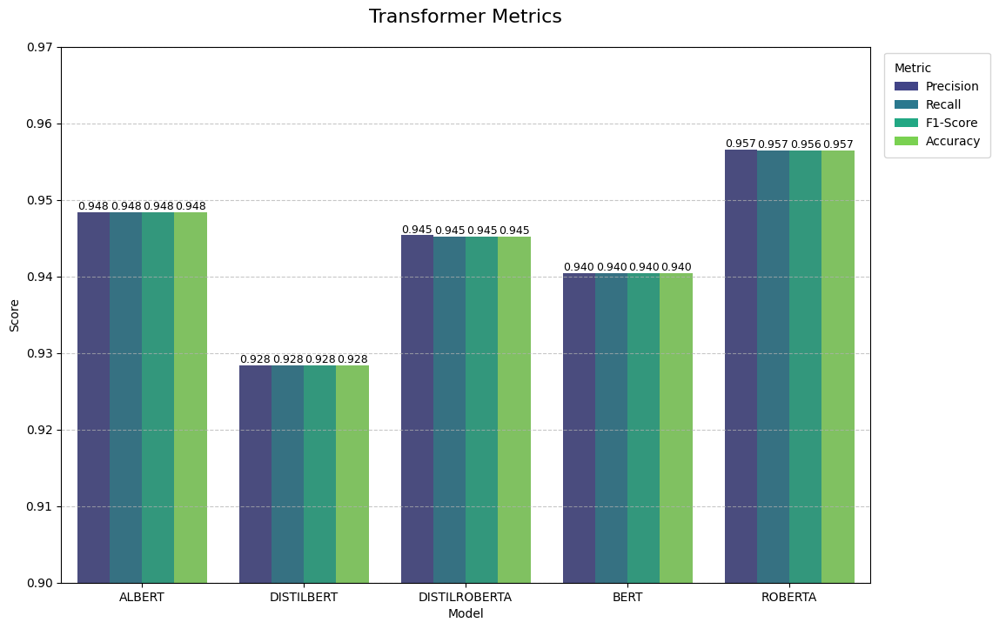

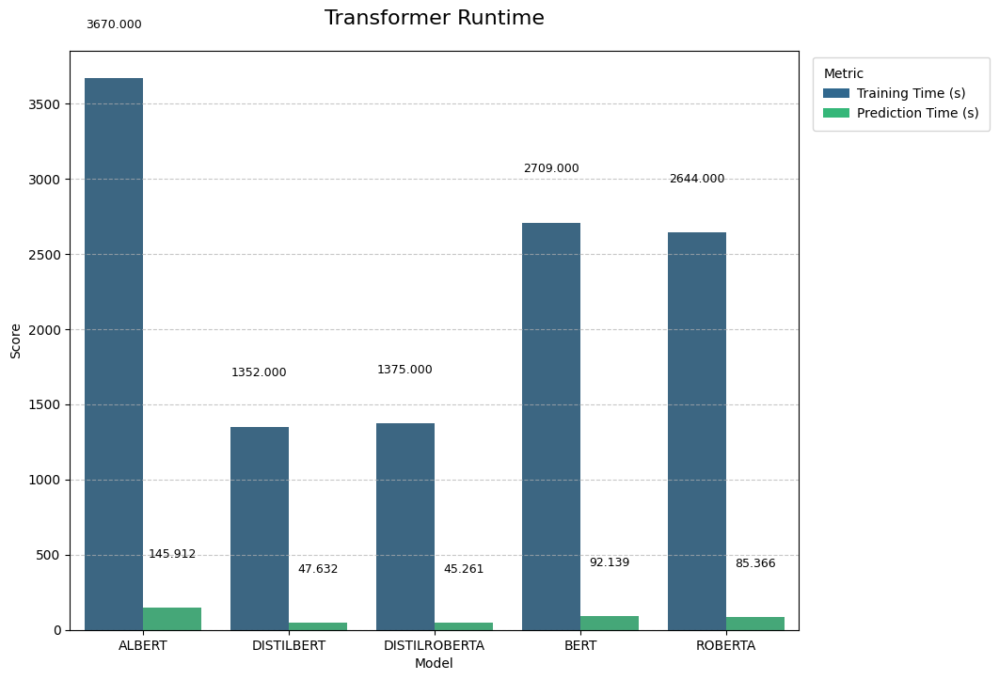

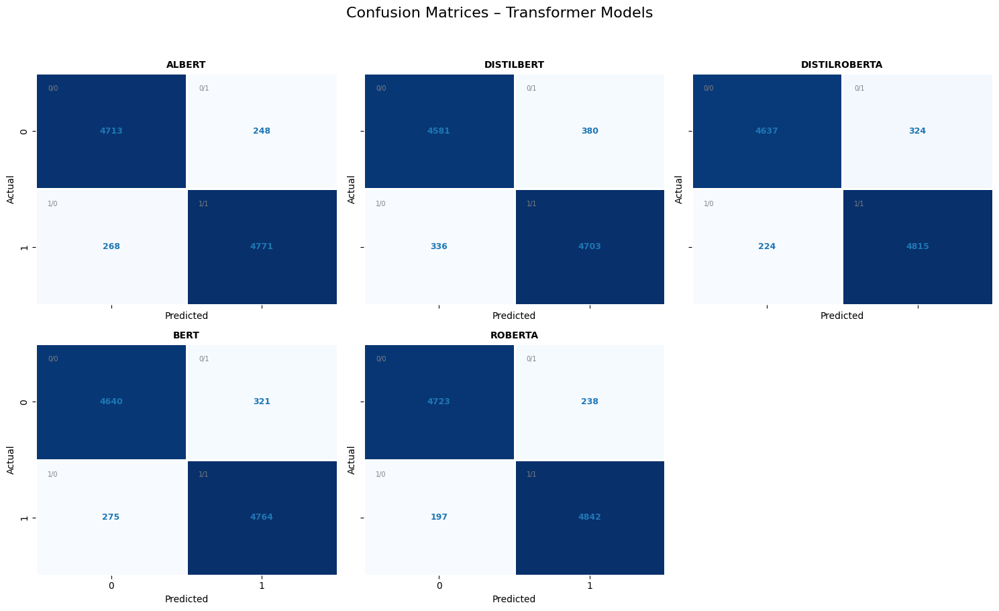

(<Figure size 1500x1000 with 6 Axes>,
 [<Axes: title={'center': 'ALBERT'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'DISTILBERT'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'DISTILROBERTA'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'BERT'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: title={'center': 'ROBERTA'}, xlabel='Predicted', ylabel='Actual'>,
  <Axes: >])

In [28]:
transformer_metrics_df, transformer_time_df, transformer_cm_plotters,_ = process_model_outputs(transformer_outputs, "Transformer")
plot_model_metrics(transformer_metrics_df, "Transformer Metrics", ylim=(0.90, 0.97), show=False)
plot_model_metrics(transformer_time_df, "Transformer Runtime", show=False)
# Create one plotter per transformer model
plot_grid(
    transformer_cm_plotters, # Use the list generated by process_model_outputs
    n_cols=3,
    figsize_per_plot=(5.0, 5.0),        # tune if labels look cramped
    suptitle="Confusion Matrices – Transformer Models",
    sharex=True,
    sharey=True
)

## Features: LLM Explainability with SHAP

Unlike ML models, LLMs are inherently black boxes. To understand why the LLM makes specific predictions, we use SHAP . SHAP assigns an importance value to each token (word) in a specific review, showing how much it pushed the model towards a "positive" or "negative" prediction. SHAP is computationally heavy operation, but results are in our work for additional insights.

In [29]:
import shap
from transformers import pipeline

# Pick the first transformer model for SHAP explanation
# Accessing the first model's name and short_name from the configs
first_model_name_key = list(model_configs.keys())[0]
first_model_config = model_configs[first_model_name_key]

model_name = first_model_name_key
short_name = first_model_config["short_name"]

# Dynamically select the model path based on FAST_PATH
if FAST_PATH:
    # If FAST_PATH, assume we are loading the pre-tuned model from the hub
    model_load_path = first_model_config["hf_hub_model_id"]
else:
    # Otherwise, load from the local output directory (if it exists)
    model_load_path = first_model_config["local_output_name"]

model = AutoModelForSequenceClassification.from_pretrained(model_load_path)
tokenizer = get_tokenizer(model_name)

device = 0 if torch.cuda.is_available() else -1

pipe = pipeline(
    "text-classification",
    model=model,
    tokenizer=tokenizer,
    device=device,
    top_k=None
)

explainer = shap.Explainer(pipe)

sample_reviews = X_test_llm.iloc[:3].tolist()   # or .iloc[[10, 25, 47]] etc.

print(f"Calculating SHAP values for {short_name} ...")
shap_values = explainer(sample_reviews)

Loading weights:   0%|          | 0/27 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/684 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/760k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

Calculating SHAP values for ALBERT ...


You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  33%|███▎      | 1/3 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 3/3 [00:38<00:00, 11.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 4it [00:46, 15.42s/it]


In [30]:
print(f"\nSHAP explanations for {short_name}:")
for i in range(len(sample_reviews)):
    shap.plots.text(shap_values[i])


SHAP explanations for ALBERT:


# Misclassification Analysis

In Figure 8, we performed unigram and bigram analysis to determine why certain reviews are misclassified. For both FPs and FNs, unigrams such as "like", "bad", and "good" seem to be misclassified. Typical FPs include bigrams such as "good movie", while FNs include "low budget".

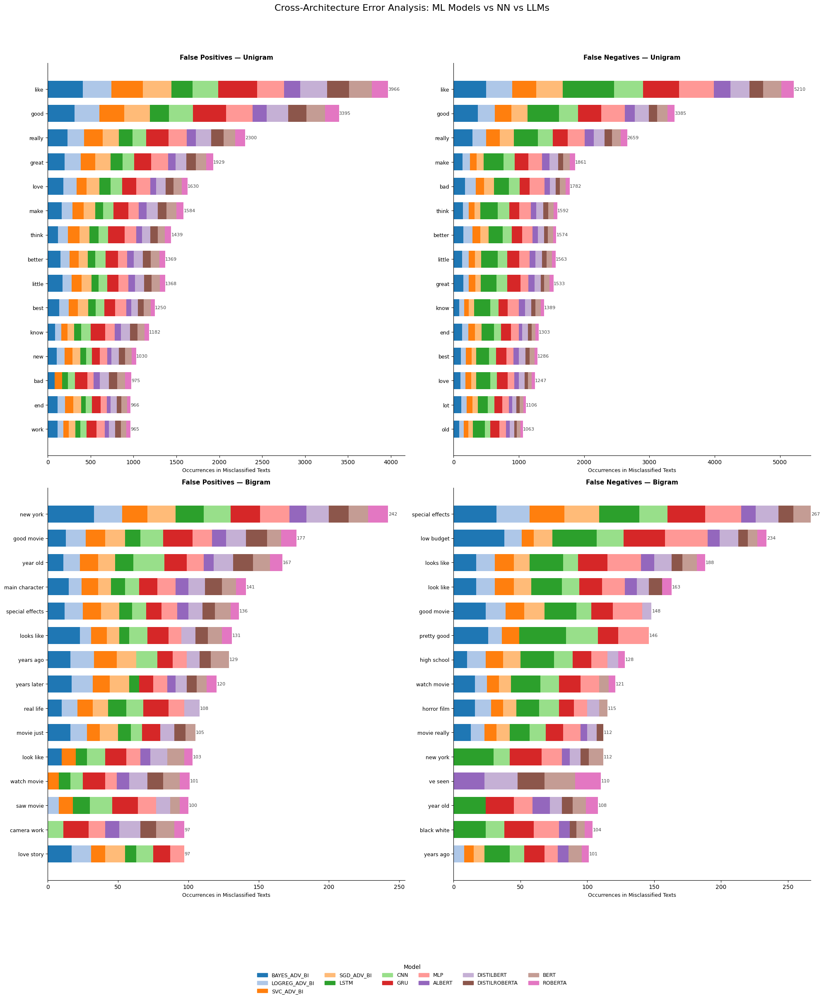

(<Figure size 2000x2400 with 4 Axes>,
 [<Axes: title={'center': 'False Positives — Unigram'}, xlabel='Occurrences in Misclassified Texts'>,
  <Axes: title={'center': 'False Negatives — Unigram'}, xlabel='Occurrences in Misclassified Texts'>,
  <Axes: title={'center': 'False Positives — Bigram'}, xlabel='Occurrences in Misclassified Texts'>,
  <Axes: title={'center': 'False Negatives — Bigram'}, xlabel='Occurrences in Misclassified Texts'>])

In [133]:
# ---------------------------------------------------------
# 2. WORD FREQUENCY EXTRACTOR
# ---------------------------------------------------------
def get_word_frequencies(model_info, error_type='FP', n_display=40, use_bigrams=False):
    """
    Returns a dict of {word: count} for a given model's misclassified texts.
    """
    y_true = pd.Series(model_info['y_true']).astype(int).values
    y_pred = pd.Series(model_info['y_pred']).astype(int).values
    texts  = model_info['X_test_text'].reset_index(drop=True)

    mask      = (y_true == 0) & (y_pred == 1) if error_type == 'FP' else (y_true == 1) & (y_pred == 0)
    err_texts = texts[mask]

    if len(err_texts) == 0:
        return {}

    ngram_range = (2, 2) if use_bigrams else (1, 1)
    vec = CountVectorizer(stop_words="english", ngram_range=ngram_range, max_features=n_display * 2)
    try:
        bow  = vec.fit_transform(err_texts)
        sums = bow.sum(axis=0)
        freq = {
            word: int(sums[0, idx])
            for word, idx in vec.vocabulary_.items()
            if word not in WORDS_TO_REMOVE
        }
        return dict(sorted(freq.items(), key=lambda x: x[1], reverse=True)[:n_display])
    except ValueError:
        return {}


# ---------------------------------------------------------
# 3. ASSEMBLY
# ---------------------------------------------------------
selected_trad   = [r for r in traditional_outputs if r['name'] in model_registry["BEST_TRAD_MODELS"]]
comparison_list = selected_trad + nn_outputs + transformer_outputs
model_names     = [m['name'] for m in comparison_list]

N_WORDS = 15

# Consistent colour per model across all 4 charts
palette       = sns.color_palette("tab20", len(model_names))
model_colours = dict(zip(model_names, palette))

configs = [
    ('FP', False, 'False Positives — Unigram'),
    ('FN', False, 'False Negatives — Unigram'),
    ('FP', True,  'False Positives — Bigram'),
    ('FN', True,  'False Negatives — Bigram'),
]


# ---------------------------------------------------------
# 4. PLOTTER FACTORY
# ---------------------------------------------------------
def make_stacked_bar_plotter(err_type, bigrams, title):
    """
    Pre-computes word frequencies and returns a plotter function
    compatible with plot_grid.
    """
    # Pre-compute outside the plotter so it runs once, not on every render
    all_freq    = {m['name']: get_word_frequencies(m, err_type, use_bigrams=bigrams) for m in comparison_list}
    word_totals = defaultdict(int)
    for freq in all_freq.values():
        for word, cnt in freq.items():
            word_totals[word] += cnt

    top_words = [w for w, _ in sorted(word_totals.items(), key=lambda x: x[1], reverse=True)[:N_WORDS]]

    df = pd.DataFrame(
        {name: [all_freq[name].get(w, 0) for w in top_words] for name in model_names},
        index=top_words
    ) if top_words else pd.DataFrame()

    # Sort so longest bar is on top
    if not df.empty:
        df = df.loc[df.sum(axis=1).sort_values(ascending=True).index]

    def plotter(ax):
        if df.empty:
            ax.text(0.5, 0.5, "No Errors", ha='center', va='center', fontsize=11)
            ax.set_title(title)
            return

        lefts = np.zeros(len(df))
        for model_name in model_names:
            ax.barh(df.index, df[model_name].values, left=lefts,
                    color=model_colours[model_name], label=model_name, height=0.7)
            lefts += df[model_name].values

        # Annotate totals at the end of each bar
        for i, (_, row) in enumerate(df.iterrows()):
            total = row.sum()
            ax.text(total + 0.3, i, str(total), va='center', fontsize=8, color='#444')

        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.set_xlabel("Occurrences in Misclassified Texts", fontsize=9)
        ax.tick_params(axis='y', labelsize=9)
        ax.spines[['top', 'right']].set_visible(False)

    return plotter


# ---------------------------------------------------------
# 5. BUILD PLOT FUNCTIONS + SHARED LEGEND
# ---------------------------------------------------------
plot_fns = [make_stacked_bar_plotter(err, bigrams, title) for err, bigrams, title in configs]

def shared_legend(fig):
    handles = [plt.Rectangle((0, 0), 1, 1, color=model_colours[n]) for n in model_names]
    fig.legend(
        handles, model_names,
        loc='lower center', ncol=min(len(model_names), 6),
        fontsize=9, title="Model", title_fontsize=10,
        bbox_to_anchor=(0.5, -0.02), frameon=False
    )


# ---------------------------------------------------------
# 6. RENDER
# ---------------------------------------------------------
plot_grid(
    plot_functions=plot_fns,
    n_cols=2,
    figsize_per_plot=(10, 12),
    suptitle="Cross-Architecture Error Analysis: ML Models vs NN vs LLMs",
    sharex=False,
    sharey=False,
    legend_fn=shared_legend
)

# Overall Aggregate Evaluation

In Figure 9, LLMs remain the top performers, achieving a peak accuracy of 95.7% with RoBERTa, which represents a nearly 5% improvement over the best-performing ML and NN models. However, this superior accuracy comes at a significant computational cost, with LLMs requiring up to 60 or more minutes of training on a Tesla T4. In contrast, competitive ML models like LOGREG, SGD, and SVC achieved over 90% accuracy in only a few seconds, offering a more practical balance of speed, simplicity, accuracy, and most critically, transparency.

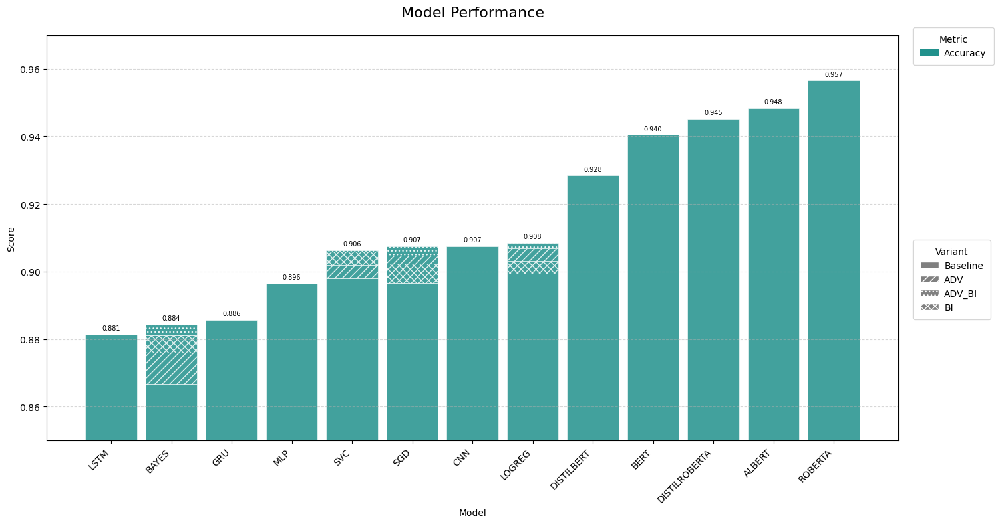

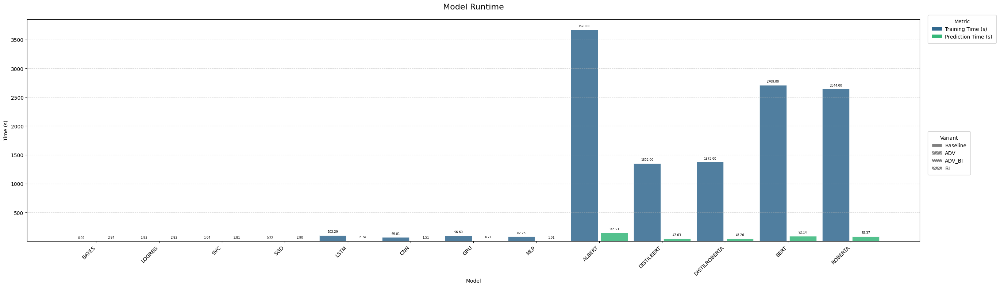

In [135]:
# filter trad_metrics_df for adv_bi in name
all_metrics_df = pd.concat([trad_metrics_df, nn_metrics_df, transformer_metrics_df], ignore_index=True)
all_time_df = pd.concat([trad_time_df, nn_time_df, transformer_time_df], ignore_index=True)

# Only need accuracy for metrics
all_metrics_df = all_metrics_df[all_metrics_df['Metric'] == 'Accuracy']

plot_model_metrics(
    all_metrics_df,
    title="Model Performance",
    ylim=(0.85, 0.97),
    fmt="%.3f", show_variant_ticks=False, group_sort="worst"
)

plot_model_metrics(
    all_time_df,
    title="Model Runtime",
    y_label="Time (s)",
    fmt="%.2f"
)

# Loading Models

In [33]:
import glob
import os

In [34]:
import joblib

# Load the models from the file
loaded_ml_models = {}
print("\nAttempting to load ML.joblib models from current directory:")

# Find all .ml.joblib files in the current directory
ml_files = glob.glob('*.ml.joblib')

if not ml_files:
    print("No .ml.joblib files found in the current directory.")
else:
    for file_path in ml_files:
        model_name = os.path.basename(file_path).replace('.ml.joblib', '')
        print(f"Loading {model_name} model from {file_path}...")
        try:
            loaded_ml_models[model_name] = joblib.load(file_path)
            print(f"Successfully loaded {model_name} model.")
        except Exception as e:
            print(f"Error loading {model_name} model: {e}")

if loaded_ml_models:
    print("\nSuccessfully loaded the following Traditional ML models:")
    for name, model in loaded_ml_models.items():
        print(f"- {name}: {type(model)}")
else:
    print("\nNo Traditional ML models were loaded.")


Attempting to load ML.joblib models from current directory:
Loading LOGREG_BI model from LOGREG_BI.ml.joblib...
Successfully loaded LOGREG_BI model.
Loading LOGREG model from LOGREG.ml.joblib...
Successfully loaded LOGREG model.
Loading SVC_ADV model from SVC_ADV.ml.joblib...
Successfully loaded SVC_ADV model.
Loading LOGREG_ADV model from LOGREG_ADV.ml.joblib...
Successfully loaded LOGREG_ADV model.
Loading BAYES_ADV_BI model from BAYES_ADV_BI.ml.joblib...
Successfully loaded BAYES_ADV_BI model.
Loading LOGREG_ADV_BI model from LOGREG_ADV_BI.ml.joblib...
Successfully loaded LOGREG_ADV_BI model.
Loading SVC_ADV_BI model from SVC_ADV_BI.ml.joblib...
Successfully loaded SVC_ADV_BI model.
Loading BAYES model from BAYES.ml.joblib...
Successfully loaded BAYES model.
Loading BAYES_BI model from BAYES_BI.ml.joblib...
Successfully loaded BAYES_BI model.
Loading SGD_ADV model from SGD_ADV.ml.joblib...
Successfully loaded SGD_ADV model.
Loading BAYES_ADV model from BAYES_ADV.ml.joblib...
Succes

In [35]:
import tensorflow as tf

loaded_nn_models = {}

print("Attempting to load Keras Neural Network models from current directory:")

# Find all .keras files in the current directory
k_files = glob.glob('*.keras')

if not k_files:
    print("No .keras files found in the current directory.")
else:
    for file_path in k_files:
        model_name = os.path.basename(file_path).replace('.keras', '')
        print(f"Loading {model_name} model from {file_path}...")
        try:
            loaded_nn_models[model_name] = tf.keras.models.load_model(file_path)
            print(f"Successfully loaded {model_name} model.")
        except Exception as e:
            print(f"Error loading {model_name} model: {e}")

if loaded_nn_models:
    print("\nSuccessfully loaded the following Neural Network models:")
    for name, model in loaded_nn_models.items():
        print(f"- {name}: {type(model)}")
else:
    print("\nNo Neural Network models were loaded.")

Attempting to load Keras Neural Network models from current directory:
Loading GRU model from GRU.keras...
Successfully loaded GRU model.
Loading LSTM model from LSTM.keras...
Successfully loaded LSTM model.
Loading CNN model from CNN.keras...
Successfully loaded CNN model.
Loading MLP model from MLP.keras...
Successfully loaded MLP model.

Successfully loaded the following Neural Network models:
- GRU: <class 'keras.src.models.sequential.Sequential'>
- LSTM: <class 'keras.src.models.sequential.Sequential'>
- CNN: <class 'keras.src.models.sequential.Sequential'>
- MLP: <class 'keras.src.models.sequential.Sequential'>


# Uncovering Business Insights with NER

Now that we have a model that can make predictions, we now focus on NER. Given a large set of reviews, we can perform basic entity extraction to determine what drives sentiment, popularity, or unpopularity. Rather than knowing that a film has a negative review because of the word "terrible", we want to extract influential features critical for business decisions, such actors, directors, films, and characters.

We did not use spaCyfor NER, as it is computationally expensive to run on the entirety of the dataset. Instead, we opt to use regex, where we extract from cased text for title-cased entities from reviews to allow analyst to quantify which people, franchises, or narrative elements are most associated with positive or negative reactions.

## Data Preprocessing
We chose several additional data preprocessing techniques to extract title-cased entities. Our regex will be designed to extract consecutive capitalized words, with optional connectors  for full movie names.

1. Separation: Separation refers to adding a non-alphanumeric symbol  between the target phrases. We separate and remove possessive and contraction forms, so that "Brad Pitt's Fury acting" refers to "Brad Pitt". We note that separation may break up valid film names.
2. Acronym and Initials Normalization: Since now separators such as periods and commas are crucial for distinguishing between lists of unique entities, we must remove periods from acronyms and initials, such as "U.S.A." and "John D. Smith".
3. Honorifics Normalization: Replace common honorifics such that "Doctor Who" and "Dr. Who" all refer to "Dr Who".
4. Word Checks: Since the first word in the sentence is almost always capitalized, we devised a list of common sentence starters, common film words and used English stop-words such that they are discarded. Therefore, "The movie was amazing" captures no entities.
5. All Caps Checks: If the entire phrase is all capitalized (such as "THIS IS AMAZING, SPOILERS AHEAD"), then we assume that it was due to excitement rather than a specific entity.
6. Deduplication: We deduplicated redundant entities, to avoid double counting for aggregate analysis.
7. Genres: We also extracted common genres, uncased, to further our analysis.


In [36]:
RE_POSSESSIVE_1 = re.compile(r"(\w+)'s\b")
RE_POSSESSIVE_2 = re.compile(r"(\w+)s'\b")
RE_ENDING       = re.compile(r"(\w+)'(?:d|m|ll|re|nt|ve)\b", re.IGNORECASE)
RE_SPACES       = re.compile(r'\s+')
RE_ACRO_1       = re.compile(r'(?<=[A-Z])\.(?=[A-Z])')
RE_ACRO_2       = re.compile(r'([A-Z])\.\b')
RE_INITIAL_PERIOD = re.compile(r'\b([A-Z])\.(?=\s*[A-Z])') # For initials like 'D.' in 'John D. Smith'
VERSUS = re.compile(r'\b(?:versus|v\.?|vs\.?)\s+', re.IGNORECASE) # To normalize versus

GEN_SUB = re.compile(r'\bgen(?:eration|\.)?[-\s][A-Za-z]\b', re.IGNORECASE) # To remove Gen X, Gen Y, Gen Z

ALLOWED_CONNECTORS = {
    'of', 'the', 'in', 'on', 'for', 'with', 'to', 'by', 'at', 'from', 'as', 'into', 'up', 'out', 'a', 'an', 'vs', 'v'
}
CONTRACTION_PATTERNS = {
    re.compile(pattern, re.IGNORECASE): repl
    for pattern, repl in CONTRACTIONS.items()
}

HONORIFIC_KEYS    = list(HON_MAP.keys() | HON_MAP.values())
HONORIFIC_PATTERN = re.compile(
    r'\b(' + '|'.join(re.escape(h) for h in HONORIFIC_KEYS) + r')\.?(:?\s+([A-Z][a-zA-Z\d]*)?)'
)

_connector_pattern = '|'.join(re.escape(c) for c in ALLOWED_CONNECTORS)
_lowercase_suffix = r'(?:\s+(?:man|woman))?'

ENTITY_PATTERN = re.compile(
    r'\b'
    r'([A-Z][a-zA-Z0-9\'\'-]*)'
    r'(?:'
        r'\s+'
        r'(?:'
            r'[A-Z][a-zA-Z0-9\'\'-]*'
            r'|(:?\b(?:' + _connector_pattern + r')\b(?=\s+[A-Z][a-zA-Z0-9\'\'-]*))'
            r'|-'
        r')'
    r')*'
    + _lowercase_suffix +
    r'\b'
)

ENTITY_PATTERN_AND = re.compile(
    r'\b([A-Z][a-zA-Z0-9\'\'-]+)'
    r'(?:\s+(?:' + _connector_pattern + r'))*'
    r'\s+(?:\:|and)\s+'
    r'(?:(?:' + _connector_pattern + r')\s+)*'
    r'([A-Z][a-zA-Z0-9\'\'-]+)'
    + _lowercase_suffix +
    r'\b'
)
GENRES = {
    'horror',
    'suspense',
    'thriller',
    'action',
    'superhero',
    'hero',
    'drama',
    'comedy',
    'adventure',
    'sci-fi',
    'sci fi',
    'science fiction',
    'fantasy',
    'animation',
    'fiction',
    'animation',
    'animated',
    'anime',
    'western',
    'war movie',
    'war film',
    'cartoon',
    "romance",
    "romantic",
}

GENRE_REGEX = re.compile(r'\b(' + '|'.join(re.escape(g) for g in GENRES) + r')s?\b', re.I)
def clean_text_for_entities(text: str) -> str:
    text = RE_HTML.sub(" ### ", text)
    text = RE_LINK.sub(" ### ", text)

    for pattern_re, replacement in CONTRACTION_PATTERNS.items():
        text = pattern_re.sub(
            lambda m, r=replacement: r.capitalize() if m.group(0)[0].isupper() else r,
            text
        )

    text = RE_POSSESSIVE_1.sub(r"\1 ###", text)
    text = RE_POSSESSIVE_2.sub(r"\1s ###", text)
    text = RE_ENDING.sub(r"\1 ###", text)
    text = GEN_SUB.sub(" ###", text)

    def honorific_repl(m):
        normalized = HON_MAP.get(m.group(1).capitalize(), m.group(1))
        following  = m.group(2) if m.group(2) is not None else ""
        return f"{normalized} {following}".strip()

    text = HONORIFIC_PATTERN.sub(honorific_repl, text)
    text = RE_INITIAL_PERIOD.sub(r'\1', text) # Remove period from initials like 'D.'
    text = RE_ACRO_1.sub('', text)
    text = RE_ACRO_2.sub(r'\1', text)
    text = RE_SPACES.sub(' ', text).strip()
    text = VERSUS.sub('v', text)
    return text

def extract_title_cased_entities(t: str) -> list[str]:
    entities = []
    for match in ENTITY_PATTERN.finditer(t):
        full_match = match.group(0).strip()
        processed  = re.sub(r'\s*-\s*', '-', full_match)
        processed  = re.sub(r'^-|-$', '', processed).strip()
        parts      = processed.split()

        if not parts or all(p.isupper() for p in parts) or (len(parts) == 1 and (len(parts[0]) <= 1 or parts[0].isdigit())):
            continue # Skip empty, all caps, or single-char/digit entities
        # If all words are connectors or negation, drop
        if all(p.lower() in ALL_WORDS_TO_IGNORE for p in parts):
            continue
        # Remove common words from the beginning if present
        if parts[0].lower() in ALL_WORDS_TO_IGNORE:
            parts = parts[1:]
            if not parts: # If nothing left after removing common word, skip
                continue
        if parts[-1].lower() in ALL_WORDS_TO_IGNORE - { "man", "woman"}:
            parts = parts[:-1]
            if not parts:
                continue

        entity = " ".join(parts)
        entities.append(entity)
    entities = list(set(entities))
    # check: For single word entities, if it already belongs to a longer one, drop it
    if len(entities) > 1:
        for i in range(len(entities)):
            for j in range(i + 1, len(entities)):
                if entities[i] in entities[j] and len(entities[i].split()) == 1:
                    entities.pop(i)
                    break

    # Secondary pass: permissive 'and' connector, strictly Word and Word only
    for match in ENTITY_PATTERN_AND.finditer(t):
        full_match = match.group(0).strip()
        parts = full_match.split()
        # If all words are connectors or negation, drop
        if all(p.lower() in ALL_WORDS_TO_IGNORE for p in parts):
            continue
        if parts[0].lower() in ALL_WORDS_TO_IGNORE:
            parts = parts[1:]
            if not parts:
                continue
        if parts[-1].lower() in ALL_WORDS_TO_IGNORE- { "man", "woman"}:
            parts = parts[:-1]
            if not parts:
                continue


        entity = " ".join(parts)
        entities.append(entity)
    return list(set(entities))

def extract_genre(text: str) -> list[str]:
    genres = []
    for match in GENRE_REGEX.finditer(text):
        full_match = match.group(0).strip()
        # strip dashes, so that sci-fi = sci fi
        processed  = re.sub(r'-', ' ', full_match)
        genres.append(processed)
    return list(set(genres))

In [37]:
movie_reviews_entities = reviews.copy(deep=True)
# Apply the function
print("Cleaning Reviews")
movie_reviews_entities["cleaned_review"] = movie_reviews_entities["review"].progress_apply(clean_text_for_entities)
print("Extracting entities")
movie_reviews_entities["extracted_entities"] = movie_reviews_entities["cleaned_review"].progress_apply(extract_title_cased_entities)
print("Extracting genres")
movie_reviews_entities["extracted_genres"] = movie_reviews_entities["cleaned_review"].progress_apply(extract_genre)

Cleaning Reviews


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

Extracting entities


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

Extracting genres


Processing:   0%|          | 0/50000 [00:00<?, ?it/s]

In [38]:
entity_sentiment_records = []

for index, row in movie_reviews_entities.iterrows():
    sentiment = row['sentiment']
    entities = row['extracted_entities']

    for entity in entities:
        entity_sentiment_records.append({
            'review_index': index,
            'entity': entity.lower(),
            'sentiment': sentiment
        })

print(f"Generated {len(entity_sentiment_records)} entity-sentiment records.")

Generated 426641 entity-sentiment records.


In [39]:
entities_sentiment = pd.DataFrame(entity_sentiment_records)

print("First 5 rows of entities_sentiment DataFrame:")
print(entities_sentiment.head())

First 5 rows of entities_sentiment DataFrame:
   review_index                                     entity  sentiment
0             0                                   italians          1
1             0                                 christians          1
2             0  oswald maximum security state penitentary          1
3             0                                    em city          1
4             0                                      irish          1


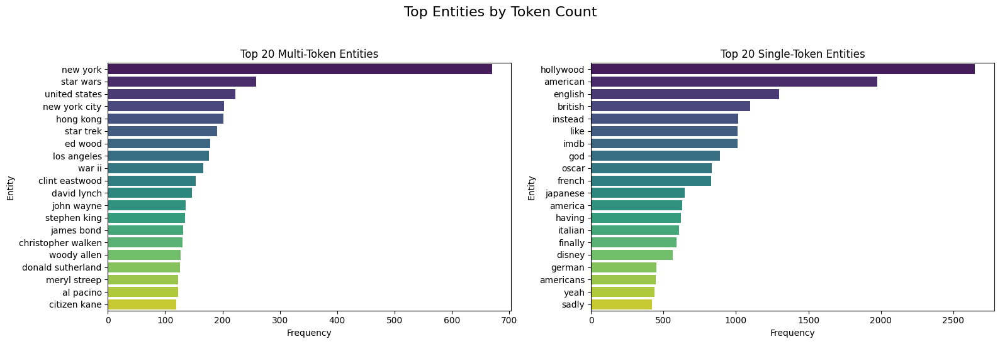

(<Figure size 1600x600 with 2 Axes>,
 [<Axes: title={'center': 'Top 20 Multi-Token Entities'}, xlabel='Frequency', ylabel='Entity'>,
  <Axes: title={'center': 'Top 20 Single-Token Entities'}, xlabel='Frequency', ylabel='Entity'>])

In [40]:
# ---------------------------------------------------------
# 1. Filter multi-token entities
# ---------------------------------------------------------
entities_sentiment['token_count'] = entities_sentiment['entity'].apply(lambda x: len(x.split()))
entities_multi_token = entities_sentiment[entities_sentiment['token_count'] >= 2].copy()

raw_entities_single_token = entities_sentiment[entities_sentiment['token_count'] == 1].copy()

# ---------------------------------------------------------
# 2. Compute global frequency per entity
# ---------------------------------------------------------
freq = (
    entities_multi_token
    .groupby('entity')
    .size()
    .rename('global_count')
)

entities_multi_token = (
    entities_multi_token
    .merge(freq, on='entity')
    .query('global_count >= 5')
    .copy()
)

def plot_multi_token_entities(ax):
    multi_counts = entities_multi_token['entity'].value_counts().head(20).reset_index()
    multi_counts.columns = ['entity', 'count']
    sns.barplot(x=multi_counts['count'], y=multi_counts['entity'], palette='viridis', hue=multi_counts['entity'], legend=False, ax=ax)
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Entity')
    ax.set_title('Top 20 Multi-Token Entities')

def plot_single_token_entities(ax):
    single_counts = raw_entities_single_token['entity'].value_counts().head(20).reset_index()
    single_counts.columns = ['entity', 'count']
    sns.barplot(x=single_counts['count'], y=single_counts['entity'], palette='viridis', hue=single_counts['entity'], legend=False, ax=ax)
    ax.set_xlabel('Frequency')
    ax.set_ylabel('Entity')
    ax.set_title('Top 20 Single-Token Entities')

plot_grid(
    plot_functions=[
        plot_multi_token_entities,
        plot_single_token_entities
    ],
    n_cols=2,
    figsize_per_plot=(8, 6),
    suptitle="Top Entities by Token Count",
    sharex=False,
    sharey=False
)


## Defining common names and phrases
After our initial candidates are extracted, we predefined a list of hardcoded locations, films, characters, and person names, to separate out for people and films. Here is the process:

1.	Films such as "Star Wars" and "Batman" are common, so by defining them we can also capture sequels if they exist, such as "Batman Returns".
2.	We defined a list of noise entities, such as "IMDb", "Oscars", and "Academy" as they do not refer to specific film names or actors.
3.	By defining a list of common first and last names, we can perform a heuristic validation strategy  to validate other first and last names. Note that for fictional characters , we may have to either hardcode them in the films list or resolve them later.
4.	For the categorization stage, only those of token length greater than two are considered, unless we know it refers to a film, such as "Batman".
5.	Not all reviews would refer to an actor or director by their full names . For uni-gram tokens, we only consider candidate last names and create a last name mapping to probable canonical person names. Only if the association is strong, do we assign those tokens to that specific person. For example, "Pitt" may refer to "Brad Pitt" if and only if "Pitt" is mentioned standalone in a review, and almost all "Pitt" mentions refer to "Brad Pitt" (even there is a single mention of "Bob Pitt"). We note that this heuristic is prone to errors and misclassification.


In [41]:
COMMON_FIRST_NAMES = {
    'adam','alex','alice','amanda','amy','andrew','anna','anthony','ashley', 'allen',
    'ben','beth','brian','bruce', 'bill',
    'carl','carlos','catherine','charles','charlie','chris','christian','christina','christopher','claire','colin', 'carol',
    'dan','daniel','david','debbie','derek','diana','dylan', 'danny', 'denny', 'donald',
    'ed','edward','elizabeth','ella','emily','emma','eric','ethan','eva', 'elijah',
    'frank','fred',
    'george','grace', 'gary',
    'hannah','harry','helen','henry', 'harvey',
    'ian','isaac','isabelle',
    'jack','jake','james','jane','jason','jeff','jennifer', 'janet',
    'jessica','jim','joe','john','jon','josh','julia','julie','justin',
    'kate','karen','kevin','kim','kyle',
    'laura','lauren','liam','lisa','luke', 'lewis', 'larry', 'lara','leo', 'leonardo',
    'maria','mark','mary','matt','matthew','megan','michael','michelle','mike','molly', 'muhammad',
    'nancy','nathan','nick','nicole','noah',
    'oliver','olivia','oscar', 'owen',
    'peter','phil','philip','paul','patrick',
    'quinn',
    'rachel','rebecca','richard','robert','roger','rose','ryan',
    'sam','samantha','sara','sarah','scott','sean','shawn','sophia','steve','steven','susan','sundance', 'shirley', 'scarlet',
    'taylor','terry','thomas','tim','tina','tom','tony','tyler',
    'victor','victoria', 'vincent',
    'will','william',
    'yara', 'yvette',
    'zack','zachary',


    'akira', 'kenji', 'hiroshi', 'takeshi', 'yuki', 'yoko', 'haruki',  # Japanese
}
COMMON_LOCATIONS = {
    'new york','los angeles','san francisco',
    'chicago','houston','phoenix','philadelphia','dallas','miami',
    'united states','usa\b','america', 'city', 'country', 'national', 'international',
    'hollywood', 'london', 'italy', 'italian', 'france', 'washington, dc', 'washington dc',
    'united kingdom', 'mexico', 'hong kong', 'japan', 'china', "german", 'french',
    'north america', 'south america', 'south africa', 'russia', 'africa', 'europe',
    'ireland', 'asia', 'korea', 'chinese', 'england', "las vegas", "vegas", 'ussr', 'soviet',
}

COMMON_LAST_NAMES = {
    'allen', 'smith','johnson','williams','brown','cassidy', 'jones','garcia','miller','davis','rodriguez','martinez',
    'hernandez','lopez','gonzalez','goldman', 'wilson','anderson','thomas','taylor','moore','jackson','martin', 'hitchcock',
    'lee','perez','thompson','white','harris','sanchez','clark','ramirez','lewis','robinson', 'jones',
    'walker','young','allen','king','wright','scott','torres','nguyen','hill','flores',
    'green','adams','nelson','baker','hall','rivera','campbell','mitchell','carter','roberts',
    'heston', 'kane', 'dawson', 'hardy', 'pacino', 'castillo',

    # Very common short surnames that appear in reviews
    'kim','cho','park','chen','wang','li','yu','lin','singh','khan', 'muhammad', 'zhang', 'chan',

    # High-frequency actor surnames
    'cruise','pitt','damon','affleck','clooney','hanks','dicaprio','winslet','kidman','washington',
    'freeman','jackman','downey','evans','hemsworth','johansson','lawrence','stone','gosling','reynolds',
    'bale','ledger','hardy','streep','blanchett','denzel','mcconaughey','chastain','mcadams','theron', 'seagal',
    'eastwood', 'rowling',

    # Common ambiguous surnames that appear as single tokens
    'fox','gray','reed','price','wood','cook','ward','ross','cole','diaz',
    'murphy','cooper','richards','jenkins','foster','carpenter','bishop','porter','hunter','mason',


    # Japanese
    'watanabe', 'yakusho', 'kitano', 'asano', 'odagiri',
    # French
    'depardieu', 'deneuve', 'binoche', 'reno', 'cassel', 'cotillard', 'delon', 'adjani',
    # Spanish/Latin
    'banderas', 'bardem', 'bernal', 'cruz',
    # Italian
    'mastroianni', 'benigni', 'bellucci', 'servillo',
    # Scandinavian
    'mikkelsen', 'skarsgard', 'vikander', 'rapace', 'sydow',
    # German
    'waltz', 'bruhl', 'hader',
    # British
    'fiennes', 'rickman', 'mirren', 'dench', 'cumberbatch', 'oldman', 'kingsley',
    # Indian
    'bachchan', 'kapoor', 'chopra', 'irrfan',
    # Russian/Eastern European
    'kinski', 'polanski',
    # Australian
}


COMMON_FRANCHISES = {
    "avengers",
    "marvel",
    "justice league",
    "capt america",
    "mission impossible",
    "batman",
    'black panther',

    "superman",
    'aquaman',
    "spider-man",
    "spider man",
    'iron man',
    "spiderman",
    "x-men",
    "dune",
    'hulk',
    'thor',
    'loki',
    'ultron',
    'transformers',
    'optimus',

    'wonder woman',
    'flash',
    'green lantern',
    'south park',

    "alien",
    "predator",
    "terminator",
    "matrix",
    "lord of the rings",
    "hobbit",
    "game of thrones",
    "chronicles of narnia",
    "jurassic park",


    'star wars',
    "john wick",

    'ocean',

    'star trek',
    'trek',



    'shakespeare', 'william shakespeare',
    'dracula',
    'stooges',


     # Sci-Fi / Fantasy
    "interstellar",
    "inception",
    "avatar",
    "back to the future",
    "blade runner",
    "expanse",
    "westworld",
    "battlestar galactica",
    "fifth element",
    "minority report",
    "total recall",
    "tron",
    "pacific rim",
    "district 9",
    'dr who',
    'godzilla',
    'kong', # Need to remap hong kong later
    'et',



    'adolf hitler',
    'hitler',
    'downfall',

    # Action / Thriller
    "fast and furious",
    "fast furious",
    "die hard",
    "lethal weapon",
    "the expendables",
    "top gun",
    "mad max",
    'fury',
    "rambo",
    "rocky",
    "bourne",
    'tomb raider',
    'legion',
    'troy',

    # Horror / Suspense
    "halloween",
    "nightmare on elm street",
    "conjuring",
    "it chapter",
    "resident",
    "silent hill",
    "paranormal activity",
    "final destination",
    "scream",
    "sinister",
    "friday the 13th",



    # Animation / Family
    "toy story",

    "frozen",
    "shrek",
    "kung fu panda",
    "how to train your dragon",
    "despicable",
    "minions",
    "incredibles",
    "finding nemo",
    'nemo',
    "moana",
    "encanto",
    "coco",
    "up",
    "wall-e",
    "ratatouille",

    'wizard of oz',
    'happy feet',
    'madagascar',
    "lion king",
    "snow white",
    'peter pan',
    'atlantis',
    'ed wood',
    'james bond',
    'bond',

    # Long-running TV / Crossover franchises
    "breaking bad",
    "walking dead",
    "stranger things",
    "black mirror",
    "mandalorian",
    "squid game",
    "peaky blinders",
    "sopranos",
    "ozark",

    'harry potter',
    'potter',

    'indiana jones',
    'bumblebee',
    'megatron',
    'han solo',
    'luke skywalker',
    'vader', 'jedi',
    'darth vader',
    'death star',
    'lara croft',
    'george armstrong custer',
    'gen custer',
    'princess Leia',

    'bugs bunny',
    'looney tunes',
    'pink panther',
    "dr seuss",
    "lorax", "grinch", "cat in the hat",

    # Video games
    'kaiju',
    'far cry',
    'pokemon',
    'pikachu',
    'dragon ball',
    'warhammer',
}
# Character names that are not actors
CHARACTERS = {
    'bruce wayne',
    'clark kent',
    'bruce banner',
    'peter parker',
    'tony stark',
    'steve rogers',
    'barry allen',
    'peter quill',
}

AMB_SINGLE_FILM = {'runner', 'mad', 'prime', 'three', 'citizen', 'angels', 'code', 'demons',
                   'undead', 'war', 'killer', 'christmas', 'cars', 'casino', 'wizard', 'curious', 'home',
                   'lord', 'player', 'toy', 'penguins', 'emerald', 'zombies', 'super', 'fast', 'roses',
                   'american', 'sin', 'detective', 'two', 'magic', 'master', 'tomb', 'devils', 'secrets',
                   'train', 'little', 'devil', 'duck', 'murder', 'serial', 'mom', 'death', 'league', 'dragons',
                   'dad', 'raider', 'furious', 'maze', 'games', 'ghost', 'evil', 'network', 'one', 'man', 'woman',
                   'extinction', 'clone', 'return', 'shades', 'attack', 'island', 'skull', 'monsters',     'dr jekyll', 'mr hyde',
                   'gun', 'hunger', 'dungeons', 'age', 'vampires', 'pirates', 'rings', 'pirate', 'robot'} | set(ALLOWED_CONNECTORS) # Allowed connectors form a movie name


OTHER = {
    'native',
    'african',
    'westerns',
    'awards',
    'award',
    'oscars',
    'academy',
    "pixar",
    "imdb",
    'imdbs',
    'hollywood',
    "netflix",
    "hulu",
    "hbo",
    "amazon prime",
    "disney",
    'microsoft',
    'google',
    'nintendo',
    'sony',
    'holiday',
    'jesus christ',
    'christ',
    'studio',
    'clock',
    'statue of',
    'tv',
    'dvd',
    'vhs',
}

FILM_REGEX = re.compile(r'\b(?:' + '|'.join(f for f in COMMON_FRANCHISES | AMB_SINGLE_FILM) + r')\b', re.IGNORECASE)
LOCATION_REGEX = re.compile(r'\b(?:' + '|'.join(l for l in COMMON_LOCATIONS) + r')', re.IGNORECASE)

In [42]:
import nltk
from nltk.corpus import words

nltk.download("words")  # only need to do once
english_vocab = set(w.lower() for w in words.words())

IGNORE_NAME_SET = COMMON_WORDS_TO_IGNORE | english_vocab | set(HONORIFIC_KEYS) | COMMON_LOCATIONS | OTHER | GENRES | AMB_SINGLE_FILM | text.ENGLISH_STOP_WORDS
IGNORE_NAME_SET = {w.lower() for w in IGNORE_NAME_SET}
SUFFIX = ["jr", "sr"]

@lru_cache(maxsize=None)
def resolve_two_token_name_cached(entity):
    toks = entity.split()
    if len(toks) != 2:
        return resolve_token_name(entity)

    first, last = toks

    is_first = first in COMMON_FIRST_NAMES
    is_last  = last in COMMON_LAST_NAMES
    if is_first and last == first:
        is_first = False
        first = None
    # IF last is a suffix
    if last in SUFFIX:
        # Then first is the last name
        is_first = False
        is_last = True
        last = first
        first = None
    if first in HONORIFIC_KEYS:
        is_last = True
        first = None
    if is_first or is_last:
        return ("PERSON", first, last)  # <-- return tuple
    return None

@lru_cache(maxsize=None)
def resolve_token_name(entity):
    toks = entity.split()
    first, last = None, None
    for tok in toks:
        if tok in COMMON_FIRST_NAMES:
            first = tok
        elif tok in COMMON_LAST_NAMES:
            last = tok
    if first is not None and last is not None:
        return ("PERSON", first, last)  # <-- return tuple

def apply_name_resolution(df, indices=None):
    if indices is None:
        # Only target rows not yet classified
        indices = df[df["type"].isna()].index
    target = df.loc[indices]

    results = target["entity"].apply(resolve_two_token_name_cached)

    df.loc[target.index, "type"]       = results.apply(lambda x: x[0] if isinstance(x, tuple) else x)
    df.loc[target.index, "first_name"] = results.apply(lambda x: x[1] if isinstance(x, tuple) else None)
    df.loc[target.index, "last_name"]  = results.apply(lambda x: x[2] if isinstance(x, tuple) else None)

@lru_cache(maxsize=None)
def resolve_location(entity):
    if entity in COMMON_LOCATIONS:
        return "LOCATION"
    if LOCATION_REGEX.search(entity):
        return "LOCATION"
    return None

@lru_cache(maxsize=None)
def resolve_film(entity):
    if entity in COMMON_FRANCHISES:
        return "FILM"
    if FILM_REGEX.search(entity):
        return "FILM"
    return None

@lru_cache(maxsize=None)
def resolve_genre(entity):
    if entity.rstrip("s") in GENRES:
        return "GENRE"
    return None

@lru_cache(maxsize=None)
def resolve_other(entity):
    # Return true if any token within the entity matches in other
    if any(token in OTHER for token in entity.split()):
        return "OTHER"
    return None


# Clear caches to ensure latest regex definitions are used
resolve_film.cache_clear()
resolve_location.cache_clear()
resolve_genre.cache_clear()
resolve_other.cache_clear()

# Resolve the other first
entities_multi_token['type'] = entities_multi_token['entity'].apply(resolve_other)

entities_multi_token['type'] = entities_multi_token['type'].fillna(entities_multi_token['entity'].apply(resolve_film))
entities_multi_token['type'] = entities_multi_token['type'].fillna(entities_multi_token['entity'].apply(resolve_genre))

entities_multi_token["type"] = entities_multi_token["type"].fillna(
    entities_multi_token["entity"].apply(resolve_location)
)

# Resolve names
apply_name_resolution(entities_multi_token)


print("Starting iterative classification for new names...")
max_iterations = 1
for iteration in range(max_iterations):
    print(f"\n--- Iteration {iteration + 1}/{max_iterations} ---")

    # 1. Identify unclassified two-token entities
    unclassified_two_token = entities_multi_token[
        (entities_multi_token["token_count"] == 2) &
        (entities_multi_token["type"].isna())
    ].copy()

    if unclassified_two_token.empty:
        print("No more unclassified two-token entities found. Breaking loop.")
        break

    print(f"Found {len(unclassified_two_token)} unclassified two-token entities for this iteration.")

    # Extract first and last tokens from these unclassified entities
    first_tokens = [e.split()[0].lower() for e in unclassified_two_token['entity']]
    last_tokens  = [e.split()[1].lower() for e in unclassified_two_token['entity']]

    first_token_counts = Counter(first_tokens)
    last_token_counts  = Counter(last_tokens)

    new_names_added = False

    # 2. Identify and add potential new first names
    for token, count in first_token_counts.items():
        if len(token) < 3:
            continue
        if count >= 3 and token not in IGNORE_NAME_SET | COMMON_FIRST_NAMES:
            COMMON_FIRST_NAMES.add(token)
            new_names_added = True

    # 3. Identify and add potential new last names
    for token, count in last_token_counts.items():
        if len(token) < 3:
            continue
        if count >= 3 and token not in COMMON_LAST_NAMES | IGNORE_NAME_SET:
            COMMON_LAST_NAMES.add(token)
            new_names_added = True

    if not new_names_added:
        print("No new names were identified and added in this iteration. Breaking loop.")
        break

    # Clear cache for name resolution functions to use updated common name sets
    resolve_two_token_name_cached.cache_clear()
    resolve_token_name.cache_clear()
    print("  Cleared name resolution cache.")

    # Re-apply classification for all currently unclassified entities
    # to incorporate the newly added common names
    unclassified_indices = entities_multi_token[entities_multi_token["type"].isna()].index
    if not unclassified_indices.empty:
        print(f"  Re-classifying {len(unclassified_indices)} previously unclassified entities.")

        # Apply name classification first
        updated_types_names = entities_multi_token.loc[unclassified_indices, "entity"].apply(resolve_two_token_name_cached)

        # Those still unclassified
        unclassified_indices = entities_multi_token[entities_multi_token["type"].isna()].index
        if not unclassified_indices.empty:
            apply_name_resolution(entities_multi_token, unclassified_indices)
    else:
        print("  All entities are now classified; no need to re-apply.")
# Resolve the rest of unknown entities as film
entities_multi_token['type'] = entities_multi_token['type'].fillna(entities_multi_token['type'] == 'FILM')
print("\nFinished iterative name classification.")

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


Starting iterative classification for new names...

--- Iteration 1/1 ---
Found 42794 unclassified two-token entities for this iteration.
  Cleared name resolution cache.
  Re-classifying 48341 previously unclassified entities.

Finished iterative name classification.


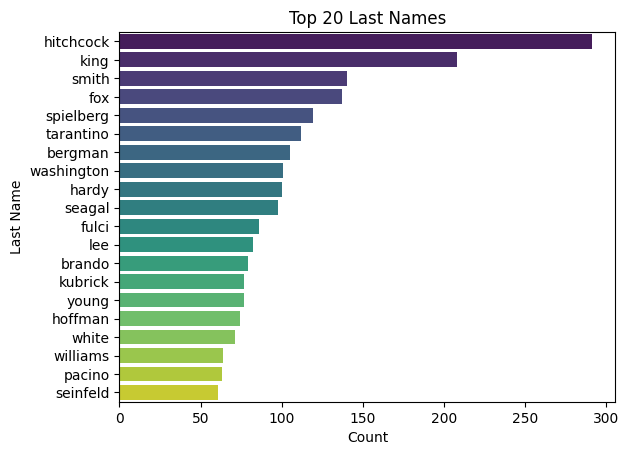

In [43]:
person_entities = entities_multi_token[entities_multi_token['type'] == 'PERSON']
# uppercase first name, last name, entity
person_entities = person_entities.copy()
person_entities = person_entities[["first_name", "last_name", "entity"]]

freq = (
    raw_entities_single_token
    .groupby('entity')
    .size()
    .rename('global_count')
)

filtered_single_token = (
    raw_entities_single_token
    .merge(freq, on='entity')
    .query('global_count >= 5')
    .copy()
)


@lru_cache(maxsize=None)
def resolve_film_single(entity):
    if entity.lower() in COMMON_FRANCHISES:
        return "FILM"
    return None

resolve_film_single.cache_clear()

# --- NEW STEP: Resolve films first for single token entities ---
# Apply the film resolver
filtered_single_token['temp_type'] = filtered_single_token['entity'].apply(resolve_film_single)

# Separate out the single token films
single_token_films = filtered_single_token[filtered_single_token['temp_type'] == 'FILM'].copy()
single_token_films['type'] = 'FILM' # Set the actual type

# Keep only the non-film single tokens for person resolution
entities_single_token_persons = filtered_single_token[filtered_single_token['temp_type'].isna()].copy()
entities_single_token_persons.drop(columns=['temp_type'], inplace=True) # Drop temporary type column

CANDIATE_SINGLE_TOKEN = COMMON_LAST_NAMES - COMMON_FIRST_NAMES - COMMON_LOCATIONS

# Drop all entities that are not in the candidate set (remaining are potential last names)
entities_single_token_persons = entities_single_token_persons[
    entities_single_token_persons['entity'].isin(CANDIATE_SINGLE_TOKEN)
]

top_percent = entities_single_token_persons['entity'].value_counts().quantile(1.0)
entities_single_token_persons = entities_single_token_persons[
    entities_single_token_persons['entity'].map(entities_single_token_persons['entity'].value_counts()) <= top_percent
]

last_names_df = entities_single_token_persons['entity'].value_counts().head(20).reset_index()
last_names_df.columns = ['last_name', 'count']
sns.barplot(x=last_names_df['count'], y=last_names_df['last_name'], palette='viridis', hue=last_names_df['last_name'], legend=False)
plt.xlabel('Count')
plt.ylabel('Last Name')
plt.title('Top 20 Last Names')
plt.show()

# After filtering entities_single_token_persons, resolve to full name using multi-token context
resolved_names = (
    entities_multi_token[entities_multi_token["type"] == "PERSON"][["review_index", "entity", "last_name"]]
    .rename(columns={"entity": "resolved_entity"})
)

entities_single_token_persons = entities_single_token_persons.merge(
    resolved_names,
    left_on=["review_index", "entity"],   # entity here is the last name token e.g. "Smith"
    right_on=["review_index", "last_name"],
    how="left"
)

# Where no match found, resolved_entity stays as the raw token (will be dropped later anyway)
entities_single_token_persons["entity"] = entities_single_token_persons["resolved_entity"].fillna(entities_single_token_persons["entity"])
entities_single_token_persons = entities_single_token_persons.drop(columns=["resolved_entity", "last_name"])
entities_single_token_persons['type'] = 'PERSON' # Explicitly set type for these

### Matching Last Name Candidates

In [44]:
# ── Step 1: Build raw last_name_dominant ───────────────────────────────────
last_name_dominant = (
    person_entities
    .merge(entities_sentiment[["review_index", "entity"]], on="entity")
    .groupby(["last_name", "entity"])
    .size()
    .reset_index(name="count")
)

# ── Step 2: Prefix resolution within last_name groups ─────────────────────
prefix_remaps = {}  # { (last_name, old_entity): new_entity }

def resolve_prefix_names(group):
    if len(group) == 1:
        return group

    group = group.copy().sort_values("count", ascending=False)
    entities = group["entity"].tolist()
    counts = dict(zip(group["entity"], group["count"]))
    last_name = group["last_name"].iloc[0]

    remap = {}
    for i, name_a in enumerate(entities):
        for name_b in entities[i+1:]:
            first_a = name_a.split()[0].lower()
            first_b = name_b.split()[0].lower()
            # Guard against very short names causing false positive prefix matches
            if len(first_a) >= 3 and len(first_b) >= 3:
                if first_a.startswith(first_b) or first_b.startswith(first_a):
                    if counts[name_a] >= counts[name_b]:
                        remap[name_b] = name_a
                    else:
                        remap[name_a] = name_b

    for src, tgt in remap.items():
        prefix_remaps[(last_name, src)] = tgt
        counts[tgt] = counts.get(tgt, 0) + counts[src]

    group = group[~group["entity"].isin(remap.keys())].copy()
    group["count"] = group["entity"].map(counts)
    return group


last_name_dominant = (
    last_name_dominant
    .groupby("last_name", group_keys=False)
    .apply(resolve_prefix_names)
    .reset_index(drop=True)
)

# ── Step 3: Recompute pct and dominant_lookup after prefix resolution ──────
last_name_totals = last_name_dominant.groupby("last_name")["count"].sum()
last_name_dominant["pct"] = last_name_dominant.apply(
    lambda row: row["count"] / last_name_totals[row["last_name"]], axis=1
)

dominant_lookup = (
    last_name_dominant[last_name_dominant["pct"] >= 0.85]
    .set_index("last_name")["entity"]
    .to_dict()
)  # e.g. {"cruise": "Tom Cruise", "pitt": "Brad Pitt"}

review_last_name_lookup = (
    entities_multi_token[entities_multi_token["type"] == "PERSON"][
        ["review_index", "entity", "last_name"]
    ]
    .rename(columns={"entity": "resolved_entity"})
)

# Rebuild review_last_name_lookup after prefix resolution
_review_entity_base = (
    person_entities
    .merge(entities_sentiment[["review_index", "entity"]], on="entity")
)
# Apply prefix remaps to the entity column before building the lookup
_review_entity_base["entity"] = _review_entity_base.apply(
    lambda row: prefix_remaps.get((row["last_name"], row["entity"]), row["entity"]),
    axis=1
)

review_last_name_lookup = (
    _review_entity_base
    .set_index(["review_index", "last_name"])["entity"]
    .to_dict()
)

# ── Step 5: Apply resolution to entities_single_token ─────────────────────
entities_single_token_persons["resolved_entity"] = entities_single_token_persons.apply(
    lambda row:
        review_last_name_lookup.get(
            (row["review_index"], row["entity"].lower()), # Lookup in current review first
            dominant_lookup.get(
                row["entity"].lower(), # Fallback to global dominant if not found in review
                prefix_remaps.get((row["entity"].lower(), row["entity"]), row["entity"]) # Fallback to prefix remap
            )
        ) if row["entity"].lower() in COMMON_LAST_NAMES # Only attempt lookup if it's a known last name
        else row["entity"],
    axis=1
)

entities_single_token_persons = entities_single_token_persons[
    entities_single_token_persons["resolved_entity"] != entities_single_token_persons["entity"]
]

entities_single_token_persons = entities_single_token_persons.drop(columns=["entity"]).rename(
    columns={"resolved_entity": "entity"}
)
entities_single_token_persons["type"] = "PERSON"

# ── Step 6: Apply resolution to entities_multi_token ──────────────────────
# For multi-token entities, primarily keep the entity as is.
# Only apply prefix_remaps if applicable, but do NOT use dominant_lookup
# to change one multi-token person name to another based on last name.
entities_multi_token["resolved_entity"] = entities_multi_token.apply(
    lambda row: (
        # If it's a PERSON, check for prefix remaps only
        prefix_remaps.get((row["last_name"], row["entity"]), row["entity"])
        if row["type"] == "PERSON"
        else row["entity"] # Otherwise, keep the entity as is
    ),
    axis=1
)

entities_multi_token = entities_multi_token.drop(columns=["entity"]).rename(
    columns={"resolved_entity": "entity"}
)


/tmp/ipykernel_3094/1519570928.py:47: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(resolve_prefix_names)


## Evaluation

In Figure 13, we can see that Alfred Hitchcock has the most mentions, with net positive sentiment, followed by Stephen King (at mixed), and Clint Eastwood. We also note that Quentin Tarantino has a net negative sentiment. For films/characters, Shakespeare, Halloween (film, ambiguous), Batman, and Star Wars are highly mentioned. Out of these three, only Batman and Shakespeare seem to have a net positive sentiment, while both Halloween and Star Wars are negative and mixed, respectively. On the other hand, Ed Wood seems to have a majority net negative sentiment. Finally, we compare sentiment lift when an actor/film pair are mentioned together. For example, when Tim Burton and Batman are mentioned together, the overall sentiment is positive, and the same for Pierce Brosnan and James Bond.

From Figure 14, we compare sentiment lift when multiple actor/person pairs are mentioned together. While data is limited here, we observe that there may be a net positive sentiment gain, such as for Bud Abbott and Lou Castello.

From Figure 15, we compare sentiment lift when multiple film/character pairs are mentioned together. For example, Batman and Bruce Wayne mentioned together has a net positive sentiment gain, while Alien and Predator both experience a net negative loss.


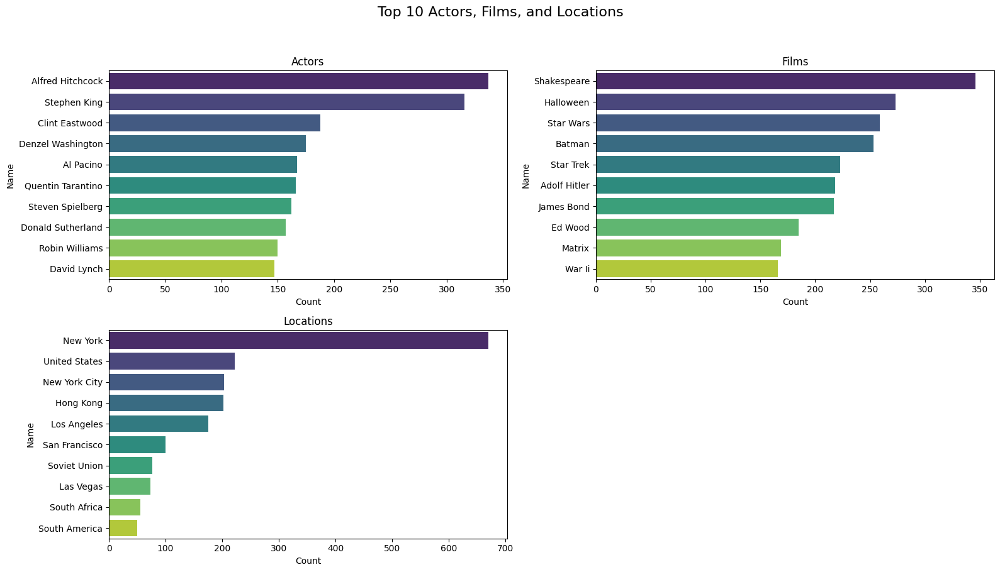

(<Figure size 1600x1000 with 4 Axes>,
 [<Axes: title={'center': 'Actors'}, xlabel='Count', ylabel='Name'>,
  <Axes: title={'center': 'Films'}, xlabel='Count', ylabel='Name'>,
  <Axes: title={'center': 'Locations'}, xlabel='Count', ylabel='Name'>,
  <Axes: >])

In [45]:
# Start merging
entity_df1 = entities_multi_token.drop(columns=['first_name', 'last_name'])
entity_df2 = entities_single_token_persons.copy() # Now uses the persons dataframe
entity_df3 = single_token_films.copy() # Add the single token films
entities = pd.concat([entity_df1, entity_df2, entity_df3], ignore_index=True) # Concatenate all three
# To get the sentiment per actor, we need to filter out same actors (via entity) that are in the same review index (only keep one mention)
entities = entities.drop_duplicates(subset=['review_index', 'entity'], keep='first')

# Title case the entity
entities.loc[:, 'entity'] = entities['entity'].str.lower()
# For entities of type person, if the 'entity' matches a CHARACTER change it to FILM
mask = (entities['type'] == 'PERSON') & (entities['entity'].isin(CHARACTERS))

# Change their type to FILM
entities.loc[mask, 'type'] = 'FILM'

# Title case it
entities['entity'] = entities['entity'].apply(lambda x: string.capwords(str(x)))

# Fixes: With a map, replace:  "Spider-man" -> "Spiderman"
MOVIE_REMAP = {
    "Spiderman": ["Spider-man", "Spider Man"], # Title cased
    "Ironman": ["Iron-man", "Iron Man"],
    "Batman": ["Bat-man", "Bat Man"],
    "Superman": ["Super-man", "Super Man"],
    "X-Men": ["Xmen", "X Men"],
    "Ant-Man": ["Antman", "Ant Man"],
    "James Bond": ["Bond"],
    "Harry Potter": ["Potter"],
    "Three Stooges": ["Stooges"],
    "Star Trek": ["Trek"],
    'George Armstrong Custer': ['Gen Custer'],
    'Adolf Hitler': ["Hitler"],
    "Friday The 13th": ["Friday 13th"],
    "Shakespeare": ["William Shakespeare"],
    "Dr Jekyll And Mr Hyde": ["Dr Jekyll", "Mr Hyde"]
}

# Apply the movie remapping
for target, sources in MOVIE_REMAP.items():
    for source in sources:
        entities.loc[entities['entity'] == source, 'entity'] = target

# Fixes: Location Hong Kong vs Film Kong/King Kong: Set Hong Kong to location
entities.loc[entities['entity'] == 'Hong Kong', 'type'] = 'LOCATION'

# FILM ADDITION: For COMMON_FRANCHISES: add additional film entities (ie Batman vs Batman Returns)
# This loop will normalize specific film titles to their parent franchise name if they are part of one.
for franchise in COMMON_FRANCHISES:
    canonical_franchise = franchise.title()
    # Find film entities that start with the canonical franchise name and are longer
    # (to avoid remapping "Batman" to "Batman")
    mask = (entities['type'] == 'FILM') & \
           (entities['entity'].str.startswith(canonical_franchise + ':')) | \
           (entities['entity'].str.startswith(canonical_franchise + ' ')) & \
           (entities['entity'] != canonical_franchise)
    entities.loc[mask, 'entity'] = canonical_franchise

actors = entities[entities['type'] == 'PERSON']
films = entities[entities['type'] == 'FILM']
locations = entities[entities['type'] == 'LOCATION']

# Prepare plot func
def plot_actors_films_locations(df, title_prefix):
    def plot_func(ax):
        df_to_plot = df['entity'].value_counts().head(10).reset_index()
        df_to_plot.columns = ['entity', 'count']
        sns.barplot(x=df_to_plot['count'], y=df_to_plot['entity'], palette='viridis', hue=df_to_plot['entity'], legend=False, ax=ax)
        ax.set_xlabel('Count')
        ax.set_ylabel('Name')
        ax.set_title(f'{title_prefix}')
    return plot_func

act_film_loc_plots = []
act_film_loc_plots.append(plot_actors_films_locations(actors, "Actors"))
act_film_loc_plots.append(plot_actors_films_locations(films, "Films"))
act_film_loc_plots.append(plot_actors_films_locations(locations, "Locations"))
plot_grid(
    plot_functions=act_film_loc_plots,
    n_cols=2,
    figsize_per_plot=(8, 5),
    suptitle="Top 10 Actors, Films, and Locations",
    sharex=False,
    sharey=False
)

In [46]:
# =============================================================================
# SENTIMENT PER ACTOR
# =============================================================================

actor_sentiment = (
    actors
    .groupby("entity")["sentiment"]
    .agg(mean_sentiment="mean", mention_count="count")
    .reset_index()
    .sort_values("mention_count", ascending=False)
)
# Rename the 'entity' to actor/director
actor_sentiment = actor_sentiment.rename(columns={"entity": "actor"})

# =============================================================================
# SENTIMENT PER FILM
# =============================================================================
film_sentiment = (
    films
    .groupby("entity")["sentiment"]
    .agg(mean_sentiment="mean", mention_count="count")
    .reset_index()
    .sort_values("mention_count", ascending=False)
)

film_sentiment = film_sentiment.rename(columns={"entity": "film"})

# =============================================================================
# ACTOR <-> FILM CO-OCCURRENCE + SENTIMENT
# =============================================================================
actor_film = (
    actors[["review_index", "entity", "sentiment"]].rename(columns={"entity": "actor"})
    .merge(
        films[["review_index", "entity"]].rename(columns={"entity": "film"}),
        on="review_index"
    )
    .groupby(["actor", "film"])["sentiment"]
    .agg(mean_sentiment="mean", mention_count="count")
    .reset_index()
    .sort_values("mention_count", ascending=False)
)

# =============================================================================
# ACTOR <-> ACTOR CO-OCCURRENCE + SENTIMENT
# =============================================================================
actor_actor = (
    actors[["review_index", "entity", "sentiment"]].rename(columns={"entity": "actor_a", "sentiment": "sentiment_a"})
    .merge(
        actors[["review_index", "entity", "sentiment"]].rename(columns={"entity": "actor_b", "sentiment": "sentiment_b"}),
        on="review_index"
    )
    .query("actor_a < actor_b")
    .groupby(["actor_a", "actor_b"])
    .agg(
        co_occurrences=("review_index", "count"),
        mean_sentiment_a=("sentiment_a", "mean"),
        mean_sentiment_b=("sentiment_b", "mean"),
    )
    .reset_index()
    .sort_values("co_occurrences", ascending=False)
)

# Sentiment lift: how much better/worse is each actor's sentiment when appearing together
# vs their overall average
actor_baseline = actor_sentiment.set_index("actor")["mean_sentiment"]

actor_actor["lift_a"] = actor_actor["mean_sentiment_a"] - actor_actor["actor_a"].map(actor_baseline)
actor_actor["lift_b"] = actor_actor["mean_sentiment_b"] - actor_actor["actor_b"].map(actor_baseline)
# Drop mean
actor_actor = actor_actor.drop(columns=["mean_sentiment_a", "mean_sentiment_b"])


# Film vs fim co-occurence
film_film = (
    films[["review_index", "entity", "sentiment"]].rename(columns={"entity": "film_a", "sentiment": "sentiment_a"})
    .merge(
        films[["review_index", "entity", "sentiment"]].rename(columns={"entity": "film_b", "sentiment": "sentiment_b"}),
        on="review_index"
    )
    .query("film_a < film_b")
    .groupby(["film_a", "film_b"])
    .agg(
        co_occurrences=("review_index", "count"),
        mean_sentiment_a=("sentiment_a", "mean"),
        mean_sentiment_b=("sentiment_b", "mean"),
        )
    .reset_index()
    .sort_values("co_occurrences", ascending=False)
)

# Sentiment lift: how much better/worse is each film's sentiment when appearing together
# vs their overall average
film_baseline = film_sentiment.set_index("film")["mean_sentiment"]

film_film["lift_a"] = film_film["mean_sentiment_a"] - film_film["film_a"].map(film_baseline)
film_film["lift_b"] = film_film["mean_sentiment_b"] - film_film["film_b"].map(film_baseline)
# Drop mean
film_film = film_film.drop(columns=["mean_sentiment_a", "mean_sentiment_b"])


display(actor_sentiment.head(50))
display(film_sentiment.head(50))
display(actor_film.head(10))
display(actor_actor.head(10))
display(film_film.head(20))

,actor,mean_sentiment,mention_count
87,Alfred Hitchcock,0.617211,337
3550,Stephen King,0.496835,316
709,Clint Eastwood,0.686170,188
929,Denzel Washington,0.537143,175
43,Al Pacino,0.568862,167
3045,Quentin Tarantino,0.427711,166
3586,Steven Spielberg,0.543210,162
987,Donald Sutherland,0.579618,157
3254,Robin Williams,0.500000,150
873,David Lynch,0.517007,147


,film,mean_sentiment,mention_count
554,Shakespeare,0.578035,346
265,Halloween,0.417582,273
587,Star Wars,0.513514,259
69,Batman,0.624506,253
586,Star Trek,0.560538,223
8,Adolf Hitler,0.541284,218
332,James Bond,0.649770,217
188,Ed Wood,0.129730,185
430,Matrix,0.485207,169
691,War Ii,0.734940,166


,actor,film,mean_sentiment,mention_count
14955,Tim Burton,Batman,0.883721,43
8737,Kenneth Branagh,Shakespeare,0.666667,39
10117,Matt Damon,Bourne,0.864865,37
7692,John Carpenter,Halloween,0.750000,36
13745,Sean Connery,James Bond,0.916667,36
3223,Danny Devito,Batman,1.000000,33
12055,Pierce Brosnan,James Bond,0.781250,32
10525,Michael Keaton,Batman,0.965517,29
10572,Michael Myers,Halloween,0.678571,28
2705,Christopher Walken,Batman,1.000000,28


,actor_a,actor_b,co_occurrences,lift_a,lift_b
9289,Bud Abbott,Lou Costello,48,-0.024802,0.062500
12725,Christopher Lee,Peter Cushing,34,0.210187,0.073529
5805,Bela Lugosi,Boris Karloff,30,0.311538,0.121127
18470,Dorothy Malone,Robert Stack,25,0.106341,0.249474
39528,Paul Newman,Tom Hanks,25,0.274366,0.265714
29190,Jean Simmons,Marlon Brando,24,0.116379,0.185924
41319,Robert Stack,Rock Hudson,24,0.206140,0.241342
27357,Jack Lemmon,Walter Matthau,24,0.113095,0.042367
18471,Dorothy Malone,Rock Hudson,23,0.102863,0.281197
7950,Brad Pitt,Bruce Willis,23,0.210835,0.302258


,film_a,film_b,co_occurrences,lift_a,lift_b
425,Batman,Bruce Wayne,38,0.270231,0.067151
1747,Jedi,Star Wars,22,0.125874,0.304668
126,Alien,Predator,19,-0.244837,-0.140917
2287,Star Trek,Star Wars,18,-0.004983,0.042042
576,Bourne,Jason Bourne,18,0.155556,-0.061111
2013,Merchant Of Venice,Shakespeare,17,-0.044118,0.127848
472,Batman,Superman,16,0.125494,0.237179
915,Darth Vader,Star Wars,16,0.217857,0.361486
62,Adolf Hitler,War Ii,15,0.392049,0.198394
1498,House Of Frankenstein,Wolf Man,13,0.033654,0.279487


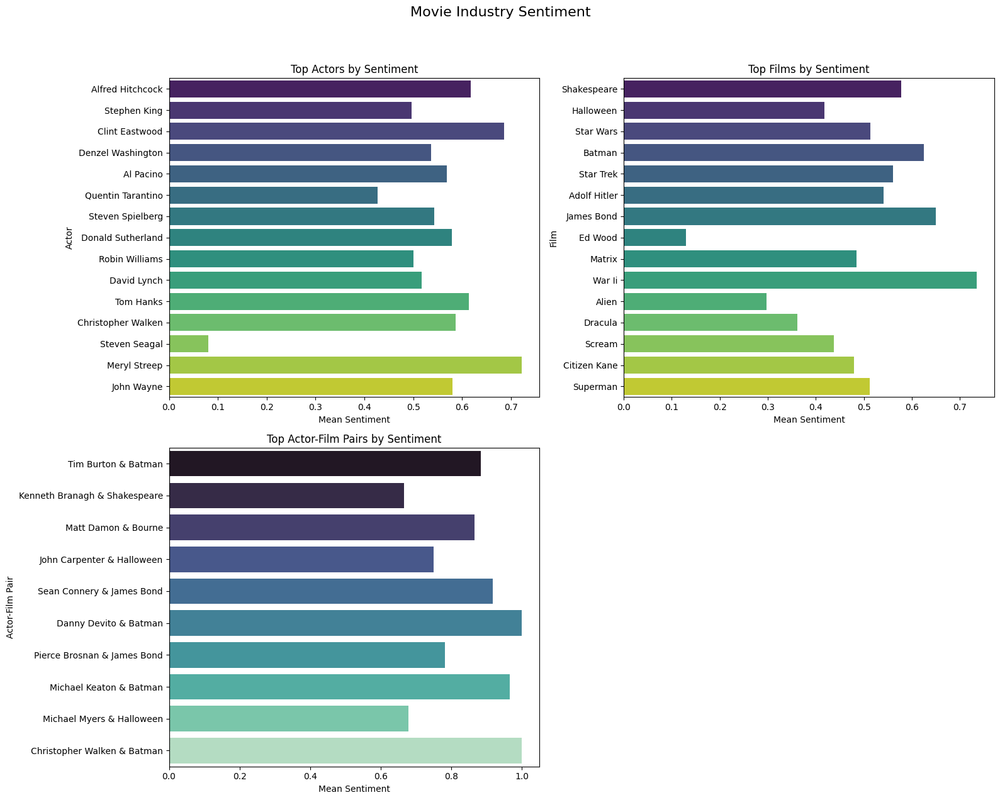

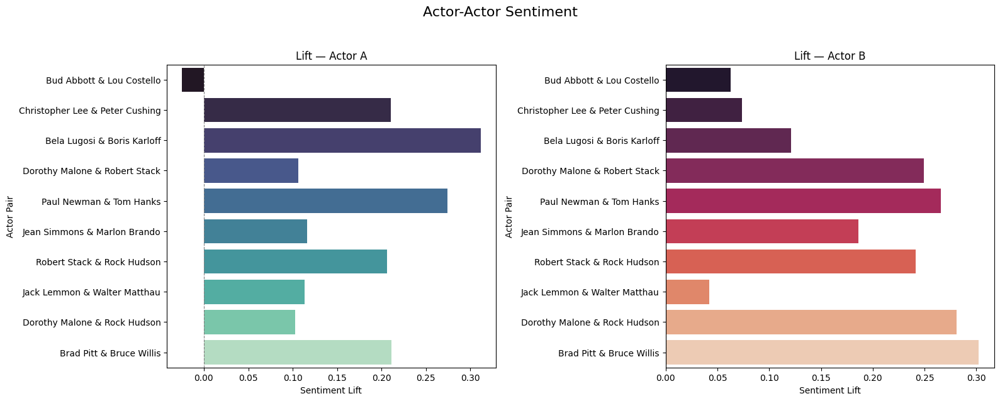

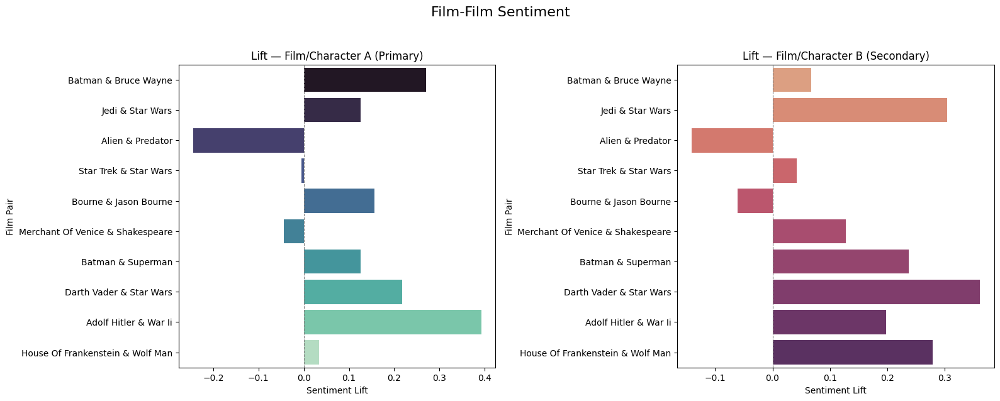

In [47]:
# ---------------------------------------------------------
# 1. INDIVIDUAL PLOTTER FUNCTIONS
# ---------------------------------------------------------

def plot_actor_sentiment(ax, actor_sentiment, top_n=15):
    data = actor_sentiment.head(top_n)
    sns.barplot(
        x='mean_sentiment', y='actor', data=data,
        palette='viridis', hue='actor', legend=False, ax=ax
    )
    ax.set_title('Top Actors by Sentiment')
    ax.set_xlabel('Mean Sentiment')
    ax.set_ylabel('Actor')

def plot_film_sentiment(ax, film_sentiment, top_n=15):
    data = film_sentiment.head(top_n)
    sns.barplot(
        x='mean_sentiment', y='film', data=data,
        palette='viridis', hue='film', legend=False, ax=ax
    )
    ax.set_title('Top Films by Sentiment')
    ax.set_xlabel('Mean Sentiment')
    ax.set_ylabel('Film')

def plot_actor_lift(ax, actor_actor, lift_col='lift_a', title='Sentiment Lift — Actor A', top_n=10):
    # Prepare pair labels
    df = actor_actor.head(top_n).copy()
    df['actor_pair'] = df['actor_a'] + ' & ' + df['actor_b']

    palette = 'mako' if 'a' in lift_col else 'rocket'

    sns.barplot(
        x=lift_col, y='actor_pair', data=df,
        palette=palette, hue='actor_pair', legend=False, ax=ax
    )
    ax.set_title(title)
    ax.set_xlabel('Sentiment Lift')
    ax.set_ylabel('Actor Pair')
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)


def plot_film_lift(ax, film_film, lift_col='lift_a', title='Sentiment Lift — Film A', top_n=10):
    """
    Plots the sentiment lift for film pairings.
    """
    df = film_film.head(top_n).copy()
    df['film_pair'] = df['film_a'] + ' & ' + df['film_b']

    # Using a purple/blue palette to distinguish from actor plots
    palette = 'mako' if 'a' in lift_col else 'flare'

    sns.barplot(
        x=lift_col, y='film_pair', data=df,
        palette=palette, hue='film_pair', legend=False, ax=ax
    )
    ax.set_title(title)
    ax.set_xlabel('Sentiment Lift')
    ax.set_ylabel('Film Pair')
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)

def plot_actor_film_lift(ax, actor_film, top_n=10):
    """
    Plots the mean sentiment for actor-film pairings.
    """
    df = actor_film.head(top_n).copy()
    df['actor_film_pair'] = df['actor'] + ' & ' + df['film']
    # mean_sentiment
    sns.barplot(
        x='mean_sentiment', y='actor_film_pair', data=df,
        palette='mako', hue='actor_film_pair', legend=False, ax=ax
    )
    ax.set_title('Top Actor-Film Pairs by Sentiment')
    ax.set_xlabel('Mean Sentiment')
    ax.set_ylabel('Actor-Film Pair')
    ax.axvline(0, color='gray', linestyle='--', linewidth=0.8)

# ---------------------------------------------------------
# 2. GRID EXECUTION
# ---------------------------------------------------------

def plot_movie_insights_grid(actor_sentiment, film_sentiment, actor_actor):
    """
    Bundles actor, film, and interaction lift into a 2x2 grid.
    """
    # Use your existing plot_grid utility
    plot_grid(
        plot_functions=[
            lambda ax: plot_actor_sentiment(ax, actor_sentiment),
            lambda ax: plot_film_sentiment(ax, film_sentiment),
            lambda ax: plot_actor_film_lift(ax, actor_film)
        ],
        n_cols=2,
        figsize_per_plot=(8, 7),
        suptitle="Movie Industry Sentiment",
        sharex=False,
        sharey=False
    )
    plot_grid(
        plot_functions=[
            lambda ax: plot_actor_lift(ax, actor_actor, lift_col='lift_a', title='Lift — Actor A'),
            lambda ax: plot_actor_lift(ax, actor_actor, lift_col='lift_b', title='Lift — Actor B'),
        ],
        n_cols=2,
        figsize_per_plot=(8, 7),
        suptitle="Actor-Actor Sentiment",
        sharex=False,
        sharey=False
    )

    plot_grid(
        plot_functions=[
            lambda ax: plot_film_lift(ax, film_film, lift_col='lift_a', title='Lift — Film/Character A (Primary)'),
            lambda ax: plot_film_lift(ax, film_film, lift_col='lift_b', title='Lift — Film/Character B (Secondary)')
        ],
        n_cols=2,
        figsize_per_plot=(8, 7),
        suptitle="Film-Film Sentiment",
        sharex=False,
        sharey=False
    )


# Run it
plot_movie_insights_grid(actor_sentiment, film_sentiment, actor_actor)

## Additional Insights
We can gather further insights from our top actors and films. Instead of relying on words like  "terrible", which are already common semantic indicators, we like to know the "what" behind it. Specifically, the phrases drive POS/NEG sentiment, after removing English dictionary words. Figures 16 and 17 reveals word associations for actors, and films, respectively.

In [48]:
top_actors = actor_sentiment.nlargest(9, 'mention_count')['actor'].tolist()
top_films = film_sentiment.nlargest(9, 'mention_count')['film'].tolist()
select_actors = actors[actors['entity'].isin(top_actors)]
select_films = films[films['entity'].isin(top_films)]
select_actors = select_actors[['entity', 'review_index']]
select_films = select_films[['entity', 'review_index']]

print("Most frequently mentioned persons:", top_actors)
print("Most frequently mentioned films:", top_films)

Most frequently mentioned persons: ['Alfred Hitchcock', 'Stephen King', 'Clint Eastwood', 'Denzel Washington', 'Al Pacino', 'Quentin Tarantino', 'Steven Spielberg', 'Donald Sutherland', 'Robin Williams']
Most frequently mentioned films: ['Shakespeare', 'Halloween', 'Star Wars', 'Batman', 'Star Trek', 'Adolf Hitler', 'James Bond', 'Ed Wood', 'Matrix']


In [49]:
# Collect all the review_indexes, these are the review cols we are going to target
review_indexes = pd.concat([select_actors['review_index'], select_films['review_index']]).unique()
# Add review_index as column name
review_indexes = pd.DataFrame(review_indexes, columns=['review_index'])

# create a copy of reviews, add review_idx as a new col
select_reviews = movie_reviews_entities.copy(deep=True)
select_reviews['review_index'] = select_reviews.index
select_reviews.drop(columns=['review'], inplace=True)

# Drop select review rows not in review_indexes
select_reviews = select_reviews[select_reviews['review_index'].isin(review_indexes['review_index'])]
print(select_reviews.shape)

(3646, 5)


In [50]:
# Group by review_index, collect all actors and films mentioned as lists
actor_groups = select_actors.groupby('review_index')['entity'].apply(list).rename('actors_mentioned')
film_groups  = select_films.groupby('review_index')['entity'].apply(list).rename('films_mentioned')

# Join back onto select_reviews
select_reviews = (
    select_reviews
    .merge(actor_groups, on='review_index', how='left')
    .merge(film_groups,  on='review_index', how='left')
)

# Fill NaN with empty list for reviews that mention no actor/film from top N
select_reviews['actors_mentioned'] = select_reviews['actors_mentioned'].apply(
    lambda x: x if isinstance(x, list) else []
)
select_reviews['films_mentioned'] = select_reviews['films_mentioned'].apply(
    lambda x: x if isinstance(x, list) else []
)
select_reviews.head()

,sentiment,cleaned_review,extracted_entities,extracted_genres,review_index,actors_mentioned,films_mentioned
0,1,A wonderful little production. ### ### The fil...,"[Orton, Halliwell, Orton and Halliwell, Willia...","[comedy, fantasy]",1,[Robin Williams],[]
1,0,The cast played Shakespeare. ### ### Shakespea...,"[Rev Bowdler, Victorian, Shakespeare, Scottish...",[],13,[],[Shakespeare]
2,0,This movie made it into one of my top 10 most ...,"[the Matrix, Vader, and Vader, Save, Terminato...",[],17,[],"[Star Wars, Matrix]"
3,0,"First of all, let ### get a few things straigh...","[Preschool, Honestly, FX, Speed Racer, Mike on...","[action, anime, animation]",23,[],[Halloween]
4,1,One of the most significant quotes from the en...,"[Italian-speaking Canton of Switzerland, Sofia...",[],33,[Al Pacino],[]


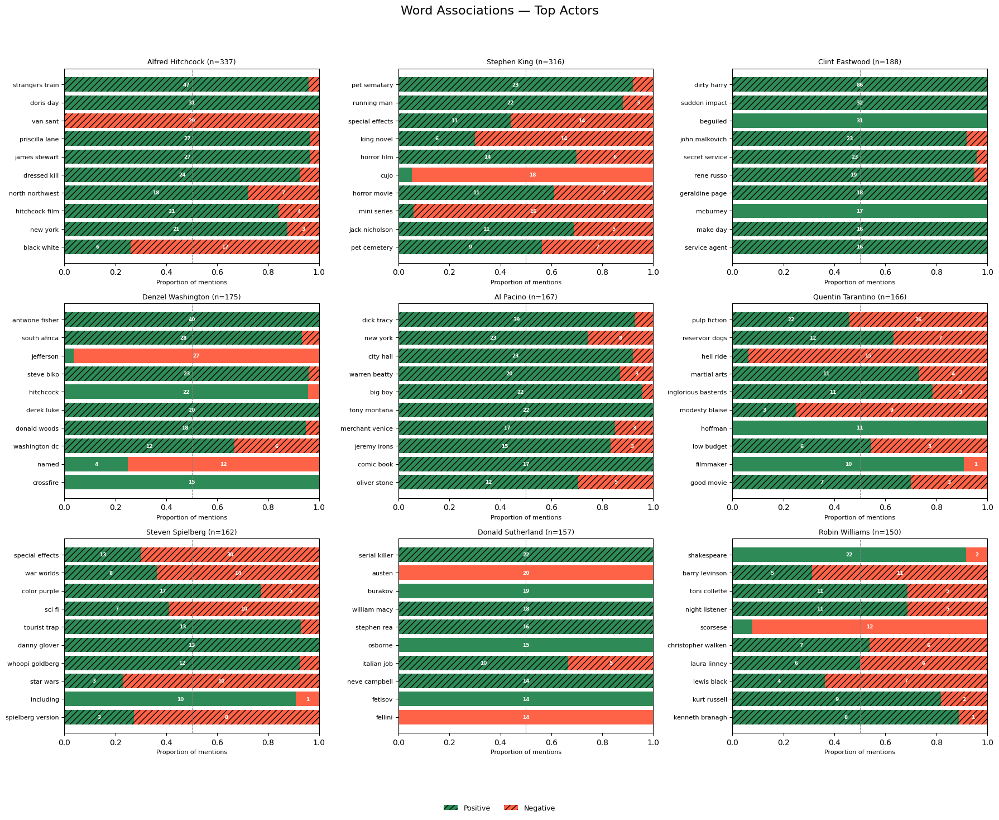

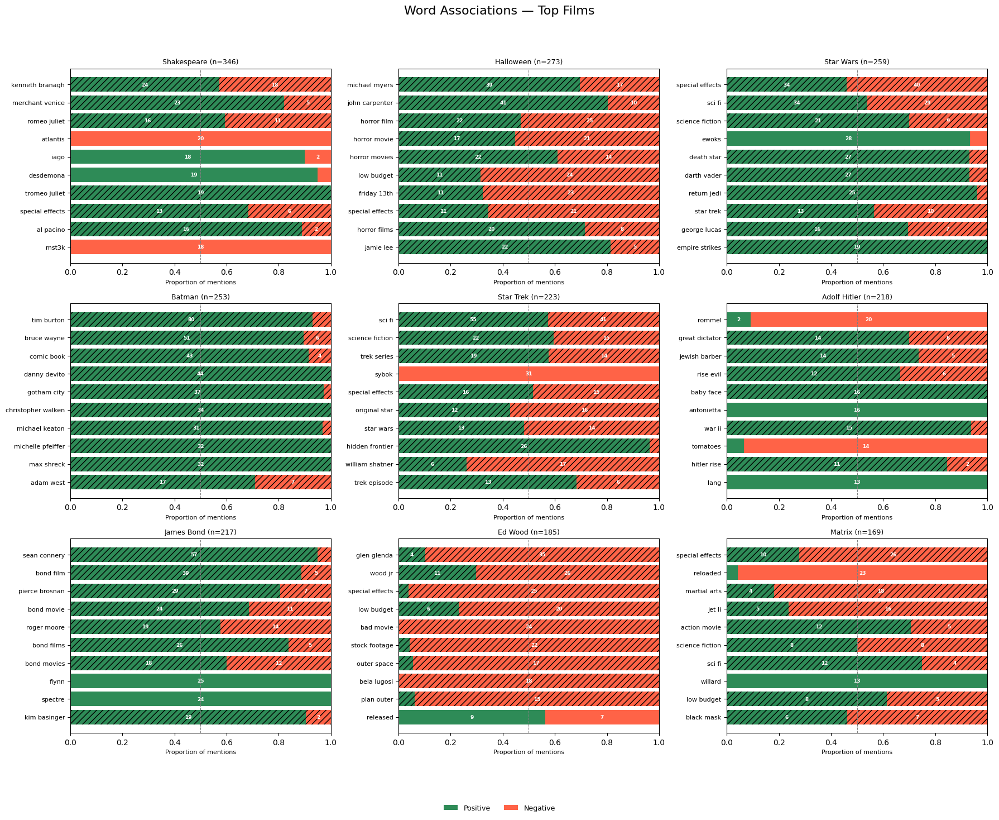

(<Figure size 1800x1500 with 9 Axes>,
 [<Axes: title={'center': 'Shakespeare (n=346)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Halloween (n=273)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Star Wars (n=259)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Batman (n=253)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Star Trek (n=223)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Adolf Hitler (n=218)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'James Bond (n=217)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Ed Wood (n=185)'}, xlabel='Proportion of mentions'>,
  <Axes: title={'center': 'Matrix (n=169)'}, xlabel='Proportion of mentions'>])

In [51]:
# =============================================================================
# EXPLODE: one row per actor/film mention
# =============================================================================
actor_reviews = (
    select_reviews[select_reviews['actors_mentioned'].apply(len) > 0]
    .explode('actors_mentioned')
    .rename(columns={'actors_mentioned': 'entity'})
    [['review_index', 'entity', 'sentiment', 'cleaned_review']]
)

film_reviews = (
    select_reviews[select_reviews['films_mentioned'].apply(len) > 0]
    .explode('films_mentioned')
    .rename(columns={'films_mentioned': 'entity'})
    [['review_index', 'entity', 'sentiment', 'cleaned_review']]
)

from nltk.stem import SnowballStemmer
stemmer = SnowballStemmer("english")

@lru_cache(maxsize=2048)
def is_not_ignored(w):
    return stemmer.stem(w) not in IGNORE_NAME_SET
# =============================================================================
# GET TERM PROPORTIONS
# =============================================================================
def get_term_proportions(pos_texts, neg_texts, entity, ngram_range=(1, 2),
                          top_n=10, min_count=5, unigram_log_odds_threshold=1.5):
    all_texts = pos_texts + neg_texts
    labels    = [1] * len(pos_texts) + [0] * len(neg_texts)
    entity_tokens = set(entity.lower().split())

    vec = CountVectorizer(
        ngram_range=ngram_range,
        stop_words='english',
        min_df=2,
        max_df=0.95,
    )

    X     = vec.fit_transform(all_texts).toarray()
    vocab = np.array(vec.get_feature_names_out())

    pos_counts = X[np.array(labels) == 1].sum(axis=0)
    neg_counts = X[np.array(labels) == 0].sum(axis=0)
    total      = pos_counts + neg_counts

    # min_count filter
    mask       = total >= min_count
    pos_counts = pos_counts[mask]
    neg_counts = neg_counts[mask]
    total      = total[mask]
    vocab      = vocab[mask]

    is_bigram = np.array([len(w.split()) == 2 for w in vocab])
    # Drop name noise unigrams
    neutral_mask = np.array([
        is_bigram[i] or (w not in IGNORE_NAME_SET and w.rstrip("s") not in IGNORE_NAME_SET)
        for i, w in enumerate(vocab)
    ])
    pos_counts = pos_counts[neutral_mask]
    neg_counts = neg_counts[neutral_mask]
    total      = total[neutral_mask]
    vocab      = vocab[neutral_mask]
    is_bigram  = is_bigram[neutral_mask]

    # Drop terms that are just the entity name itself
    entity_mask = np.array([
        not all(tok in w.split() for tok in entity_tokens)
        for w in vocab
    ])
    pos_counts = pos_counts[entity_mask]
    neg_counts = neg_counts[entity_mask]
    total      = total[entity_mask]
    vocab      = vocab[entity_mask]
    is_bigram  = is_bigram[entity_mask]

    result = pd.DataFrame({
        'word':      vocab,
        'pos_count': pos_counts,
        'neg_count': neg_counts,
        'total':     total,
        'pos_prop':  pos_counts / total,
        'neg_prop':  neg_counts / total,
        'is_bigram': is_bigram,
    })

    result = filter_redundant_unigrams_proportions(result)

    pos_freq = (result['pos_count'] + 1) / (result['pos_count'].sum() + 1)
    neg_freq = (result['neg_count'] + 1) / (result['neg_count'].sum() + 1)
    result['log_odds'] = np.log(pos_freq / neg_freq)
    result = result[
        result['is_bigram'] |                                          # always keep bigrams
        (result['log_odds'].abs() >= unigram_log_odds_threshold)       # unigrams must earn their place
    ]

    # Top N by total count, then sort ascending so most frequent is at top of chart
    return result.nlargest(top_n, 'total').sort_values('total', ascending=True)


# =============================================================================
# drop unigrams covered by any bigram
# =============================================================================
def filter_redundant_unigrams_proportions(df):
    bigram_words = set(
        word
        for phrase in df[df['is_bigram']]['word']
        for word in phrase.split()
    )

    first_word_is_noise = df['word'].str.split().str[0].isin(WORDS_TO_REMOVE)

    keep = (df['is_bigram'] & ~first_word_is_noise) | \
           (~df['is_bigram'] & ~df['word'].isin(bigram_words))
    return df[keep]


# =============================================================================
# SINGLE-ENTITY PLOT FUNCTION
# =============================================================================
def make_entity_plot_fn(reviews_df, entity, ngram_range=(1, 2)):
    def plot_fn(ax):
        subset    = reviews_df[reviews_df['entity'] == entity]
        pos_texts = subset[subset['sentiment'] == 1]['cleaned_review'].tolist()
        neg_texts = subset[subset['sentiment'] == 0]['cleaned_review'].tolist()

        if len(pos_texts) < 5 or len(neg_texts) < 5:
            ax.set_title(f'{entity}\n(pos={len(pos_texts)}, neg={len(neg_texts)})', fontsize=9)
            ax.text(0.5, 0.5, 'Insufficient data', ha='center', va='center',
                    transform=ax.transAxes, color='gray')
            return

        df = get_term_proportions(pos_texts, neg_texts, entity, ngram_range=ngram_range)

        y = range(len(df))

        bars_pos = ax.barh(y, df['pos_prop'], color='seagreen', label='Positive')
        bars_neg = ax.barh(y, df['neg_prop'], left=df['pos_prop'], color='tomato', label='Negative')

        # Hatch bigrams
        for bar, is_bg in zip(bars_pos, df['is_bigram']):
            if is_bg:
                bar.set_hatch('///')
        for bar, is_bg in zip(bars_neg, df['is_bigram']):
            if is_bg:
                bar.set_hatch('///')

        # Raw counts inside each bar segment
        for i, (pp, pc, nc) in enumerate(zip(df['pos_prop'], df['pos_count'], df['neg_count'])):
            if pp > 0.08:  # only label if segment wide enough to fit text
                ax.text(pp / 2, i, f'{int(pc)}',
                        va='center', ha='center', fontsize=6.5,
                        color='white', fontweight='bold')
            neg_prop = 1 - pp
            if neg_prop > 0.08:
                ax.text(pp + neg_prop / 2, i, f'{int(nc)}',
                        va='center', ha='center', fontsize=6.5,
                        color='white', fontweight='bold')

        ax.axvline(0.5, color='gray', linestyle='--', linewidth=0.8)
        ax.set_yticks(list(y))
        ax.set_yticklabels(df['word'].tolist(), fontsize=8)
        ax.set_xlim(0, 1)
        ax.set_xlabel('Proportion of mentions', fontsize=8)
        ax.set_title(f'{entity} (n={len(subset)})', fontsize=9)
        ax.legend(fontsize=7, loc='lower right')

    return plot_fn

# =============================================================================
# RUN
# =============================================================================
plot_grid(
    plot_functions=[make_entity_plot_fn(actor_reviews, e) for e in top_actors],
    n_cols=3,
    figsize_per_plot=(6, 5),
    suptitle='Word Associations — Top Actors',
    sharex=False,
    sharey=False,
)

plot_grid(
    plot_functions=[make_entity_plot_fn(film_reviews, e) for e in top_films],
    n_cols=3,
    figsize_per_plot=(6, 5),
    suptitle='Word Associations — Top Films',
    sharex=False,
    sharey=False,
)

## Genres

As an extension, we also performed genre analysis, by scanning the review for common terms such as "action" or "comedy". We perform additional heuristic mapping, where we mapped mentioned films to their top mentioned genres, and applied to reviews mentioning those films. For example, if the top genre for "Batman" is "action", then "action" will be applied to all reviews that mention "Batman". Figures 18 and 19 reveals the EDA and distribution of those genres, respectively.

In [52]:
genre_reviews = movie_reviews_entities.copy(deep=True)
genre_reviews["review_index"] = genre_reviews.index
# add mentioned_actors
genre_reviews["actors_mentioned"] = genre_reviews['review_index'].map(
    entities[entities['type'] == 'PERSON'].groupby('review_index')['entity'].apply(list)
).fillna(value='').apply(list)

# Add mentioned films
genre_reviews["films_mentioned"] = genre_reviews['review_index'].map(
    entities[entities['type'] == 'FILM'].groupby('review_index')['entity'].apply(list)
).fillna(value='').apply(list)

# Add mentioned locations
# genre_reviews["locations_mentioned"] = genre_reviews['review_index'].map(
#     entities[entities['type'] == 'LOCATION'].groupby('review_index')['entity'].apply(list)
# ).fillna(value='').apply(list)

# Apply patch: if 'War' is in a film name, add 'War Film' to extracted_genres
def add_war_genre_if_film_contains_war(row):
    genres = set(row['extracted_genres']) if isinstance(row['extracted_genres'], list) else set()
    films = row['films_mentioned'] if isinstance(row['films_mentioned'], list) else []

    for film_name in films:
        if re.search(r'\bWar\b', film_name):  # Exact token match, case-sensitive
            genres.add('war film')
            break
    return list(genres)

genre_reviews['extracted_genres'] = genre_reviews.apply(add_war_genre_if_film_contains_war, axis=1)

# Drop extracted entties
genre_reviews.drop(columns=['extracted_entities', 'review', 'cleaned_review', 'sentiment'], inplace=True)
genre_reviews.head(10)

,extracted_genres,review_index,actors_mentioned,films_mentioned
0,[romance],0,[],[Emerald City]
1,"[comedy, fantasy]",1,"[Michael Sheen, Robin Williams]",[]
2,[comedy],2,[Woody Allen],"[Devil Wears Prada, Superman]"
3,"[drama, thriller]",3,[],[Rambo]
4,[action],4,"[Carol Kane, Michael Imperioli, Adrian Grenier...",[]
5,[],5,"[Bette Davis, Paul Lukas]",[]
6,"[adventure, hero]",6,[],[]
7,[],7,[],[]
8,[],8,[Harvey Keitel],[]
9,[],9,[],[]


In [53]:
def clean_genres(df):
    df = df.copy()

    df = df.explode('extracted_genres')
    df = df.explode('films_mentioned')
    df = df.explode('actors_mentioned')

    df['extracted_genres'] = (
        df['extracted_genres']
        .str.title()
        .str.rstrip('s')
        .str.replace('Movie', 'Film')
        .str.replace('Superhero', 'Hero')
        .str.replace('Sci Fi', 'Science Fiction')
        .str.replace('Romantic', 'Romance')
    )

    return df

genre_reviews_temp = clean_genres(genre_reviews).copy(deep=True)
genre_reviews_temp['extracted_genres'].value_counts()

,count
extracted_genres,
Action,12186
Comedy,11476
Horror,9692
Romance,7397
Drama,6537
Hero,5144
Thriller,4544
Western,4062
Science Fiction,3510


In [54]:
film_genre_counts = (
    genre_reviews_temp[
        genre_reviews_temp['films_mentioned'].notna() & genre_reviews_temp['extracted_genres'].notna()
    ]
    .groupby(['films_mentioned', 'extracted_genres'])
    .size()
    .unstack(fill_value=0)
    .reset_index()
)

film_genre_counts = film_genre_counts.rename(columns={'films_mentioned': 'film'})

# Convert counts to row-wise percentages
genre_cols = film_genre_counts.columns.drop('film')
row_totals = film_genre_counts[genre_cols].sum(axis=1)
film_genre_counts[genre_cols] = (
    round(film_genre_counts[genre_cols].div(row_totals, axis=0) * 100)
)

# Zero out any genre percentages below
film_genre_counts[genre_cols] = film_genre_counts[genre_cols].where(
    film_genre_counts[genre_cols] >= 1, other=0
)


film_genre_counts['total_genres'] = film_genre_counts[genre_cols].gt(0).sum(axis=1)


# Get the most significant genre (highest percentage) for each film
film_genre_counts['dominant_genre'] = film_genre_counts[genre_cols].idxmax(axis=1)

# Zero out dominant genre if all genres were below
film_genre_counts.loc[film_genre_counts[genre_cols].sum(axis=1) == 0, 'dominant_genre'] = None
# Drop the rest of the columns
film_genre_counts = film_genre_counts[['film', 'dominant_genre']]

In [55]:
def apply_genre(genre_reviews, film_genre_counts):
    # Build a lookup dict: film -> dominant_genre
    film_to_genre = (
      film_genre_counts
      .dropna(subset=['dominant_genre'])
      .set_index('film')['dominant_genre']
      .str.lower()  # lowercase to match extracted_genres format
      .to_dict()
  )

    def enrich_genres(row):
        existing_genres = set(row['extracted_genres']) if isinstance(row['extracted_genres'], list) else set()
        films = row['films_mentioned'] if isinstance(row['films_mentioned'], list) else []

        for film in films:
            genre = film_to_genre.get(film)
            if genre:
                existing_genres.add(genre)
        # If after checking existing genres and films, no genre is found, assign 'other'
        if not existing_genres:
            existing_genres.add('other')

        return list(existing_genres)

    result = genre_reviews.copy()
    result['extracted_genres'] = result.apply(enrich_genres, axis=1)
    return result

genre_reviews = apply_genre(genre_reviews, film_genre_counts)
genre_reviews = clean_genres(genre_reviews)
genre_reviews['extracted_genres'].value_counts()

,count
extracted_genres,
Other,35477
Action,18192
Comedy,14552
Horror,13295
Romance,10319
Drama,7976
Hero,7274
Thriller,5173
Western,5166


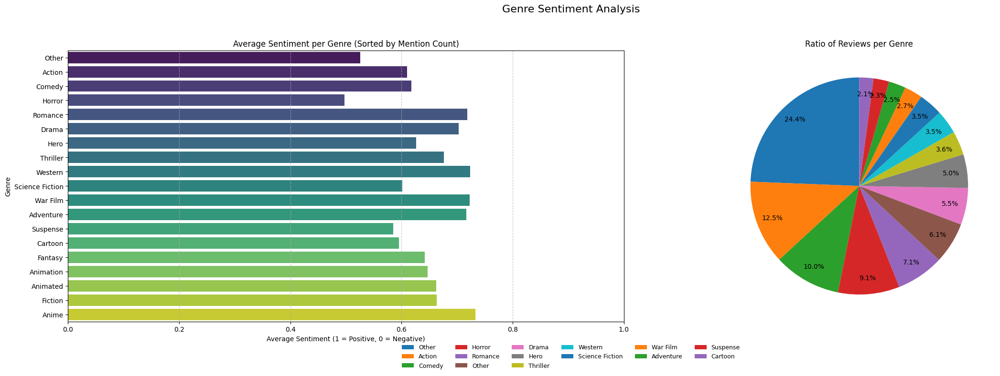

(<Figure size 2400x800 with 2 Axes>,
 [<Axes: title={'center': 'Average Sentiment per Genre (Sorted by Mention Count)'}, xlabel='Average Sentiment (1 = Positive, 0 = Negative)', ylabel='Genre'>,
  <Axes: title={'center': 'Ratio of Reviews per Genre'}>])

In [56]:
reviews_with_index = reviews.reset_index().rename(columns={'index': 'review_index'})
genre_reviews = genre_reviews.merge(reviews_with_index[['review_index', 'sentiment']], on='review_index', how='left')
genre_reviews_exploded = genre_reviews.explode('extracted_genres')
genre_sentiment = (
    genre_reviews_exploded.groupby('extracted_genres')['sentiment']
    .agg(mean_sentiment='mean', mention_count='count')
    .reset_index()
    .rename(columns={'extracted_genres': 'genre'})
    .sort_values('mention_count', ascending=False)
)

def plot_genre_sentiment_bar(ax, genre_df):
    sns.barplot(
        x='mean_sentiment', y='genre', data=genre_df,
        palette='viridis', hue='genre', legend=False, ax=ax
    )
    ax.set_title('Average Sentiment per Genre (Sorted by Mention Count)')
    ax.set_xlabel('Average Sentiment (1 = Positive, 0 = Negative)')
    ax.set_ylabel('Genre')
    ax.set_xlim(0, 1) # Sentiment is between 0 and 1
    ax.grid(axis='x', linestyle='--', alpha=0.7)

def plot_genre_ratio(ax, genre_df, min_percentage=0.02):
    """
    Plot how much of the total each genre is of the total reviews.
    Groups small percentages into an 'Other' category and adds a legend.
    """
    total_reviews = genre_df['mention_count'].sum()
    genre_df['ratio'] = genre_df['mention_count'] / total_reviews

    # Group small percentages into 'Other'
    small_genres_mask = genre_df['ratio'] < min_percentage
    other_ratio = genre_df[small_genres_mask]['ratio'].sum()

    plot_df = genre_df[~small_genres_mask].copy()
    if other_ratio > 0:
        other_row = pd.DataFrame([{'genre': 'Other', 'ratio': other_ratio}])
        plot_df = pd.concat([plot_df, other_row], ignore_index=True)

    # Sort for better visualization (largest to smallest, 'Other' usually at the end)
    plot_df = plot_df.sort_values(by='ratio', ascending=False).reset_index(drop=True)

    wedges, texts, autotexts = ax.pie(
        plot_df['ratio'],
        labels=None, # Hide labels on the pie chart to use legend
        autopct='%1.1f%%',
        startangle=90,
        pctdistance=0.85
    )

    # Add legend
    ax.legend(wedges, plot_df['genre'],
              title="Genres",
              loc="center left",
              bbox_to_anchor=(1, 0, 0.5, 1))

    ax.set_title('Ratio of Reviews per Genre')
    ax.set_aspect('equal') # Equal aspect ratio ensures that pie is drawn as a circle.


plot_grid(
    plot_functions=[lambda ax: plot_genre_sentiment_bar(ax, genre_sentiment),
                    lambda ax: plot_genre_ratio(ax, genre_sentiment)],
    n_cols=2,
    figsize_per_plot=(12, 8),
    suptitle='Genre Sentiment Analysis',
    sharex=False,
    sharey=False,
    hide_empty_axes=True
)

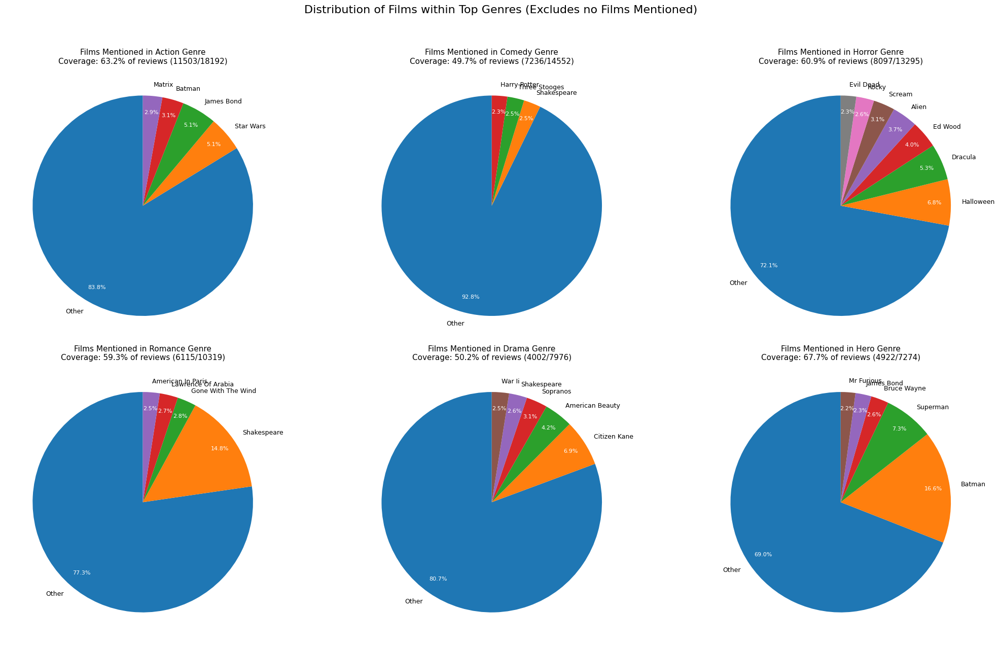

(<Figure size 2100x1400 with 6 Axes>,
 [<Axes: title={'center': 'Films Mentioned in Action Genre\nCoverage: 63.2% of reviews (11503/18192)'}>,
  <Axes: title={'center': 'Films Mentioned in Comedy Genre\nCoverage: 49.7% of reviews (7236/14552)'}>,
  <Axes: title={'center': 'Films Mentioned in Horror Genre\nCoverage: 60.9% of reviews (8097/13295)'}>,
  <Axes: title={'center': 'Films Mentioned in Romance Genre\nCoverage: 59.3% of reviews (6115/10319)'}>,
  <Axes: title={'center': 'Films Mentioned in Drama Genre\nCoverage: 50.2% of reviews (4002/7976)'}>,
  <Axes: title={'center': 'Films Mentioned in Hero Genre\nCoverage: 67.7% of reviews (4922/7274)'}>])

In [57]:
def make_genre_pie_plotter(genre: str, entity_col: str, min_percentage: float = 0.02):
    df_filtered = genre_reviews_exploded[genre_reviews_exploded['extracted_genres'] == genre]

    total_reviews_in_genre = len(df_filtered)

    if entity_col not in df_filtered.columns or df_filtered[entity_col].isnull().all():
        entity_counts = pd.Series(dtype=int)
    else:
        entity_counts = df_filtered[entity_col].dropna().value_counts()
        # Exclude empty strings or empty lists if present
        entity_counts = entity_counts[entity_counts.index != '']

    # Reviews that mention at least one entity
    has_entity = df_filtered[entity_col].apply(
        lambda x: isinstance(x, str) and x != '' or isinstance(x, list) and len(x) > 0
    )
    covered_count = has_entity.sum()
    coverage_pct = (covered_count / total_reviews_in_genre * 100) if total_reviews_in_genre > 0 else 0

    if entity_counts.empty:
        def empty_plotter(ax):
            ax.text(0.5, 0.5, 'No data for this genre and entity type', ha='center', va='center', transform=ax.transAxes)
            ax.set_title(f"{entity_col.replace('_', ' ').title()} in {genre} Genre")
            ax.set_aspect('equal')
        return empty_plotter

    total_mentions = entity_counts.sum()
    percentages = entity_counts / total_mentions
    small_entities_mask = percentages < min_percentage
    other_count = entity_counts[small_entities_mask].sum()

    plot_counts = entity_counts[~small_entities_mask]
    if other_count > 0:
        plot_counts['Other'] = other_count

    plot_counts = plot_counts.sort_values(ascending=False)

    def plotter(ax):
        wedges, texts, autotexts = ax.pie(
            plot_counts.values,
            labels=plot_counts.index,
            autopct='%1.1f%%',
            startangle=90,
            pctdistance=0.85
        )
        for autotext in autotexts:
            autotext.set_color('white')
            autotext.set_fontsize(8)
        for text in texts:
            text.set_fontsize(9)

        ax.set_title(
            f"{entity_col.replace('_', ' ').title()} in {genre} Genre\n"
            f"Coverage: {coverage_pct:.1f}% of reviews ({covered_count}/{total_reviews_in_genre})",
            fontsize=11
        )
        ax.set_aspect('equal')

    return plotter

top_genres = genre_sentiment.nlargest(7, 'mention_count')['genre'].tolist()

plotter_fns = []

for genre in top_genres:
    # Do not include "Other"
    if genre == 'Other':
        continue
    plotter_fns.append(make_genre_pie_plotter(genre, 'films_mentioned'))

# Adjust figsize_per_plot based on the number of plots to ensure readability
plot_grid(
    plot_functions=plotter_fns,
    n_cols=3,
    figsize_per_plot=(7, 7),
    suptitle='Distribution of Films within Top Genres (Excludes no Films Mentioned)',
    sharex=False,
    sharey=False,
    hide_empty_axes=True
)

# The Results and Business Implications

Based on all our results, practical business applications include:

1.	Studios can aggregate semantic patterns to identify when audience interest in certain genres is fading and when niche sub genres are gaining momentum. Tracking these shifts across large volumes of reviews enables smarter decisions about which films to acquire, promote, or greenlight, reducing investment risk and highlighting emerging categories with strong potential.
2.	If pre release sentiment is much stronger than post release sentiment, it indicates that early marketing created expectations the film did not meet. With both NER and EDA, marketing teams see what went wrong, allowing them to shift spending from broad awareness to targeted messaging, retention efforts, or damage control strategies.
3.	Extracting entities and keywords from reviews helps quantify which people, franchises, or narrative elements drive positive or negative sentiment. This reveals which talent or story components consistently boost or lower audience perception.
4.	Choosing the right model depends on balancing transparency, accuracy, latency, and hardware constraints. Traditional ML models offer fast, low cost inference ideal for high volume, real time pipelines, while LLMs deliver higher accuracy at significantly greater computational expense. Understanding these tradeoffs ensures engineering teams deploy models that align with operational and cost requirements.
5.	Real time sentiment monitoring helps studios spot sudden drops that may signal controversies backlash tied to specific individuals or themes. Early detection lets communications teams intervene before negative narratives dominate social channels, reducing reputational damage and supporting faster, more controlled response strategies during critical release windows.
